# Augmentation

## Imports

In [ ]:
%load_ext autoreload
%autoreload 2
# This will automatically reload modules before executing code that depends on them.

from copy import deepcopy
from functools import partial
from pprint import pprint

# 3rd party imports
import numpy as np
np.set_printoptions(linewidth=1000)
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
from scipy.interpolate import griddata

# local imports
from modules import jacobian
from modules.data_fixed import Data
from modules.data import Data as Data_Moving
from modules.inspect_utils import (
    get_point_info, get_expanding_coordinates, get_contracting_coordinates,
    get_mapped_point, get_displacement,
)
from modules.upscaling import upscale_dvf_preserve, upscale_dvf_linear_y
from cluster_modules import cluster, data_utils, reg_utils
from cluster_modules.viz import jacobian_plot as _jacobian_plot
from cluster_modules.grid import (
    interpolate_coordinates,
    upscale_grid_values,
    upscale_grid_with_priors,
    boundary_points_on_grid,
    export_interpolated_grid_to_csv,
)
from cluster_modules.plotting import plot_point_correspondences
from cluster_modules.printing import (
    print_coord_list,
    print_interpolated_coords_grid,
    print_fixed_at_moving,
)

# Default to paper-figure styling in this notebook
jacobian_plot = partial(_jacobian_plot, paper=True)


## Create sample datasets

Plotted 30 point correspondences
Set 1 - X range: [50.0, 150.0], Y range: [50.3, 149.7]
Set 2 - X range: [82.8, 217.2], Y range: [51.8, 148.2]
Correspondence distances - Mean: 58.73, Std: 14.59, Max: 83.64


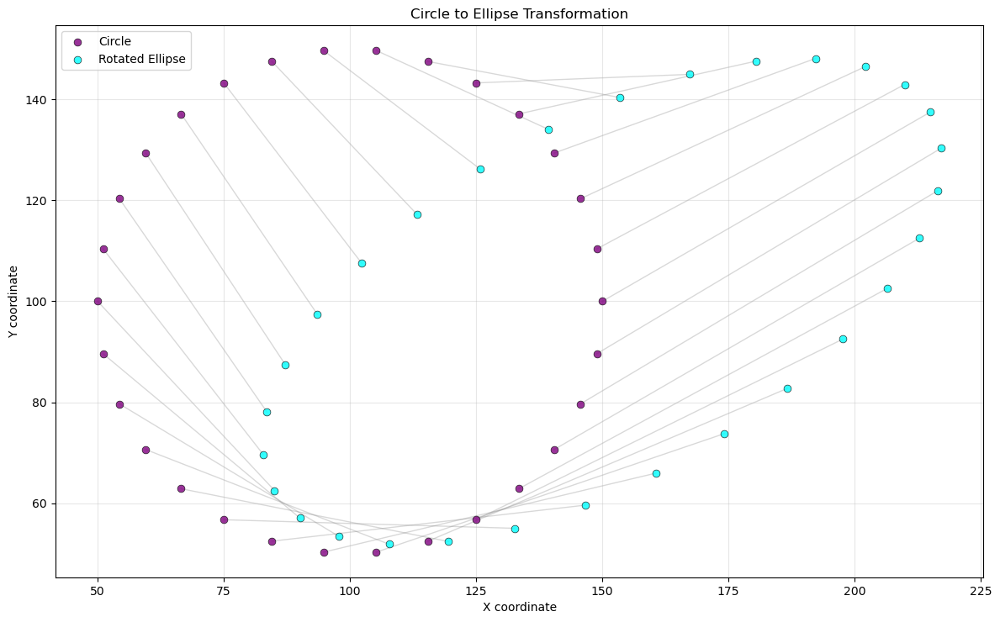

In [2]:
circle_points, ellipse_points = data_utils.circle_to_ellipse_correspondences()

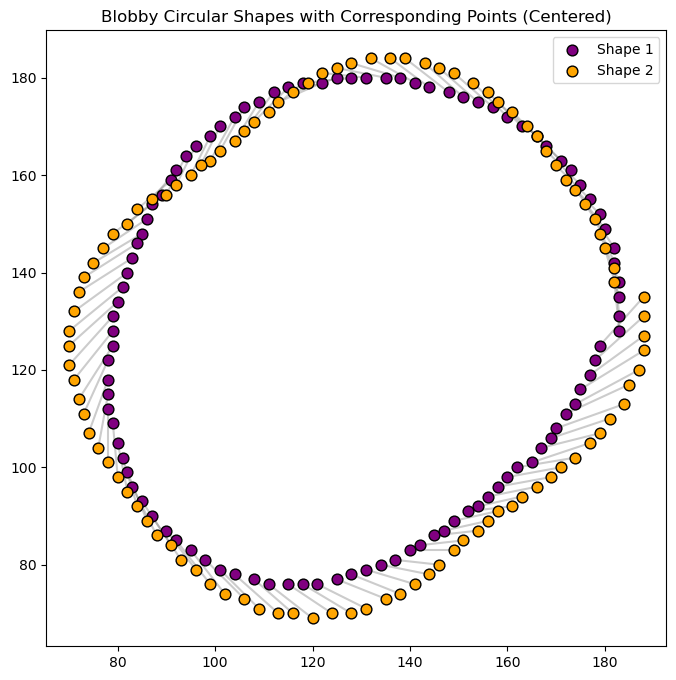

In [3]:
blob1, blob2 = data_utils.create_blobby_circular_shapes(n_points=100, plot=True, noise_scale=6)

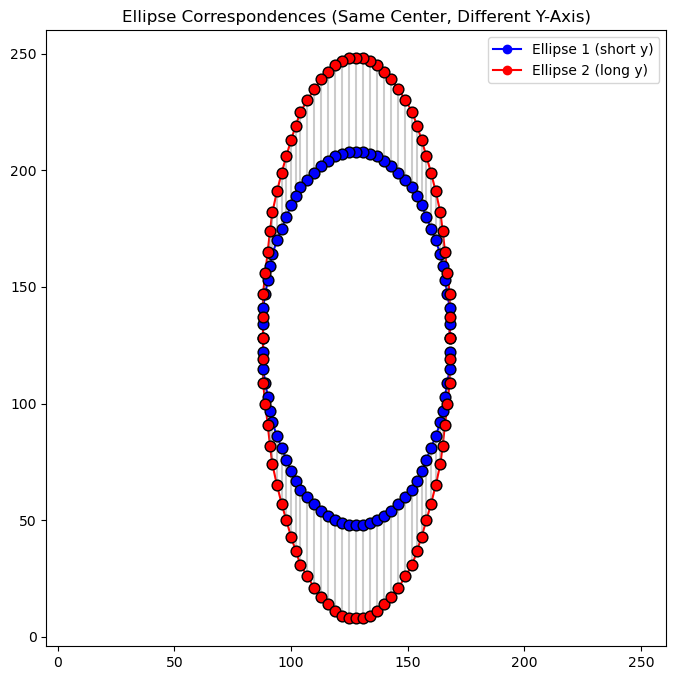

In [4]:
ellipse1, ellipse2 = data_utils.create_ellipse_correspondences(n_points=80, plot=True)

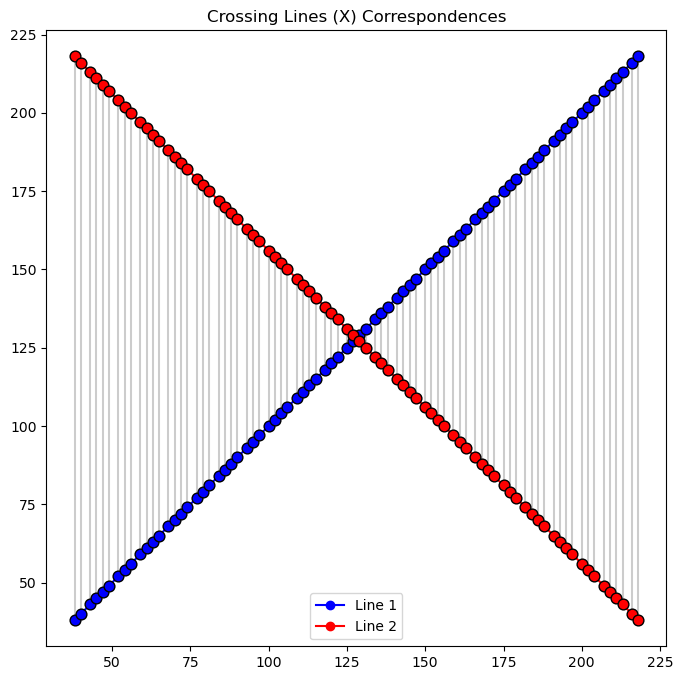

In [5]:
line1, line2 = data_utils.create_crossing_lines_correspondences(n_points=80, plot=True)

In [ ]:
from cluster_modules.synthetic import square_to_circle_correspondences

# Usage example
square_pts, circle_pts = square_to_circle_correspondences(n_points=100, circle_radius=0.5)
plt.scatter(square_pts[:,0], square_pts[:,1], label='Square')
plt.scatter(circle_pts[:,0], circle_pts[:,1], label='Circle')
for i in range(len(square_pts)):
    plt.plot([square_pts[i,0], circle_pts[i,0]], [square_pts[i,1], circle_pts[i,1]], 'k-', alpha=0.2)
plt.legend()
plt.axis('equal')
plt.show()

In [ ]:
from cluster_modules.synthetic import circle_to_circle_correspondences

# Usage example
inner_pts, outer_pts = circle_to_circle_correspondences(n_points=100, resolution=(128, 128), inner_radius=0.15, outer_radius=0.25)
plt.scatter(inner_pts[:,0], inner_pts[:,1], label='Inner Circle')
plt.scatter(outer_pts[:,0], outer_pts[:,1], label='Outer Circle')
for i in range(len(inner_pts)):
    plt.plot([inner_pts[i,0], outer_pts[i,0]], [inner_pts[i,1], outer_pts[i,1]], 'k-', alpha=0.2)
plt.legend()
plt.axis('equal')
plt.show()

# Create data

## Parameters

In [38]:
resolution = (256, 256)  # Example resolution for the data
num_points_skip = 1  # Skip every 5th point for better visualization
shift_distance = 100  # Distance to shift the moving and fixed points from each other (try 100 for max distance)
cluster_method = 'y_direction'
m_data = None
f_data = None

## Full Laplacian


=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 206 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [20.0, 36.0]
Set 2 - X range: [25.0, 230.0], Y range: [220.0, 236.0]
Correspondence distances - Mean: 200.00, Std: 10.92, Max: 216.00


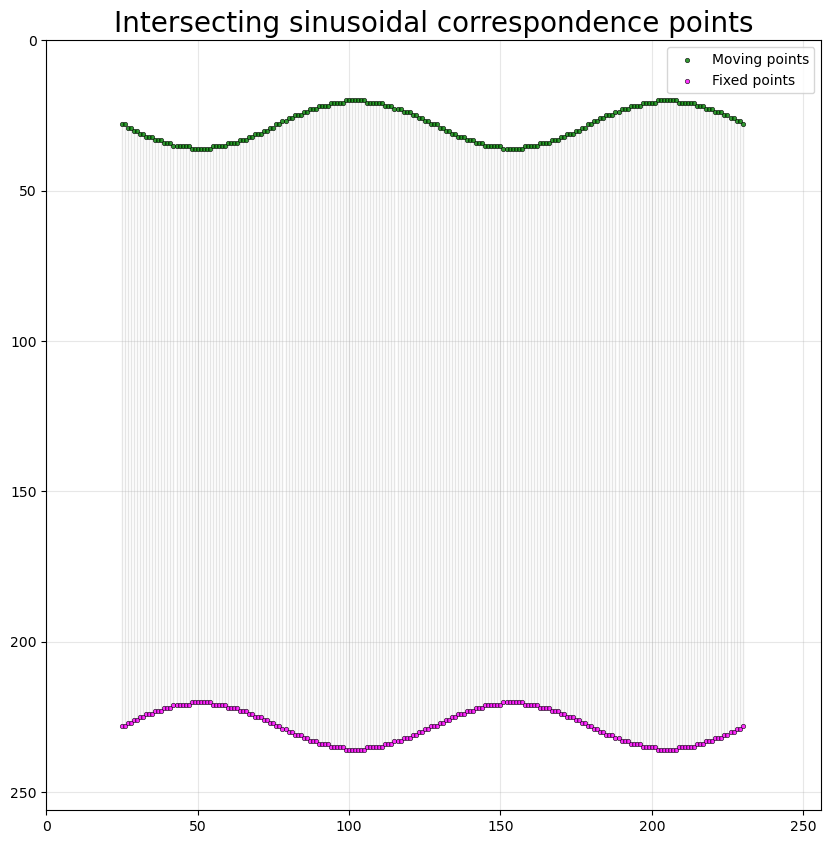

Analyzing 206 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 1
Cluster 0: 206 points (indices: [0, 1, 2, 3, 4]...)
  Mean displacement: Z=0.000, Y=200.000, X=0.000
  Std displacement:  Z=0.000, Y=10.915, X=0.000
ERROR: Error getting cluster indices. Ensure the points are in the correct format and the correct method is used (y_direction or x_direction). Using half of the points as down_indices and the other half as up_indices.


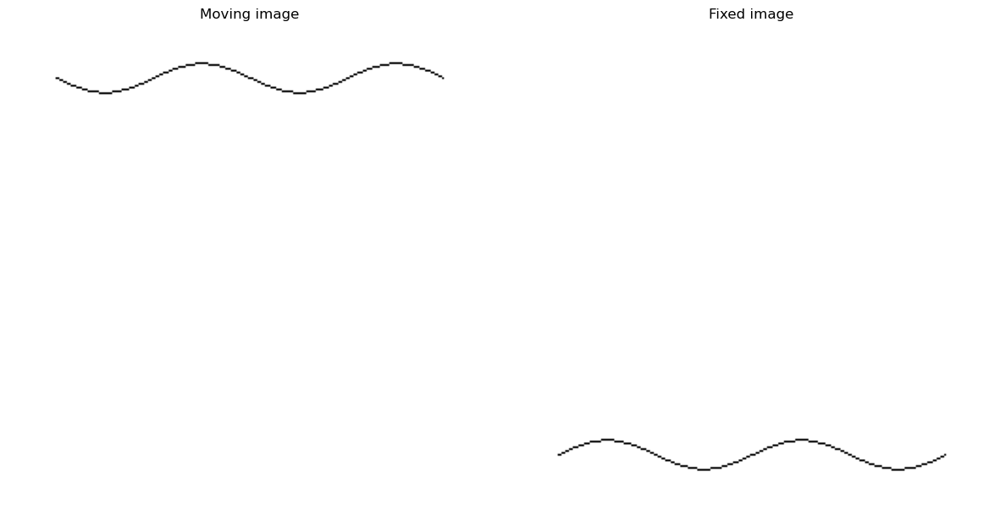

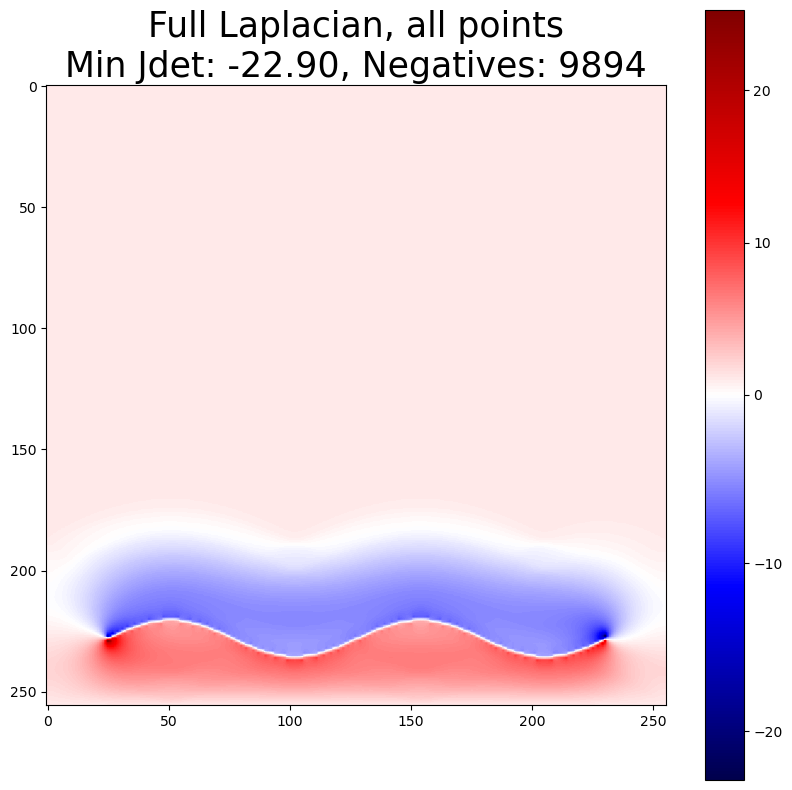

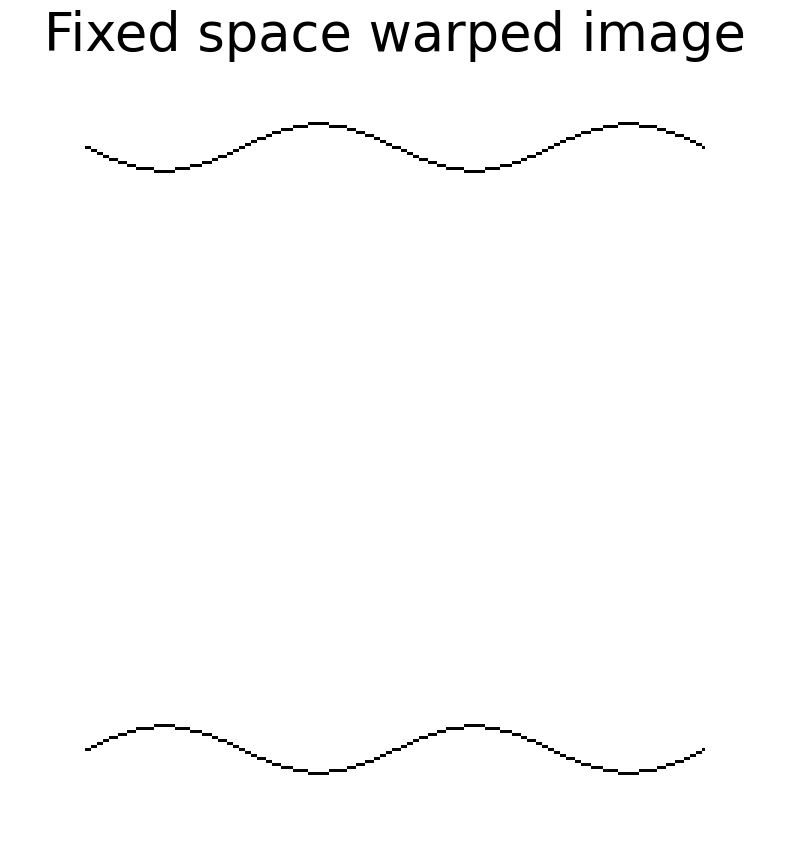

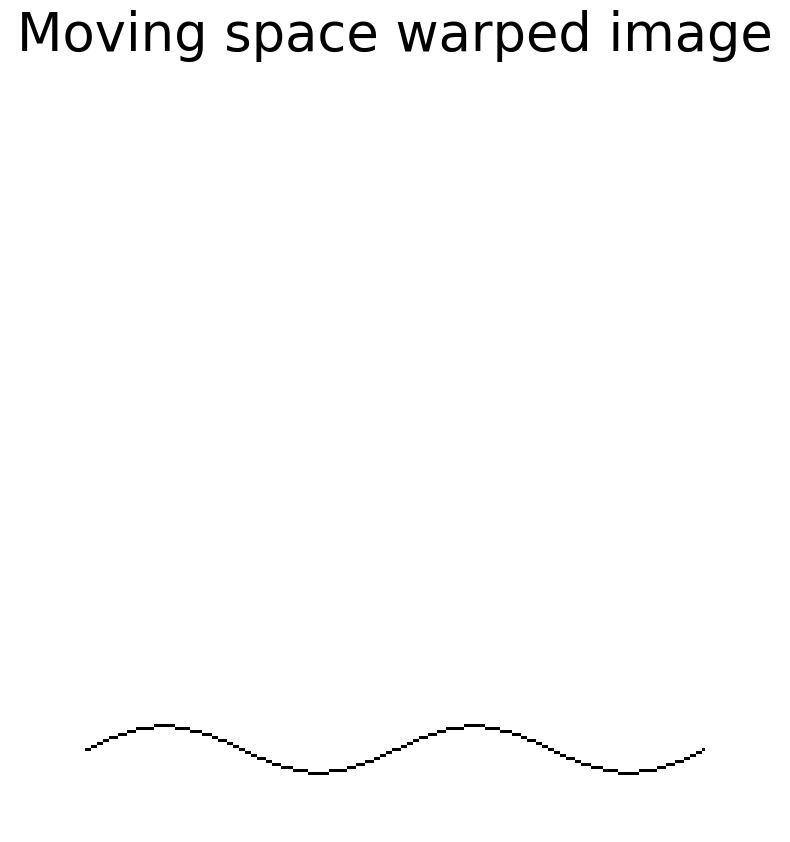

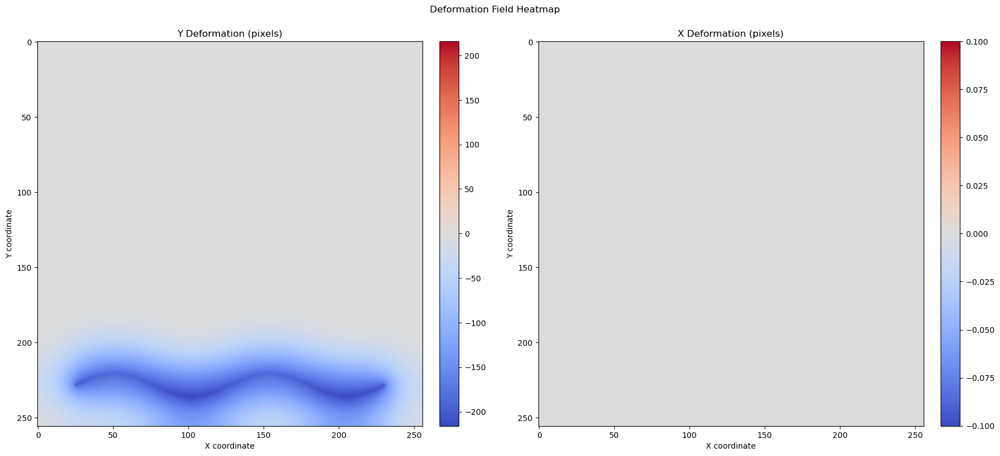

fdata.shape (1, 256, 256)
Time taken to create A:  0.07851958274841309
||Ax - b||: 28.45
Mean error at correspondences: 200.0


In [39]:
#####################################################################################################
# SETUP 
#####################################################################################################

# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
helix_wave1, helix_wave2, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

# Swap with other data if provided
if m_data is not None:
    helix_wave1 = m_data
if f_data is not None:
    helix_wave2 = f_data
    
# Move helix_waves aways from each other
helix_wave1[:, 1] += -shift_distance
helix_wave2[:, 1] += shift_distance

#helix_wave1[:, 1] += 20 # y
#helix_wave1[:, 0] += 20 # x

# Decrease point density for better visualization
helix_wave1 = helix_wave1[::num_points_skip]  # Take every second point
helix_wave2 = helix_wave2[::num_points_skip]  # Take every second point

# Plot the correspondences between the two helical waves
data_utils.plot_point_correspondences(helix_wave1, helix_wave2,
                          labels=('Moving points', 'Fixed points'),
                          colors=('green', 'magenta'),
                          title='Intersecting sinusoidal correspondence points',
                          show_indices=False,
                          line_alpha=0.2,  # More transparent lines to show the pattern better
                          point_size=10,
                          figsize=(10, 10))

# Swap columns to match expected format (x, y)
helix_wave1 = helix_wave1[:, [1, 0]]  # Swap to (y, x) format
helix_wave2 = helix_wave2[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
helix_wave1 = np.pad(helix_wave1, ((0, 0), (1, 0)), mode='constant', constant_values=0)
helix_wave2 = np.pad(helix_wave2, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Get the downwards and upwards clusters
try:
    cluster_indices, cluster_info = cluster.get_cluster_indices(helix_wave1, helix_wave2, method=cluster_method)
    down_indices = cluster_indices[0]
    up_indices = cluster_indices[1]
    raise Exception
except:
    print("ERROR: Error getting cluster indices. Ensure the points are in the correct format and the correct method is used (y_direction or x_direction). Using half of the points as down_indices and the other half as up_indices.")
    down_indices = [i for i in range(len(helix_wave1)//2)]
    up_indices = [i for i in range(len(helix_wave1)//2, len(helix_wave1))]

# Save to raw image
moving_img = data_utils.create_raw_image(helix_wave1, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(helix_wave2, resolution, save_path="wave2.png")
data_utils.show_2_pngs(moving_img, fixed_img, title1="Moving image", title2="Fixed image")

#####################################################################################################
# Run Laplacian
#####################################################################################################

d = Data(helix_wave1, helix_wave2, resolution)
d_m = Data_Moving(helix_wave1, helix_wave2, resolution)  # For moving image

d_original = deepcopy(d)  # Save original data for later use

d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10),
       title=f"Full Laplacian, all points\nMin Jdet: {d.min():.2f}, Negatives: {d.count_negatives()}")
transformed_img = reg_utils.apply_transformation_fixed(d, moving_img, title="Fixed space warped image")
transformed_img_moving = reg_utils.apply_transformation(d_m, moving_img, title="Moving space warped image")

reg_utils.deformation_heatmap(d, title="Deformation Field Heatmap")

_, _, _, total_err = reg_utils.compute_error_fixed(d.resolution, helix_wave1, helix_wave2, d.deformation)
print(f"||Ax - b||: {total_err:.2f}")
errors = reg_utils.correspondence_error(d.deformation, helix_wave1, helix_wave2)
print("Mean error at correspondences:", np.mean(errors))
#rint("Max error at correspondences:", np.max(errors))

In [ ]:
from cluster_modules.viz import show

show(d, px=pt, figsize=(12, 12))

In [ ]:
# Find the index of the row in an array where the values match (0, 120, 206)
from cluster_modules.viz import find_index

# Example usage:
idx = find_index(helix_wave1, (0, 120, 206))
print("Index of (0, 120, 206):", idx)

print(helix_wave1[181])
print(helix_wave2[181])

#print(helix_wave1)

# Run ANTs

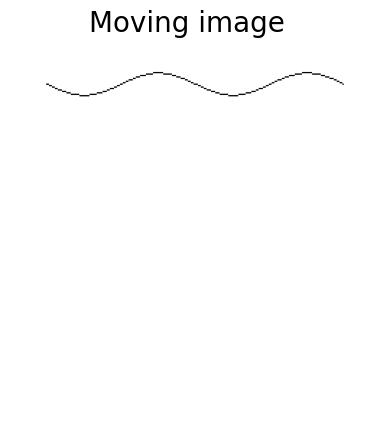

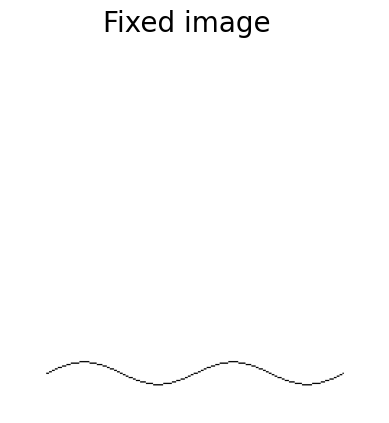

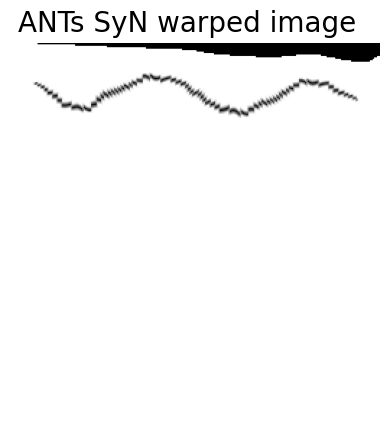

In [97]:
import ants

# Convert numpy arrays to ANTs images
moving_ants = ants.from_numpy(moving_img.T)
fixed_ants = ants.from_numpy(fixed_img.T)

# Perform registration (SyN is typical for nonrigid)
reg = ants.registration(
    fixed=fixed_ants,
    moving=moving_ants,
    type_of_transform='SyN'
)

# Get the warped image
warped_moving = reg['warpedmovout']

# Show result
ants.plot(moving_ants, title='Moving image')
ants.plot(fixed_ants, title='Fixed image')
ants.plot(warped_moving, title='ANTs SyN warped image')

#  Run elastix

In [ ]:
from modules.elastix_wrapper import ElastixWrapper


In [44]:
# Assume fixed_np and moving_np are your NumPy arrays
fixed_np = fixed_img.copy()
moving_np = moving_img.copy()

# Create wrapper
elx = ElastixWrapper()

import glob

param_files = sorted(glob.glob("elx_out/TransformParameters.*.txt"))
print("Transform files found:", param_files)


# Register images
result = elx.register(
    fixed_array=fixed_np,
    moving_array=moving_np,
    param_files=["001_parameters_Rigid.txt", "002_parameters_BSpline.txt"],
    output_dir="elx_out"
)

np.save("registered.npy", result)

# Get deformation field
#deformation = elx.get_deformation_field("elx_out")
#np.save("deformation.npy", deformation)

# Warp another image using computed transform
#other_moving = np.load("moving_modality.npy")
#warped_other = elx.apply_transform(other_moving, "elx_out")
#np.save("warped_other.npy", warped_other)



Transform files found: ['elx_out\\TransformParameters.0.txt', 'elx_out\\TransformParameters.1.txt']
[INFO] Running: elastix/elastix.exe -f elx_out\fixed.nii.gz -m elx_out\moving.nii.gz -out elx_out -p 001_parameters_Rigid.txt -p 002_parameters_BSpline.txt


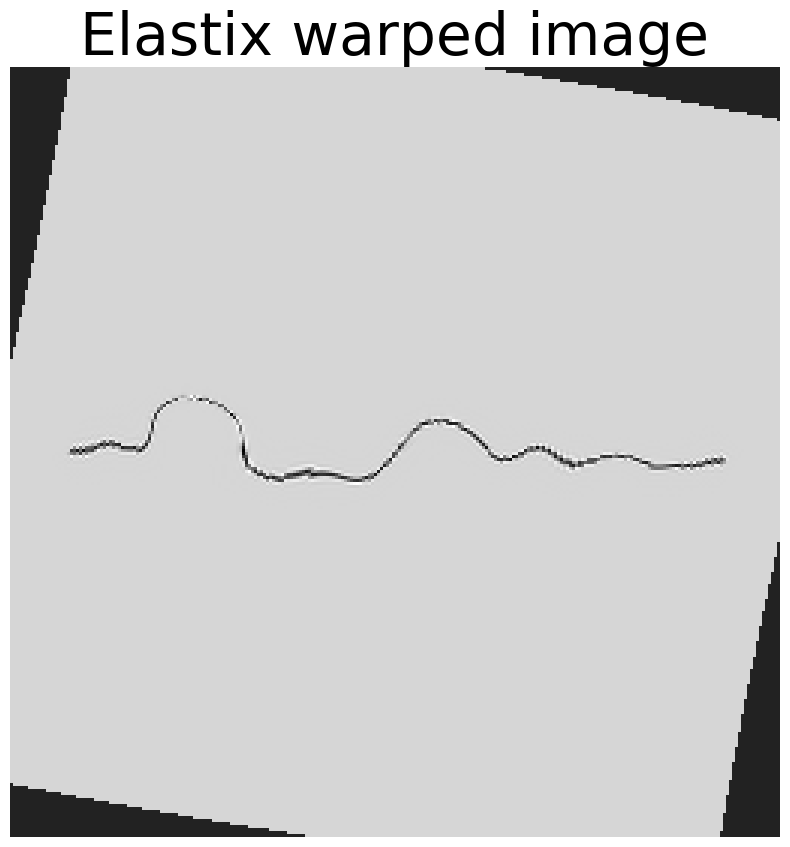

In [45]:
# Visualize result
import matplotlib.pyplot as plt
import nibabel as nib
reg_result = nib.load("elx_out/result.1.nii").get_fdata()
plt.figure(figsize=(10, 10))
plt.imshow(reg_result.T, cmap='gray')
plt.axis('off')
plt.title('Elastix warped image', fontsize=42)
plt.show()

# Laplacian upscaling

## Fixed space

In [12]:
import nibabel as nib

mdata_path = "data/corrected_correspondences_count_touching/mpoints.npy"
fdata_path = "data/corrected_correspondences_count_touching/fpoints.npy"
brain_img_path = "data/corrected_correspondences_count_touching/registered_output/elastixRefined.nii.gz"
annotation_path = "data/CCF_DATA/annotation_25.nii.gz"
CURR_IDX = 500


# Load the annotation and average images
mdata = np.load(mdata_path)
fdata = np.load(fdata_path)
brain_img = nib.load(brain_img_path).get_fdata()[CURR_IDX, :, :]
annotation_img = nib.load(annotation_path).get_fdata()[CURR_IDX, :, :]  # Get the specific z slice

# Get only elements that are of the current index
mdata = mdata[mdata[:, 0] == CURR_IDX]
fdata = fdata[fdata[:, 0] == CURR_IDX]
mdata[:, 0] = 0
fdata[:, 0] = 0

# Get every N points
N = 3  # 3 for 350, 2 otherwise
mdata = mdata[::N]
fdata = fdata[::N]
#resolution = np.zeros((1, 320, 456))


=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10


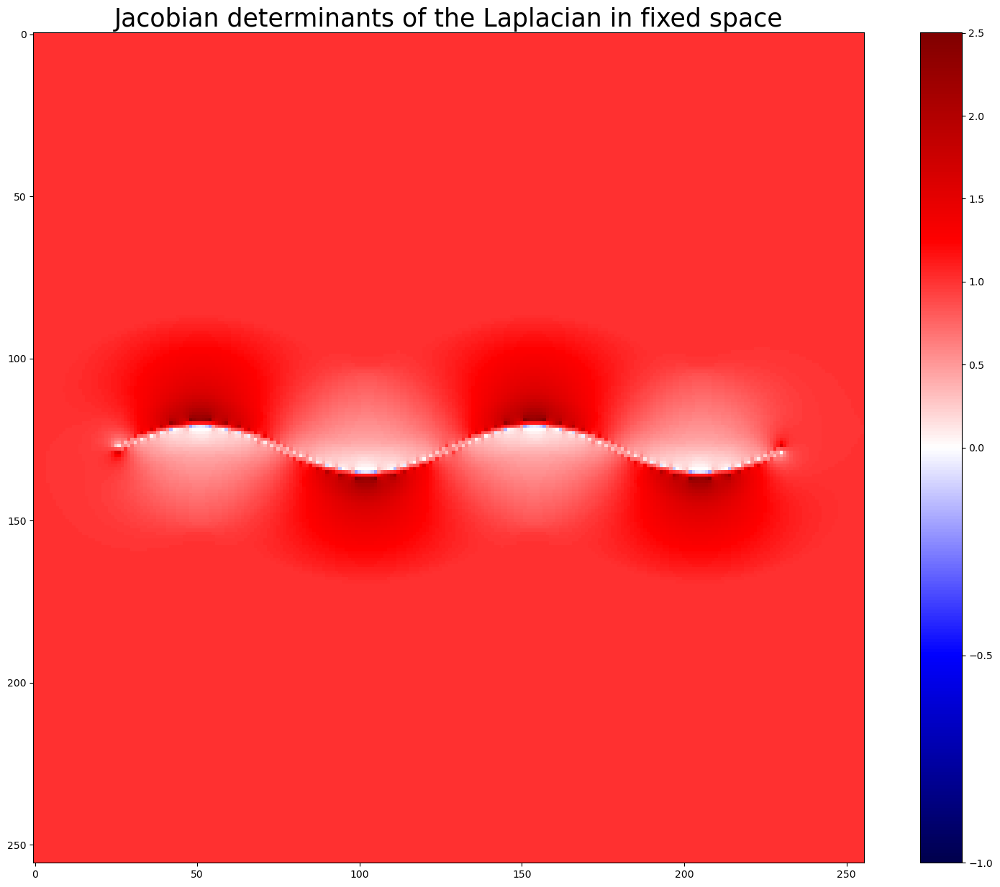

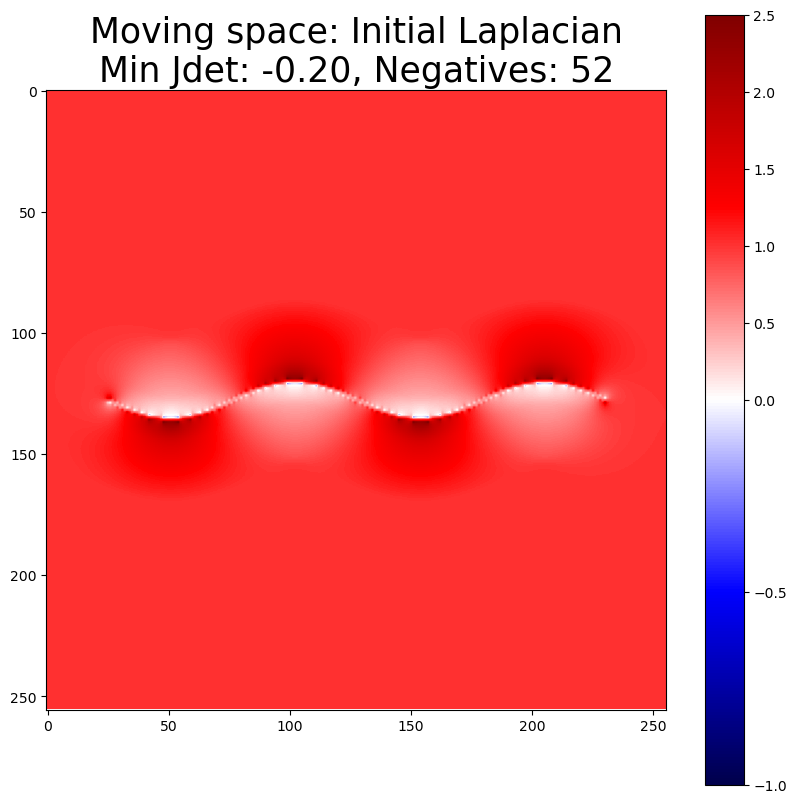

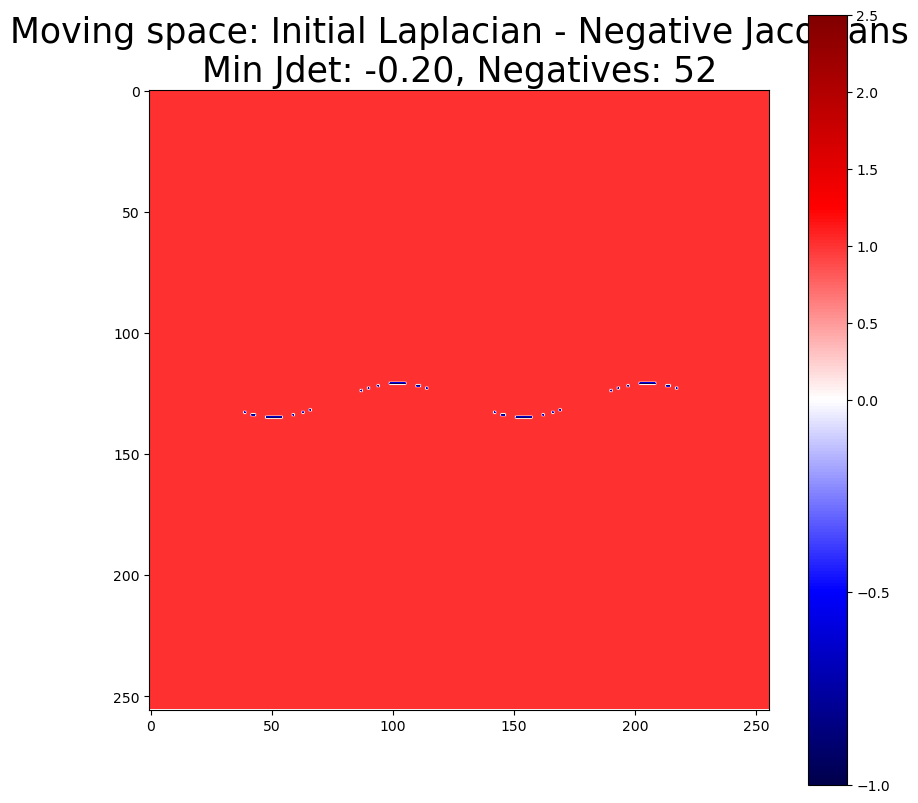

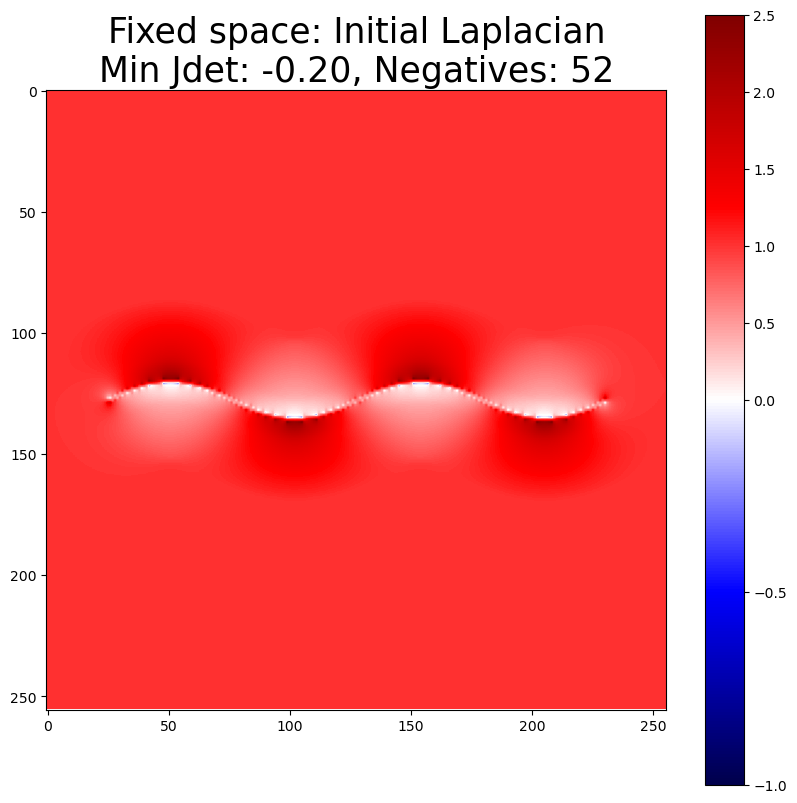

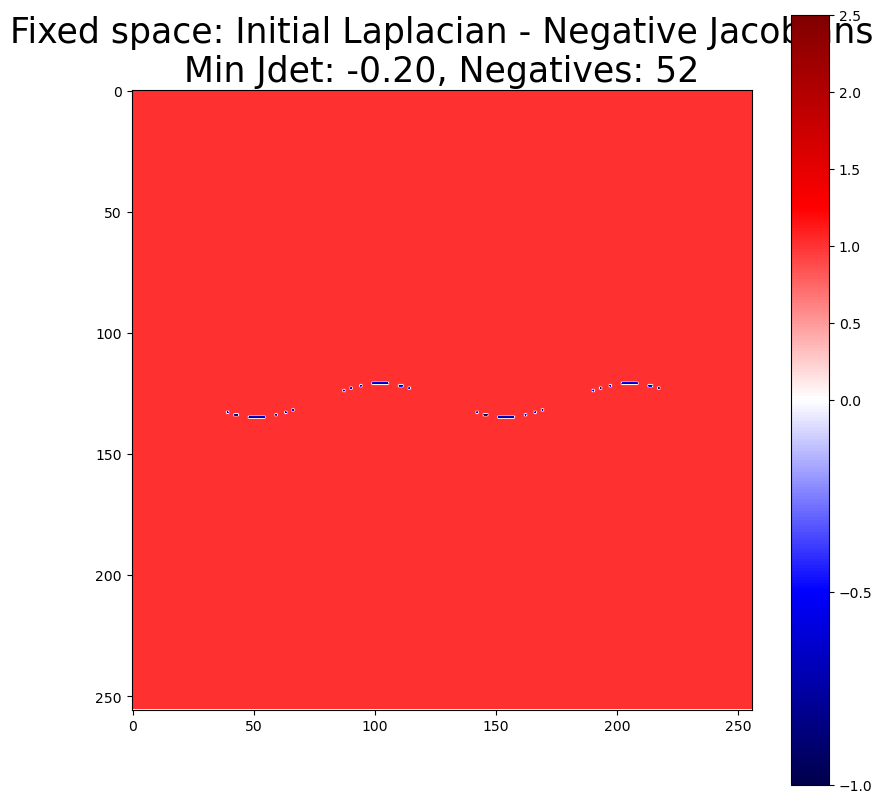

Found 96 expanding Jacobian determinants with threshold 2.0.

New fixed points shape: (96, 3)
New moving points shape: (96, 3)
Cleaned new fixed points shape: (96, 3)
Cleaned new moving points shape: (96, 3)


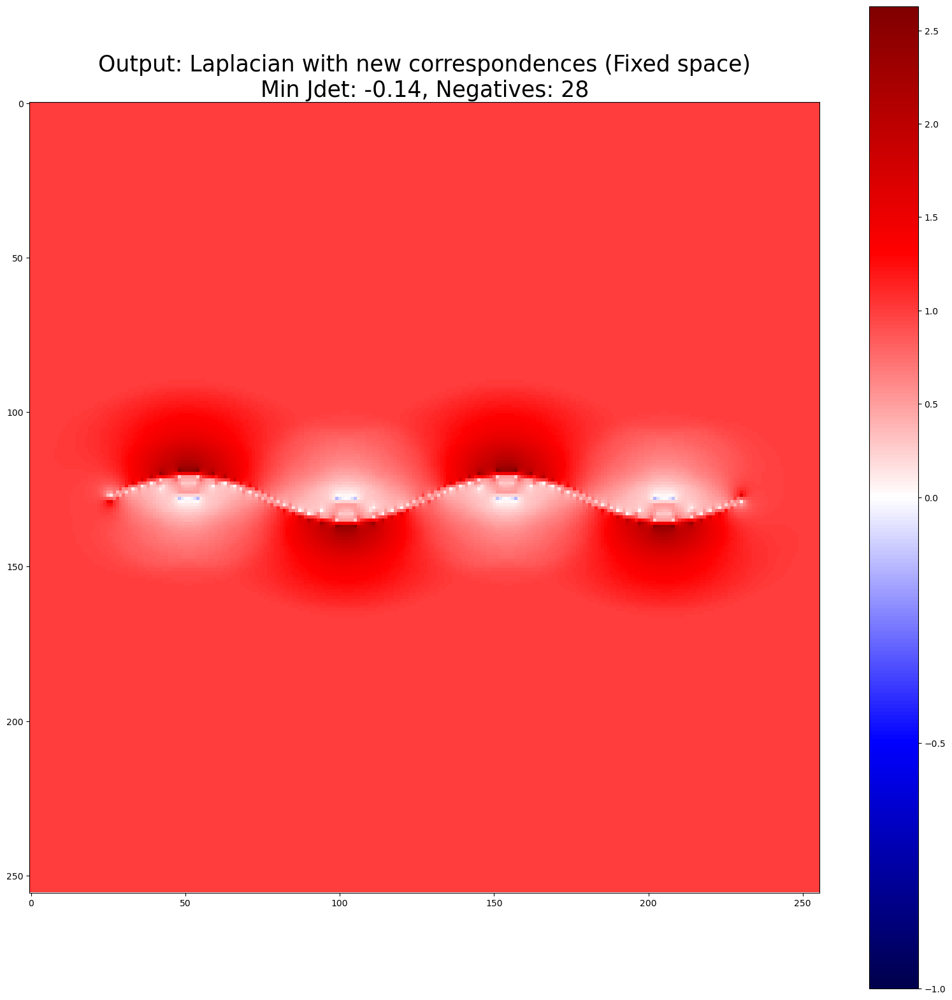

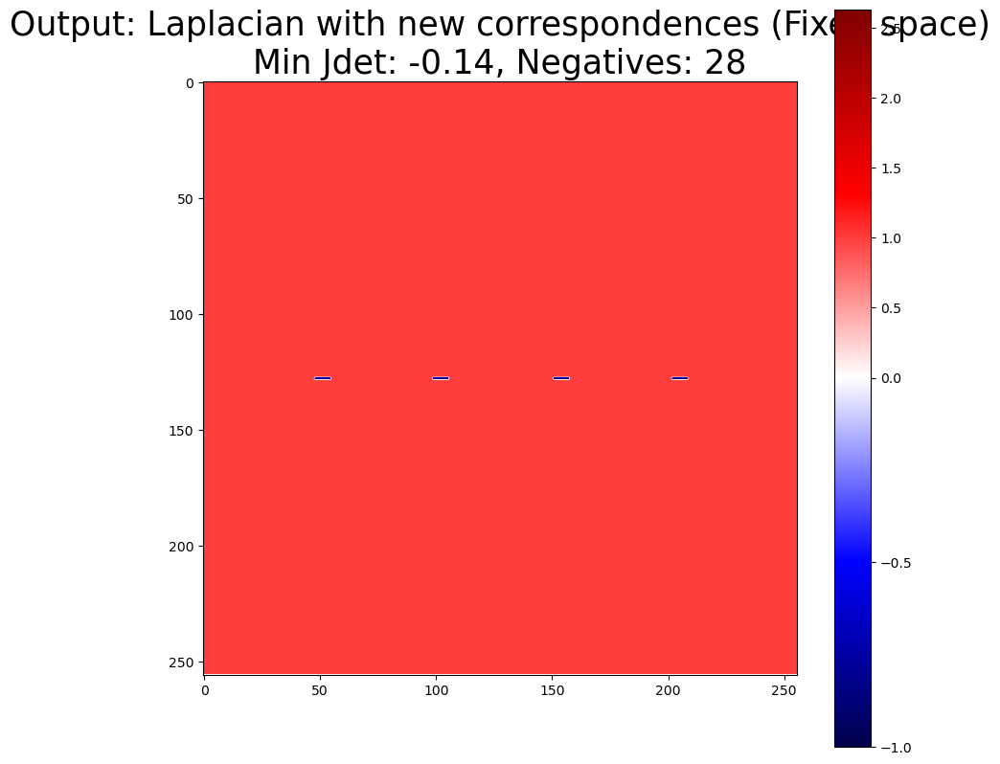

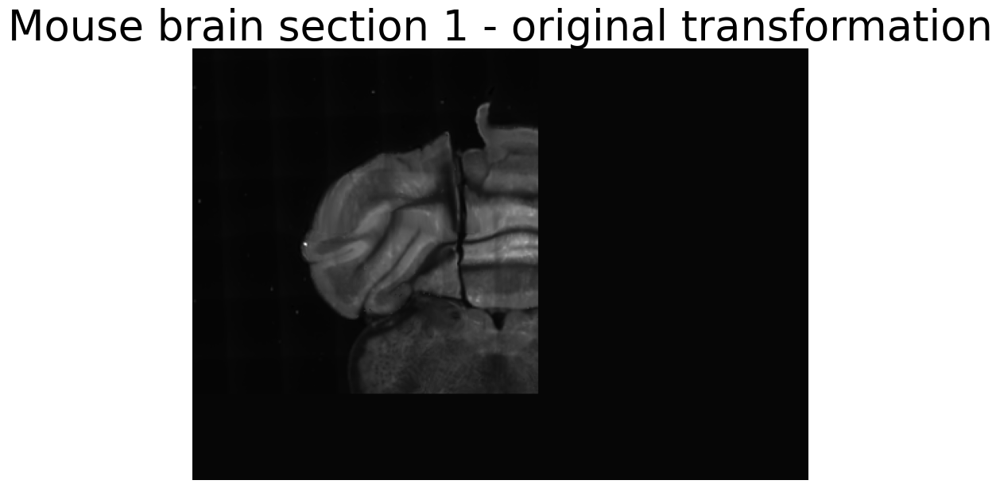

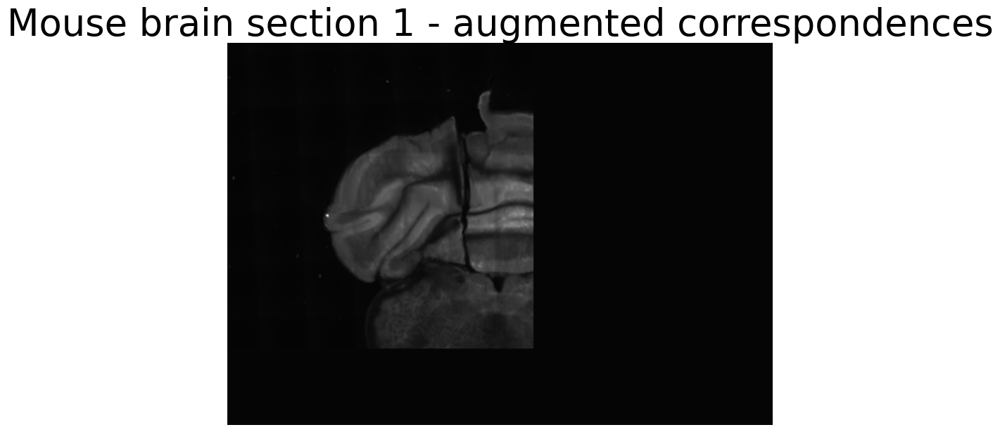

In [13]:
scale = 3
jdet_threshold = 2.0
verbose = False
resolution = (256, 256)
# Remove point pairs where the distance between new_mpoints and new_fpoints is above a threshold
magnitude_thresh = 9999  # 100 elsewhere
plot_points = True


# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

#mpoints = mdata
#fpoints = fdata

d_fixed = Data(mpoints, fpoints, resolution)
#d_moving = np.load("d_moving.npy", allow_pickle=True).item()
#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 15),
#       title=f"Jacobian determinants of the Laplacian in moving space")
d_moving = Data_Moving(mpoints, fpoints, resolution)

upscaled_fixed = upscale_dvf_preserve(d_fixed.deformation, scale=scale)
upscaled_moving = upscale_dvf_preserve(d_moving.deformation, scale=scale)

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 15), binarize_negatives=False,
       title=f"Jacobian determinants of the Laplacian in fixed space")


d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
       title=f"Moving space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
       title=f"Fixed space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")


########### EDIT:  DO IT IN MOVING SPACE ###########
#d_fixed = d_moving


expanding_coord = get_expanding_coordinates(d_moving.jdet_field, threshold=jdet_threshold, verbose=False)
# Remove points that occur in the fixed points set
expanding_coord = np.array([coord for coord in expanding_coord if tuple(coord) not in set(map(tuple, d_moving.fpoints[:, 1:]))])

# For each expanding coordinate, get the adjacent coordinates in the upscaled deformation field
print()

new_mpoints = []
new_fpoints = []
for y, x in expanding_coord:
    # Get the corresponding coordinates in the upscaled deformation field
    y_curr = y * scale
    x_curr = x * scale
    displacement_curr = upscaled_fixed[:, 0, y_curr, x_curr]
    mapped_point_curr = np.array((y + displacement_curr[1], x + displacement_curr[2]))
    
    # Left and right coordinates in the upscaled deformation field
    x_left = x_curr - 1
    x_right = x_curr + 1
    y_up = y_curr - 1
    y_down = y_curr + 1
    
    displacement_left = upscaled_fixed[:, 0, y_curr, x_left]
    displacement_left_1 = upscaled_fixed[:, 0, y_curr, x_left - 1]
    displacement_right = upscaled_fixed[:, 0, y_curr, x_right]
    displacement_right_1 = upscaled_fixed[:, 0, y_curr, x_right + 1]
    displacement_up = upscaled_fixed[:, 0, y_up, x_curr]
    displacement_up_1 = upscaled_fixed[:, 0, y_up - 1, x_curr]
    displacement_down = upscaled_fixed[:, 0, y_down, x_curr]
    displacement_down_1 = upscaled_fixed[:, 0, y_down + 1, x_curr]
    
    mapped_point_left = np.array((y + displacement_left[1], x + displacement_left[2]))
    mapped_point_left_1 = np.array((y + displacement_left_1[1], x + displacement_left_1[2]))
    mapped_point_right = np.array((y + displacement_right[1], x + displacement_right[2]))
    mapped_point_right_1 = np.array((y + displacement_right_1[1], x + displacement_right_1[2]))
    mapped_point_up = np.array((y + displacement_up[1], x + displacement_up[2]))
    mapped_point_up_1 = np.array((y + displacement_up_1[1], x + displacement_up_1[2]))
    mapped_point_up_neighbor = np.array((y - 1 + upscaled_fixed[:, 0, y_curr - 3], x + upscaled_fixed[:, 0, y_curr - 3]))
    mapped_point_down = np.array((y + displacement_down[1], x + displacement_down[2]))
    mapped_point_down_1 = np.array((y + displacement_down_1[1], x + displacement_down_1[2]))
    
    # Print the information
    if verbose:
        print(f"Expanding coordinate ({y}, {x}) in original field corresponds to ({y_curr}, {x_curr}) in upscaled field.")
        print(f"Deformation vector at this point: {displacement_curr}")
        #print(f"Mapped point in moving space: {mapped_point_curr} = {np.round(mapped_point_curr)}")
        
        #print(f"Left point - 2 ({y_curr//scale}, {(x_left-1)/scale:.2f}) -> Mapped: {mapped_point_left_1} = {np.round(mapped_point_left_1)}")
        print(f"Left point - 1 \t({y_curr//scale}, {x_left/scale:.2f}) \t-> Mapped: {mapped_point_left} = {np.round(mapped_point_left)}")
        
        #print(f"Right point + 2 ({y_curr//scale}, {(x_right + 1)/scale:.2f}) -> Mapped: {mapped_point_right_1} = {np.round(mapped_point_right_1)}")
        #print(f"Up neighbor \t({(y_up - 2)//scale}, {x_curr//scale}) \t-> Mapped: {mapped_point_up_neighbor} = {np.round(mapped_point_up_neighbor)}")
        #print(f"Up point - 2 \t({(y_up - 1)/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_up_1} = {np.round(mapped_point_up_1)}")
        print(f"Up point - 1 \t({y_up/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_up} = {np.round(mapped_point_up)}")
        print(f"Current point \t({y_curr//scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_curr} = {np.round(mapped_point_curr)}")
        print(f"Down point + 1\t({y_down/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_down} = {np.round(mapped_point_down)}")
        print(f"Right point + 1\t({y_curr//scale}, {x_right/scale:.2f}) \t-> Mapped: {mapped_point_right} = {np.round(mapped_point_right)}")
        #print(f"Down point + 2 \t({(y_down + 1)/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_down_1} = {np.round(mapped_point_down_1)}")
    
    # Of all of the mapped points, find the mapped point that is closest to an integer coordinate
    mapped_points = [mapped_point_left, mapped_point_right, mapped_point_up, mapped_point_down, mapped_point_curr]
    closest_point = min(mapped_points, key=lambda p: np.linalg.norm(p - np.round(p)))
    if verbose:
        print(f"Closest mapped point to integer coordinate: {closest_point} = {np.round(closest_point)}")
        print()
        print()
        
    #closest_point = np.round(closest_point).astype(int)

    #new_fpoints.append([0, y, x])
    #new_mpoints.append([0, closest_point[0], closest_point[1]])
    
    # Now, moving point is [0, y, x], fixed point is [0, closest_point[0], closest_point[1]]
    new_mpoints.append([0, y, x])
    #new_fpoints.append([0, closest_point[0], closest_point[1]])
    #new_fpoints = [np.round(get_mapped_point(f[1:], d_moving.deformation)).astype(int) for f in new_mpoints]
    # Add zero to the first axis for Data class compatibility
    new_fpoints = [np.concatenate([[0], np.round(get_mapped_point(f[1:], d_moving.deformation)).astype(int)]) for f in new_mpoints]
    
    
    
# Convert to numpy arrays for consistency
new_fpoints = np.array(new_fpoints)
new_mpoints = np.array(new_mpoints)
    
print("New fixed points shape:", new_fpoints.shape)
print("New moving points shape:", new_mpoints.shape)


# Remove duplicates as before
new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])


# Compute distances for each pair
distances = np.linalg.norm(new_mpoints[:, 1:] - new_fpoints[:, 1:], axis=1)

# Create a mask for pairs within the threshold
mask = distances < magnitude_thresh

# Filter both arrays using the mask
new_mpoints = new_mpoints[mask]
new_fpoints = new_fpoints[mask]


# If a new moving point is already in the original mpoints, remove it and its corresponding fixed point
#new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
#new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])

# If a new fixed point is already in the original fpoints, remove it and its corresponding moving point
#new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
#new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])  

print("Cleaned new fixed points shape:", new_fpoints.shape)
print("Cleaned new moving points shape:", new_mpoints.shape)

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# Create a new Data object with the updated points
d_expanded = Data(mpoints, fpoints, resolution)
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 20), binarize_negatives=False,
       title=f"Output: Laplacian with new correspondences (Fixed space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
       title=f"Output: Laplacian with new correspondences (Fixed space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")




# Save to raw image
moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave2.png")

original_transformation = reg_utils.apply_transformation_fixed(d_fixed, brain_img, title="Mouse brain section 1 - original transformation")
transformed_img = reg_utils.apply_transformation_fixed(d_expanded, brain_img, title="Mouse brain section 1 - augmented correspondences")


### Comparison plots

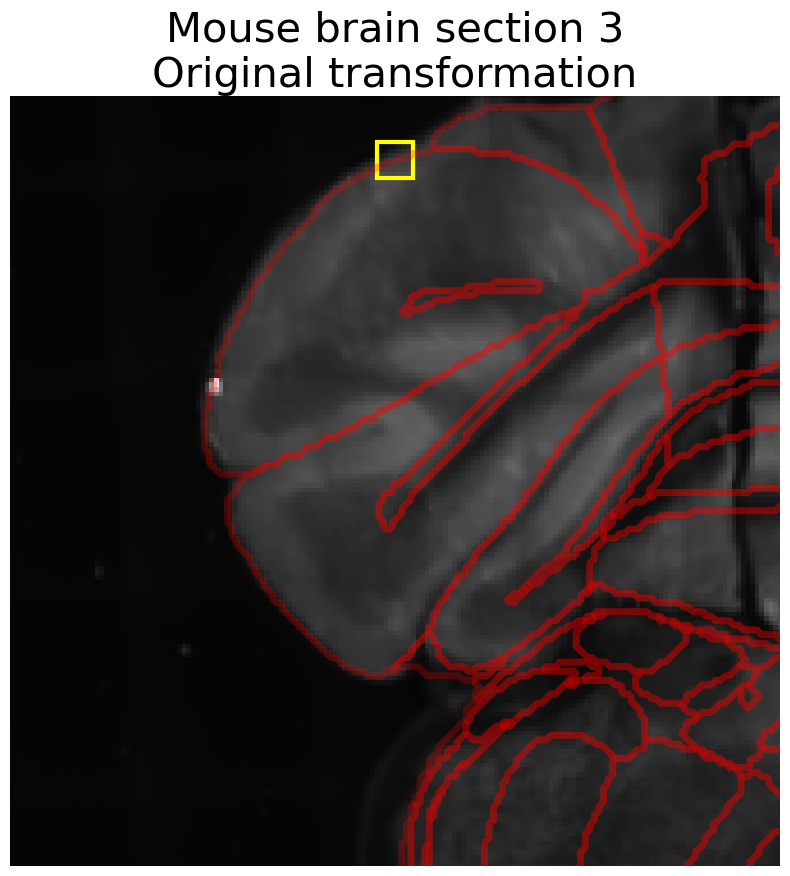

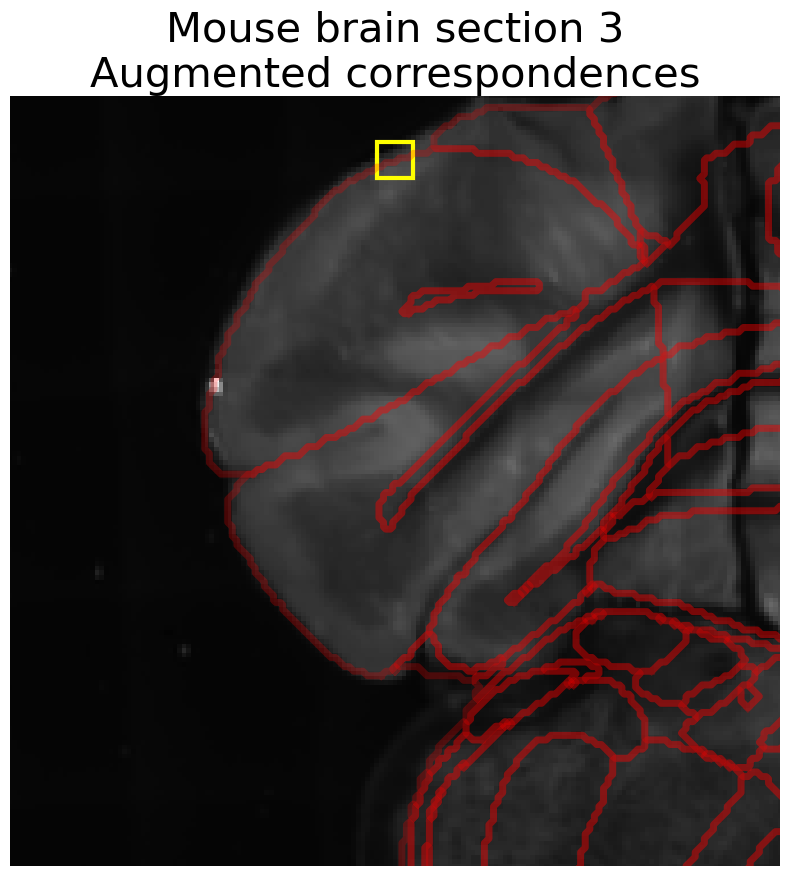

In [19]:
from skimage import measure
import matplotlib.patches as patches

# slice 200, skip 2 window offset 40 offset -15 for y
# ylim = (79, 88)
# xlim = (275, 284)

# For 350: skip 3, window offset 100 (new 50), max dist 10
# (212, 219)
# (197, 204)

# For 500: skip 3, max dist 50, window offset 80, offset 80 (new 70)
# 84 92
# 119 127
ylim = (84, 92)
xlim = (119, 127)
window_offset = 80
y_offset = 70
# Example: coordinates of the box corners (replace with your actual coordinates)
# Jacobian closeup windows
# For 200:
# ylim = (79, 88)
# xlim = (275, 284)

# For 350:
# (235, 242)
# (197, 204)

# For 500:
# 84 92
# 119 127
jylim = (84, 92)
jxlim = (119, 127)

box_coords = [
    (jylim[0], jxlim[0]),  # top-left
    (jylim[0], jxlim[1]),  # top-right
    (jylim[1], jxlim[1]),  # bottom-right
    (jylim[1], jxlim[0])   # bottom-left
]

ylim = (ylim[0] - window_offset + y_offset, ylim[1] + window_offset + y_offset) # -15 for 200
xlim = (xlim[0] - window_offset, xlim[1] + window_offset)

plt.figure(figsize=(10, 10))
plt.imshow(original_transformation, cmap='gray')


# Compute bounding box
ys, xs = zip(*box_coords)
min_x, max_x = min(xs), max(xs)
min_y, max_y = min(ys), max(ys)
width = max_x - min_x
height = max_y - min_y

# Add this after plotting contours, before plt.show()
ax = plt.gca()
rect = patches.Rectangle((min_x, min_y), width, height, linewidth=3, edgecolor='yellow', facecolor='none')
ax.add_patch(rect)

for label in range(1, int(annotation_img.max()) + 1):
    contours = measure.find_contours(annotation_img == label, 0.5)
    for contour in contours:
        plt.plot(contour[:, 1], contour[:, 0], linewidth=5, color='red', alpha=0.25)

plt.axis('off')
plt.title('Mouse brain section 3\nOriginal transformation', fontsize=30)
plt.xlim(xlim)
plt.ylim(ylim)
plt.xticks([])
plt.yticks([])
plt.gca().invert_yaxis()
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(transformed_img, cmap='gray')
ax = plt.gca()
rect = patches.Rectangle((min_x, min_y), width, height, linewidth=3, edgecolor='yellow', facecolor='none')
ax.add_patch(rect)

for label in range(1, int(annotation_img.max()) + 1):
    contours = measure.find_contours(annotation_img == label, 0.5)
    for contour in contours:
        plt.plot(contour[:, 1], contour[:, 0], linewidth=5, color='red', alpha=0.25)
plt.axis('off')
plt.title('Mouse brain section 3\nAugmented correspondences', fontsize=30)
plt.xlim(xlim)
plt.ylim(ylim)
plt.xticks([])
plt.yticks([])
plt.gca().invert_yaxis()
plt.show()


In [ ]:
from modules.jacobian import jacobian_determinant_central, jacobian_determinant_finite

jacobian_determinant_central(d_expanded.deformation, pt=np.array((135, 101)))


jacobian_determinant_finite(d_expanded.deformation, pt=np.array((135, 101)))

### Jacobian plot

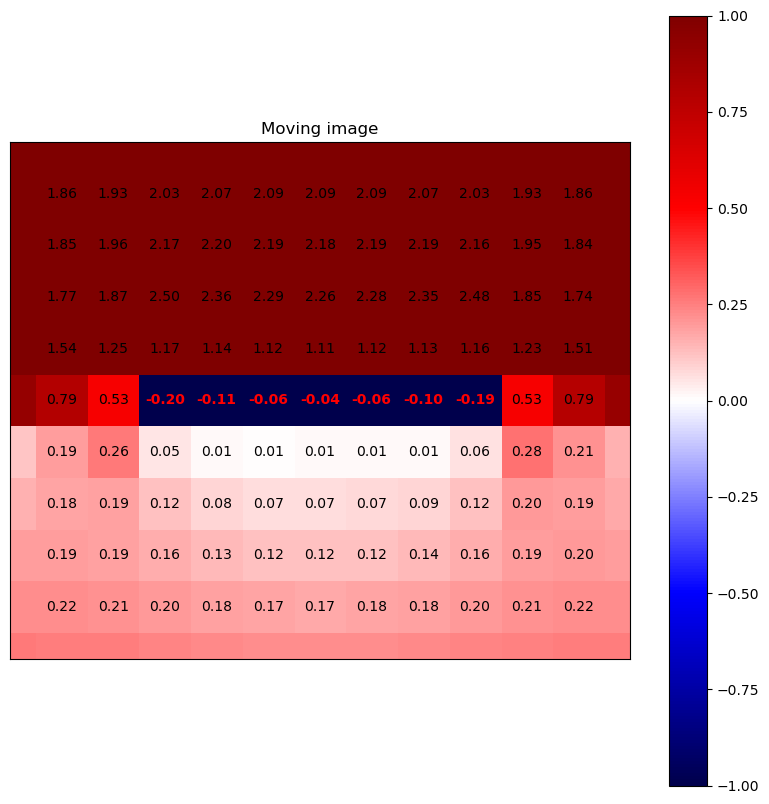

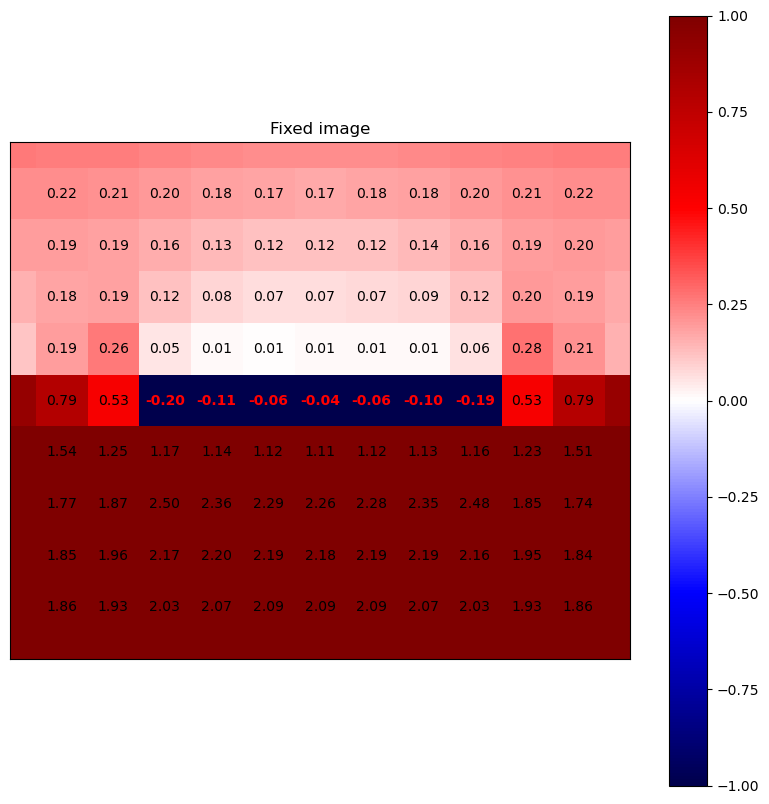

In [56]:
jacobian_plot(d_moving, title="Moving image", figsize=(10, 10),
              #moving_pts=mpoints,
              #fixed_pts=fpoints,
              xlim=(96, 108), 
              ylim=(116, 126), 
              binarize_negatives=True)

jacobian_plot(d_fixed, title="Fixed image", figsize=(10, 10),
              #moving_pts=mpoints,
              #fixed_pts=fpoints,
              xlim=(96, 108), 
              ylim=(130, 140), 
              binarize_negatives=True)

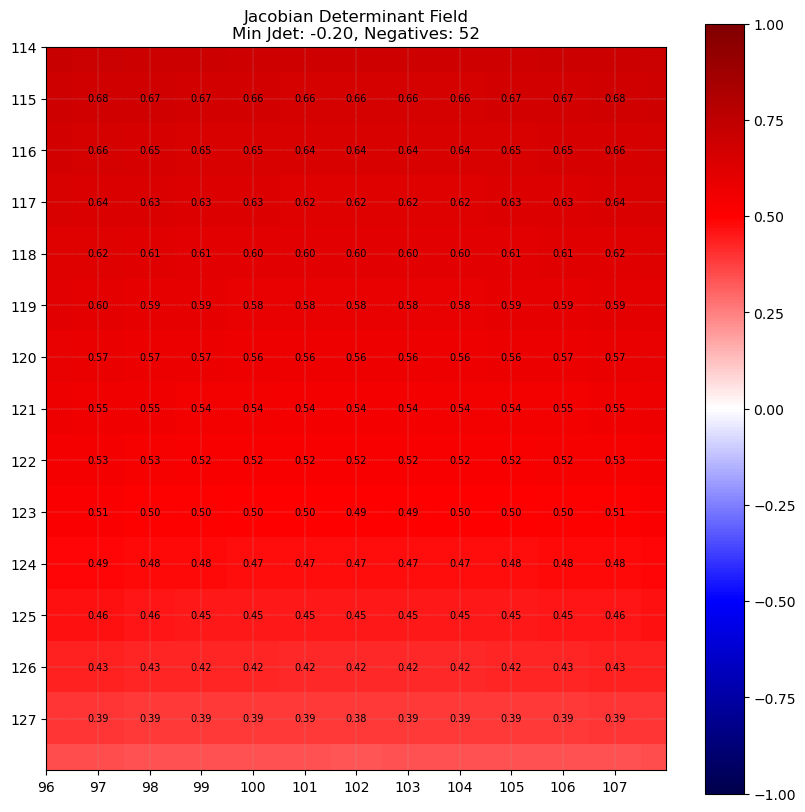

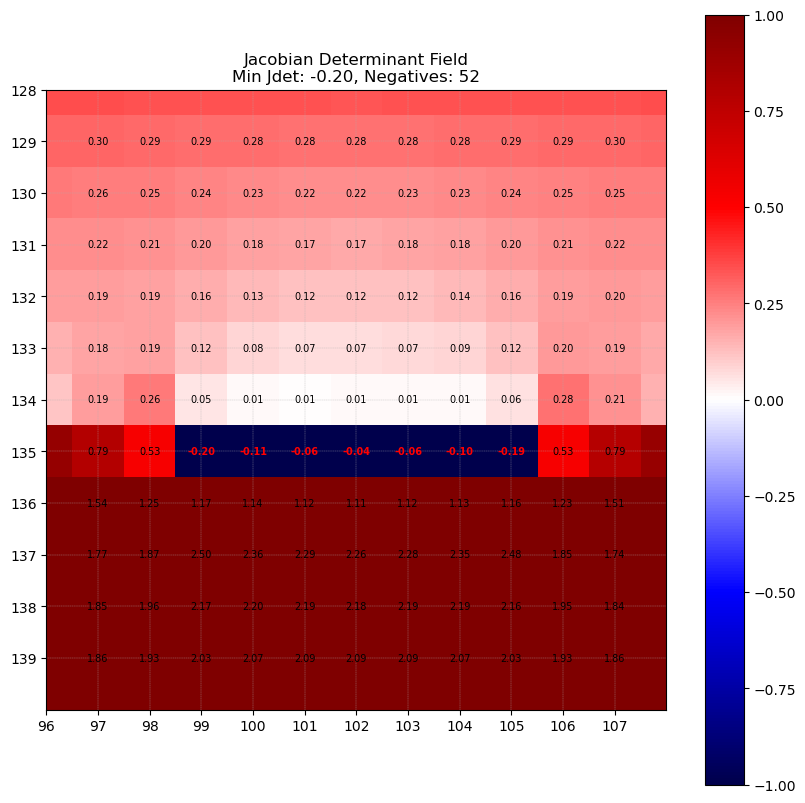

In [ ]:
jacobian_plot(d_moving, 
              #pt=correspondence_pt, 
              figsize=(10, 10), 
              title="Jacobian Determinant Field\nMin Jdet: {:.2f}, Negatives: {}".format(d_original.min(), d_original.count_negatives()),
              #moving_pts=new_mpoints, 
              moving_pts=new_fpoints,
              xlim=(96, 108),
              ylim=(114, 128),
              binarize_negatives=True)


jacobian_plot(d_fixed, 
              #pt=correspondence_pt, 
              figsize=(10, 10), 
              title="Jacobian Determinant Field\nMin Jdet: {:.2f}, Negatives: {}".format(d_original.min(), d_original.count_negatives()),
              moving_pts=new_mpoints + np.array([[0, 20, 0]]),  # Add a dummy point for consistency
              #moving_pts=new_fpoints + np.array([[0, 20, 0]]),  # Add a dummy point for consistency
              xlim=(96, 108),
              ylim=(128, 140),
              binarize_negatives=True)

In [ ]:
print(np.min(np.abs(d_fixed.jdet_field)), np.max(np.abs(d_fixed.jdet_field)))

print(np.min(np.abs(d_moving.jdet_field)), np.max(np.abs(d_moving.jdet_field)))

0.003321199197585223 2.500968138782226
0.0033211991975923283 2.500968138782243


In [ ]:
print(d_expanded.jdet_field[134, 103])
print(d_expanded.jdet_field[120, 103])

0.4629768721990186
1.2082476677790988



=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10


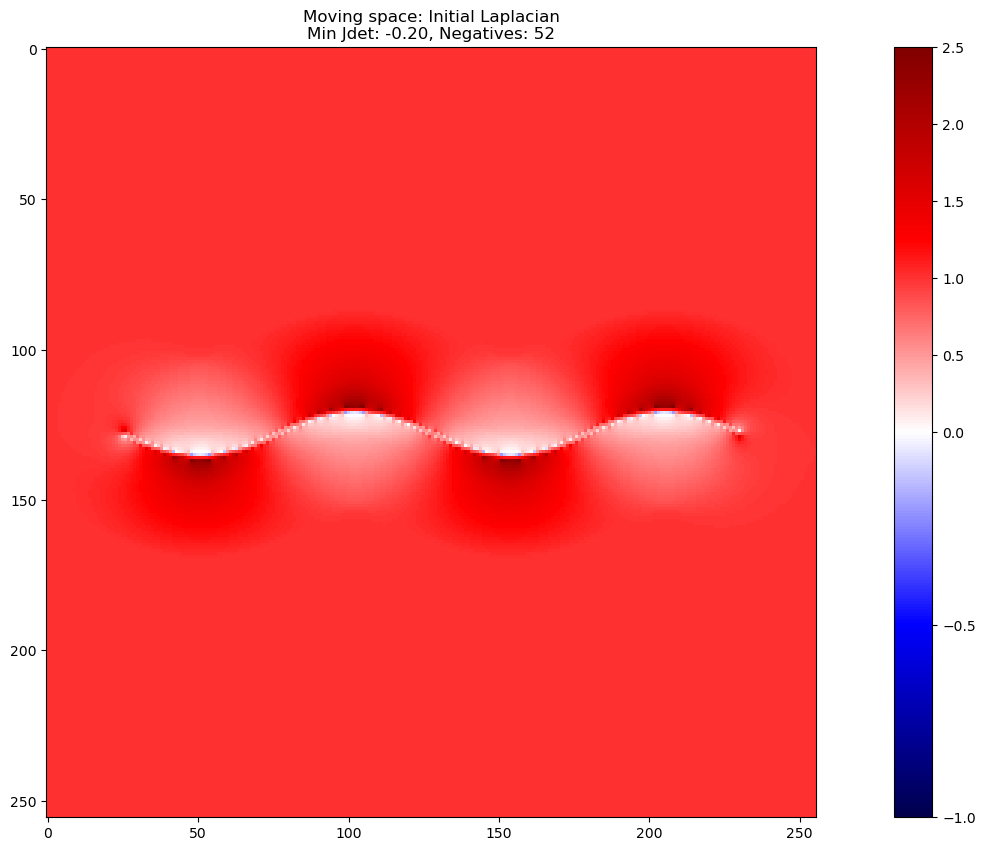

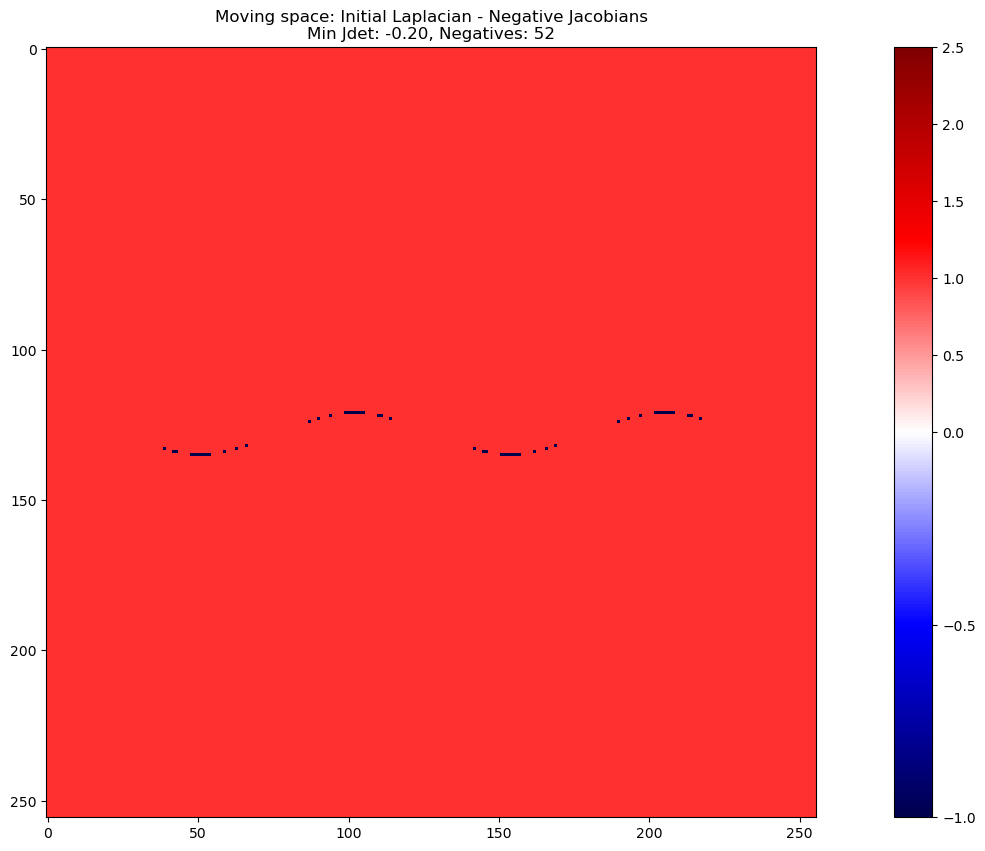

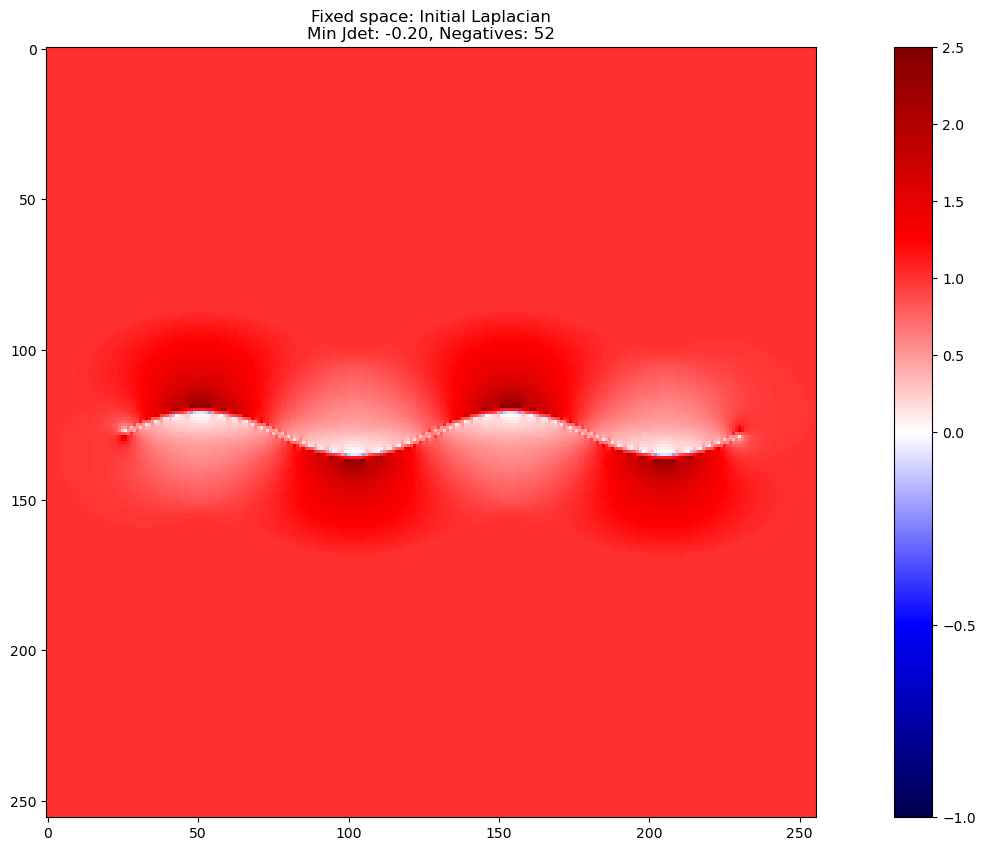

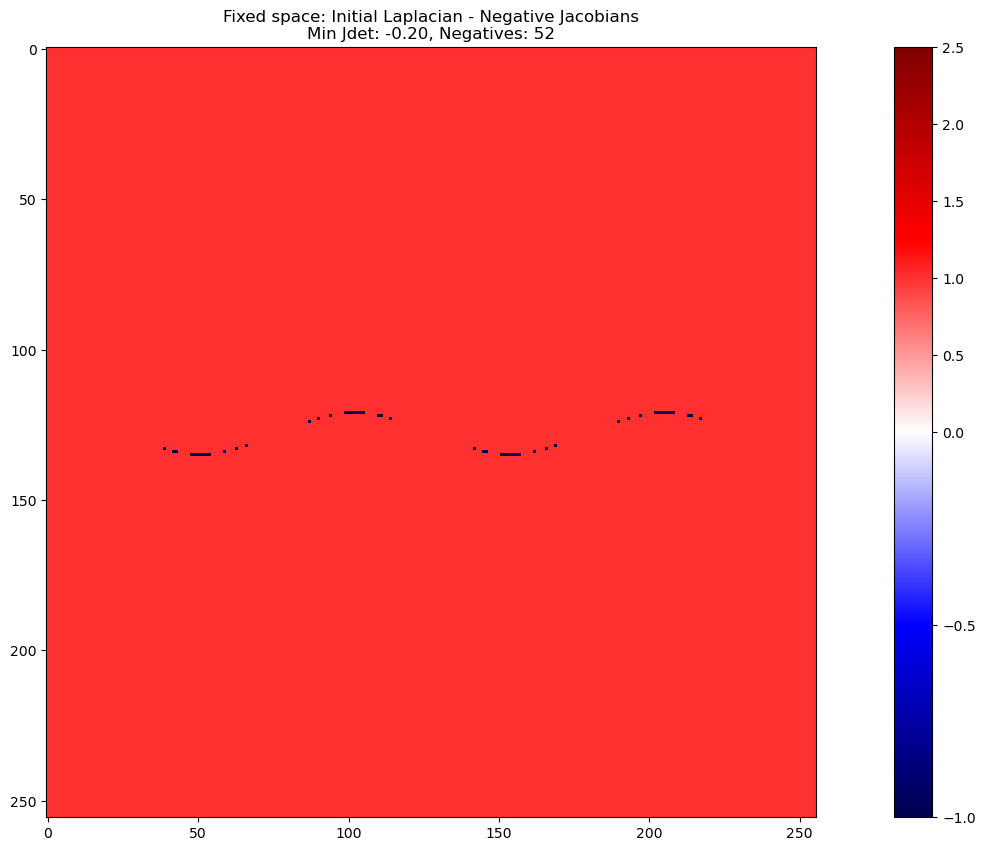

Found 5675 expanding Jacobian determinants with threshold 1.1.



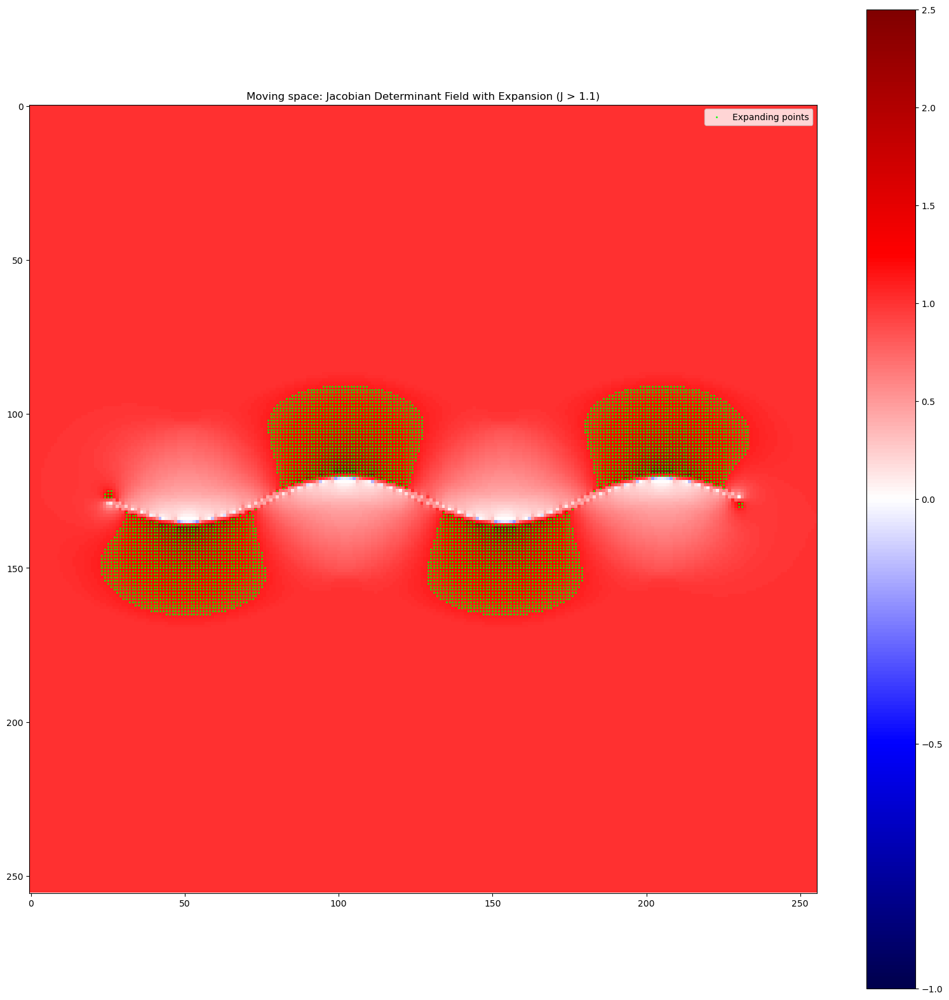

New moving points shape: (5674, 3)
New fixed points shape: (5674, 3)
Cleaned new moving points shape: (5618, 3)
Cleaned new fixed points shape: (5618, 3)


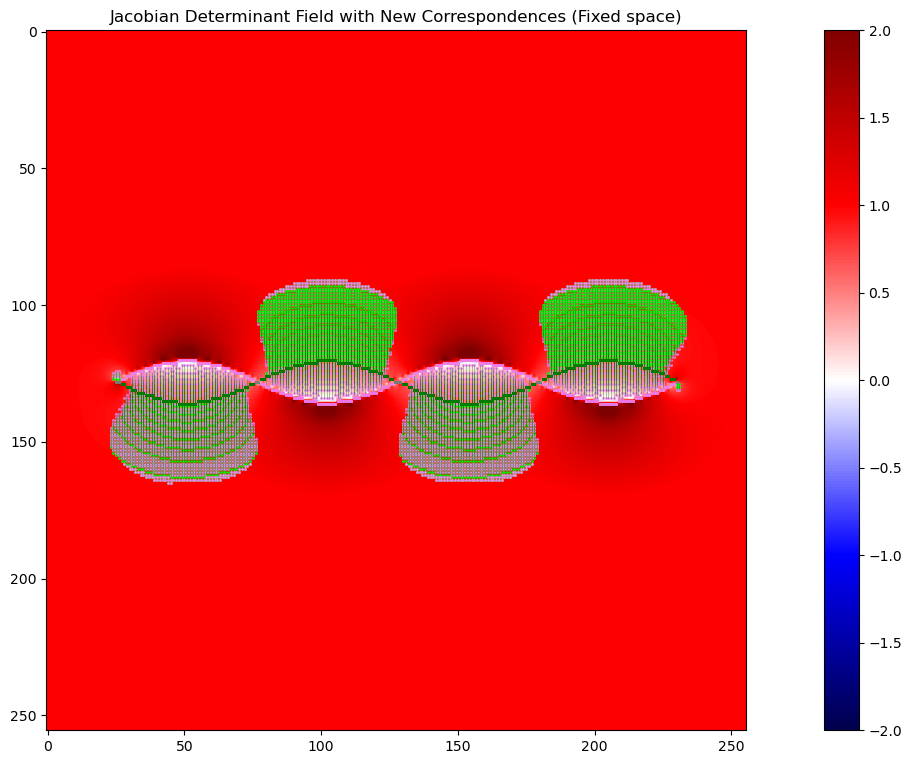

[142.4173923 208.       ]
Cleaned new fixed points shape: (5618, 3)
Cleaned new moving points shape: (5618, 3)


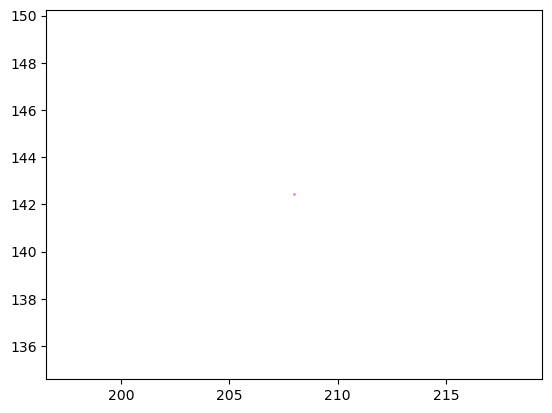

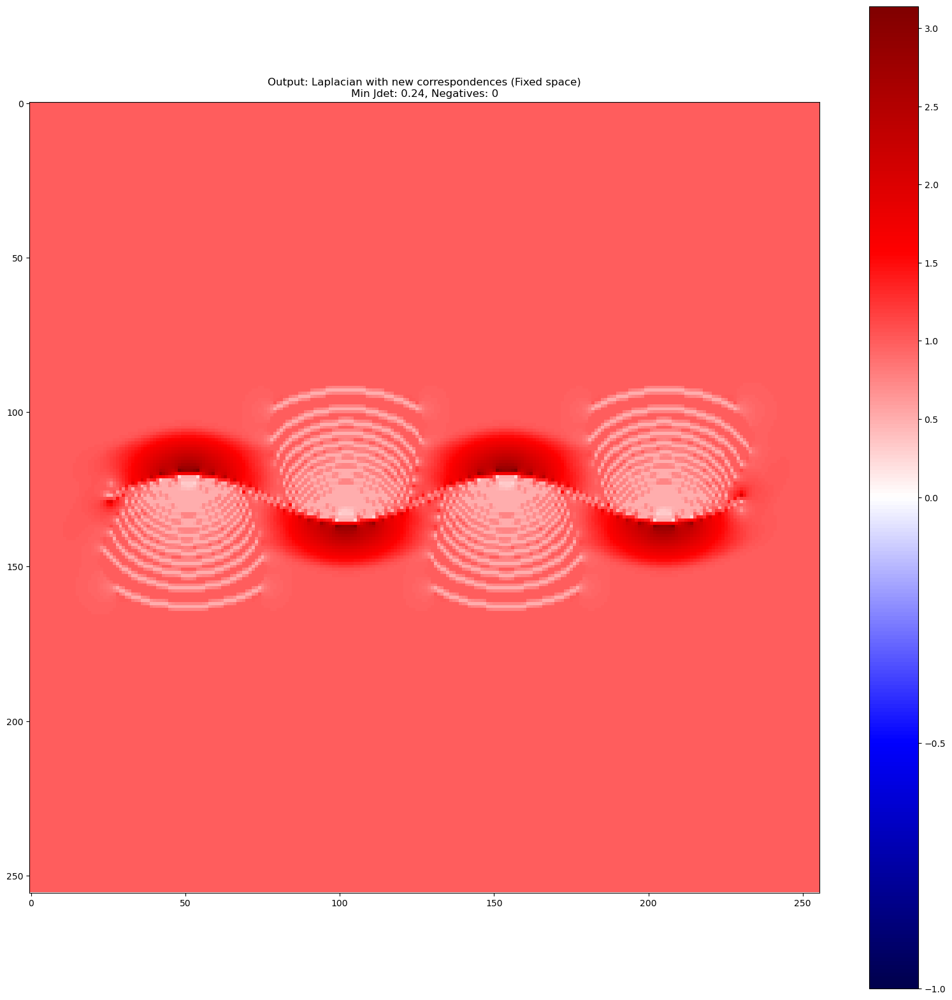

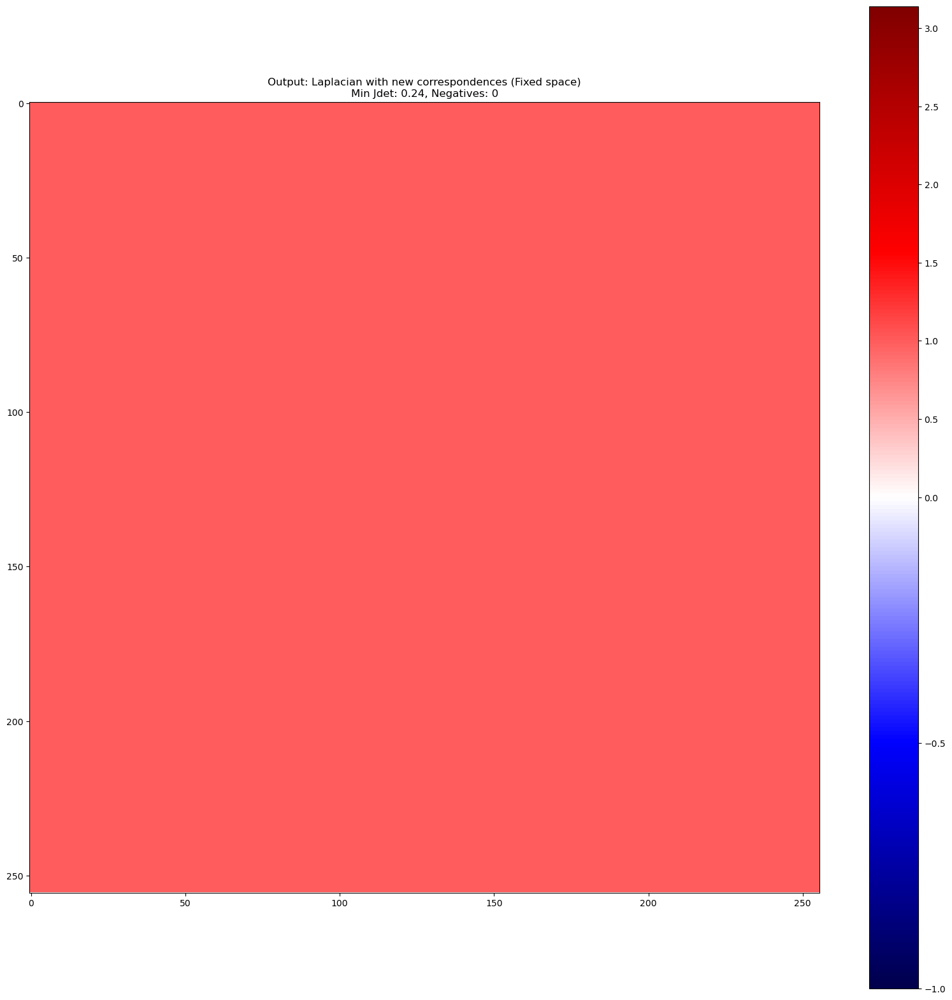

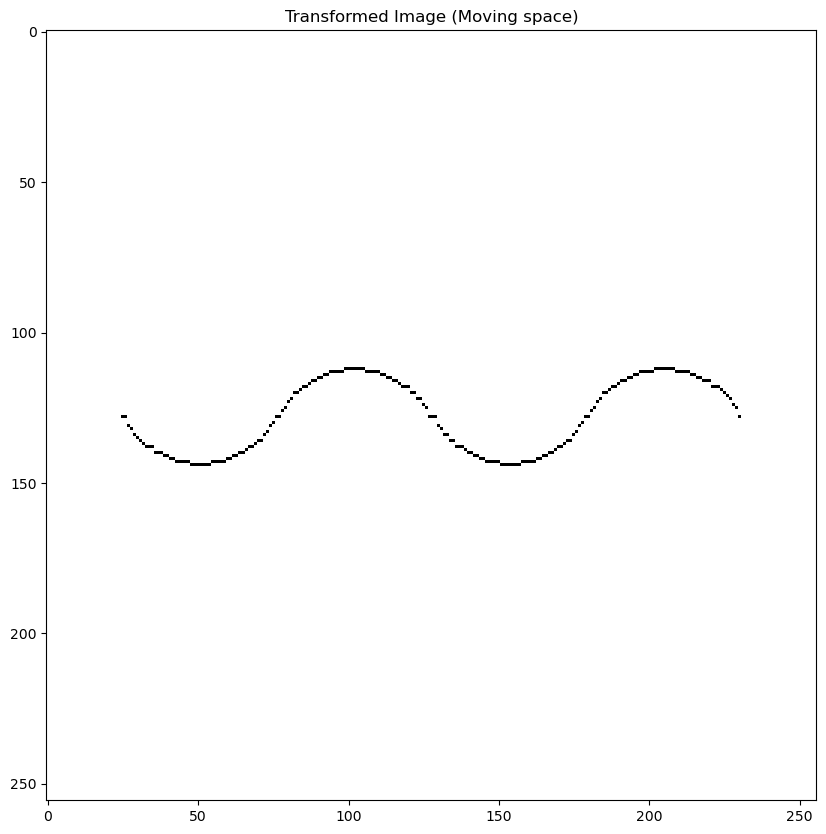

In [70]:
scale = 3
jdet_threshold = 1.1
verbose = False

# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Create data classes
d_fixed = Data(mpoints, fpoints, (256, 256))
d_moving = np.load("d_moving.npy", allow_pickle=True).item()

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 10), binarize_negatives=True,
       title=f"Moving space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 10), binarize_negatives=False,
       title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 10), binarize_negatives=True,
       title=f"Fixed space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")


# Upscale the deformation fields
upscaled_fixed = upscale_dvf_preserve(d_fixed.deformation, scale=scale)
upscaled_moving = upscale_dvf_preserve(d_moving.deformation, scale=scale)



########### EDIT:  DO IT IN MOVING SPACE ###########
#d_moving = d_fixed


expanding_coord = get_expanding_coordinates(d_moving.jdet_field, threshold=jdet_threshold, verbose=False)
# Remove points that occur in the fixed points set
expanding_coord = np.array([coord for coord in expanding_coord if tuple(coord) not in set(map(tuple, d_fixed.fpoints[:, 1:]))])




# For each expanding coordinate, get the adjacent coordinates in the upscaled deformation field
print()

new_mpoints = []
new_fpoints = []
for y, x in expanding_coord:
    # Get the corresponding coordinates in the upscaled deformation field (now use upscaled_moving)
    y_curr = y * scale
    x_curr = x * scale
    displacement_curr = upscaled_fixed[:, 0, y_curr, x_curr]
    mapped_point_curr = np.array((y + displacement_curr[1], x + displacement_curr[2]))

    # Left and right coordinates in the upscaled deformation field
    x_left = x_curr - 1
    x_right = x_curr + 1
    y_up = y_curr - 1
    y_down = y_curr + 1

    displacement_left = upscaled_fixed[:, 0, y_curr, x_left]
    displacement_right = upscaled_fixed[:, 0, y_curr, x_right]
    displacement_up = upscaled_fixed[:, 0, y_up, x_curr]
    displacement_down = upscaled_fixed[:, 0, y_down, x_curr]

    mapped_point_left = np.array((y + displacement_left[1], x + displacement_left[2]))
    mapped_point_right = np.array((y + displacement_right[1], x + displacement_right[2]))
    mapped_point_up = np.array((y + displacement_up[1], x + displacement_up[2]))
    mapped_point_down = np.array((y + displacement_down[1], x + displacement_down[2]))

    # Of all of the mapped points, find the mapped point that is closest to an integer coordinate
    mapped_points = [mapped_point_left, mapped_point_right, mapped_point_up, mapped_point_down, mapped_point_curr]
    closest_point = min(mapped_points, key=lambda p: np.linalg.norm(p - np.round(p)))
    closest_point = np.round(closest_point).astype(int)

    # Now, moving point is [0, y, x], fixed point is [0, closest_point[0], closest_point[1]]
    new_mpoints.append([0, y, x])
    #new_fpoints.append([0, closest_point[0], closest_point[1]])
    new_fpoints = [np.round(get_mapped_point(f[1:], d_moving.deformation)).astype(int) for f in new_mpoints]
    # Add zero to the first axis for Data class compatibility
    new_fpoints = [np.concatenate([[0], np.round(get_mapped_point(f[1:], d_moving.deformation)).astype(int)]) for f in new_mpoints]
    #for f in new_fpoints:
    #f = m.copy()
    #m -= np.array([0, 0, 0])  # Adjust to (y, x) format
    #mapped_point = get_mapped_point(m[1:], d_fixed.deformation)
    #print(f"Fixed point: {m[1:]} -> displacement: {get_displacement(m[1:], d_fixed.deformation)[1:]}, \tmapped point: {get_mapped_point(m[1:], d_fixed.deformation)}, \tjacobian: {d_fixed.jdet_field[m[1], m[2]]}")
    #print(mapped_point)
    #plt.scatter(mapped_point[1], mapped_point[0], c='violet', s=1, label='Mapped Points')


# Convert to numpy arrays for consistency
new_mpoints = np.array(new_mpoints)
new_fpoints = np.array(new_fpoints)

###### Visualize the Jacobian determinant field with J > thresh ######
plt.figure(figsize=(20, 20))
jdet_field = d_moving.jdet_field.copy()
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())

plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Connect moving and fixed points
plt.scatter(new_mpoints[:, 2], new_mpoints[:, 1], c='lime', s=1, label='Expanding points')
plt.title(f"Moving space: Jacobian Determinant Field with Expansion (J > {jdet_threshold})")
plt.legend()
plt.show()


print("New moving points shape:", new_mpoints.shape)
print("New fixed points shape:", new_fpoints.shape)

# Remove duplicates as before
new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])

print("Cleaned new moving points shape:", new_mpoints.shape)
print("Cleaned new fixed points shape:", new_fpoints.shape)

###### Visualize the Jacobian determinant field with new correspondences ######
plt.figure(figsize=(20, 20))
plt.subplot(2, 1, 1)
jdet_field = d_fixed.jdet_field.copy()
plt.imshow(jdet_field, cmap='seismic', vmin=-2, vmax=2)
plt.colorbar()
# Connect moving and fixed points
for mp, fp in zip(new_mpoints, new_fpoints):
    plt.plot([mp[2], fp[2]], [mp[1], fp[1]], c='green', linewidth=0.5, alpha=0.5)
    plt.scatter(mp[2], mp[1], c='lime', s=1, label='Moving Points')
    plt.scatter(fp[2], fp[1], c='violet', s=1, label='Fixed Points')
    plt.scatter(mpoints[:, 2], mpoints[:, 1], c='green', s=1, label='Original Moving Points', alpha=0.15)
    plt.scatter(fpoints[:, 2], fpoints[:, 1], c='violet', s=1, label='Original Fixed Points', alpha=0.15)
    
#plt.grid(True, which='both', linestyle='--', linewidth=0.25)
#plt.gca().invert_yaxis()
plt.title("Jacobian Determinant Field with New Correspondences (Fixed space)")
plt.show()


mapped_point = get_mapped_point(m[1:], d_moving.deformation)
#print(f"Fixed point: {m[1:]} -> displacement: {get_displacement(m[1:], d_fixed.deformation)[1:]}, \tmapped point: {get_mapped_point(m[1:], d_fixed.deformation)}, \tjacobian: {d_fixed.jdet_field[m[1], m[2]]}")
print(mapped_point)
plt.scatter(mapped_point[1], mapped_point[0], c='violet', s=1, label='Mapped Points')

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# ...existing code...
print("Cleaned new fixed points shape:", new_fpoints.shape)
print("Cleaned new moving points shape:", new_mpoints.shape)

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# Create a new Data object with the updated points
d_expanded = Data(mpoints, fpoints, (256, 256))
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 20), binarize_negatives=False,
       title=f"Output: Laplacian with new correspondences (Fixed space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 20), binarize_negatives=True,
       title=f"Output: Laplacian with new correspondences (Fixed space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")

# Save to raw image
moving_img = data_utils.create_raw_image(d_fixed.mpoints, (256, 256), save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.fpoints, (256, 256), save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_expanded, moving_img, title="Transformed Image (Moving space)")

## Moving space

In [6]:
mdata_path = "data/corrected_correspondences_count_touching/mpoints.npy"
fdata_path = "data/corrected_correspondences_count_touching/fpoints.npy"
CURR_IDX = 350

mdata = np.load(mdata_path)
fdata = np.load(fdata_path)

# Get only elements that are of the current index
mdata = mdata[mdata[:, 0] == CURR_IDX]
fdata = fdata[fdata[:, 0] == CURR_IDX]
mdata[:, 0] = 0
fdata[:, 0] = 0

# Get every N points
N = 3  # 3 for 350, 2 otherwise
mdata = mdata[::N]
fdata = fdata[::N]
#resolution = np.zeros((1, 320, 456))

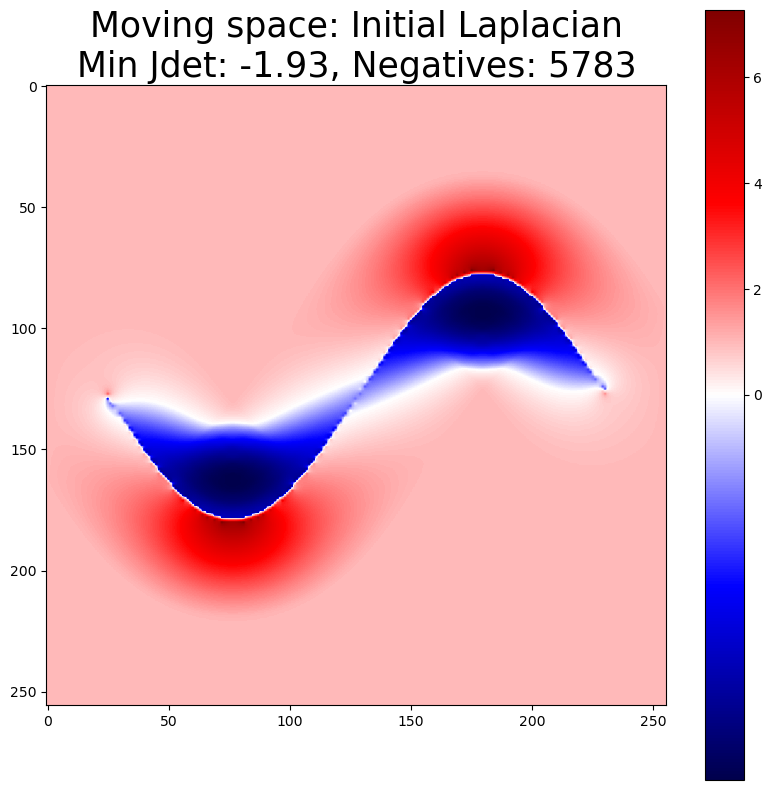

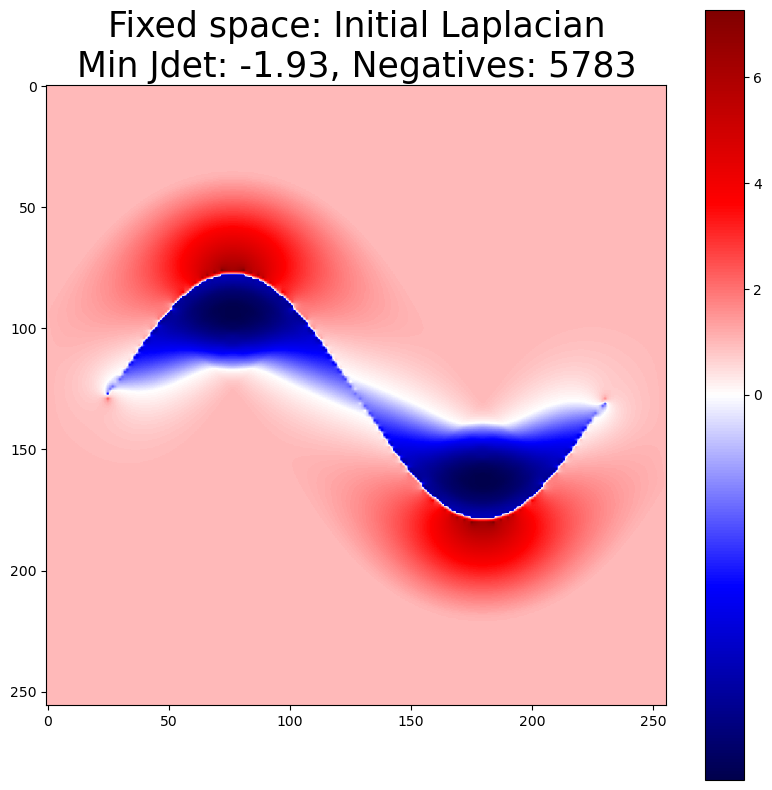

Found 9297 expanding Jacobian determinants with threshold 1.3.



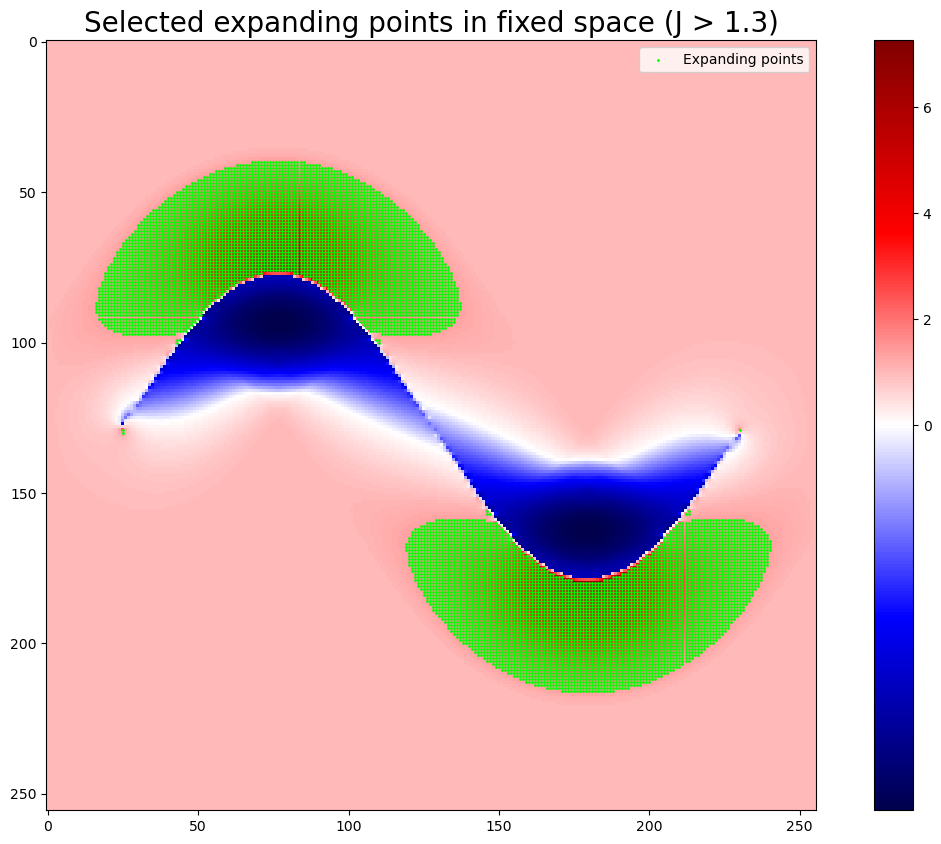

New moving points shape: (9249, 3)
New fixed points shape: (9249, 3)
Cleaned new moving points shape: (9249, 3)
Cleaned new fixed points shape: (9249, 3)
Cleaned new fixed points shape: (9249, 3)
Cleaned new moving points shape: (9249, 3)


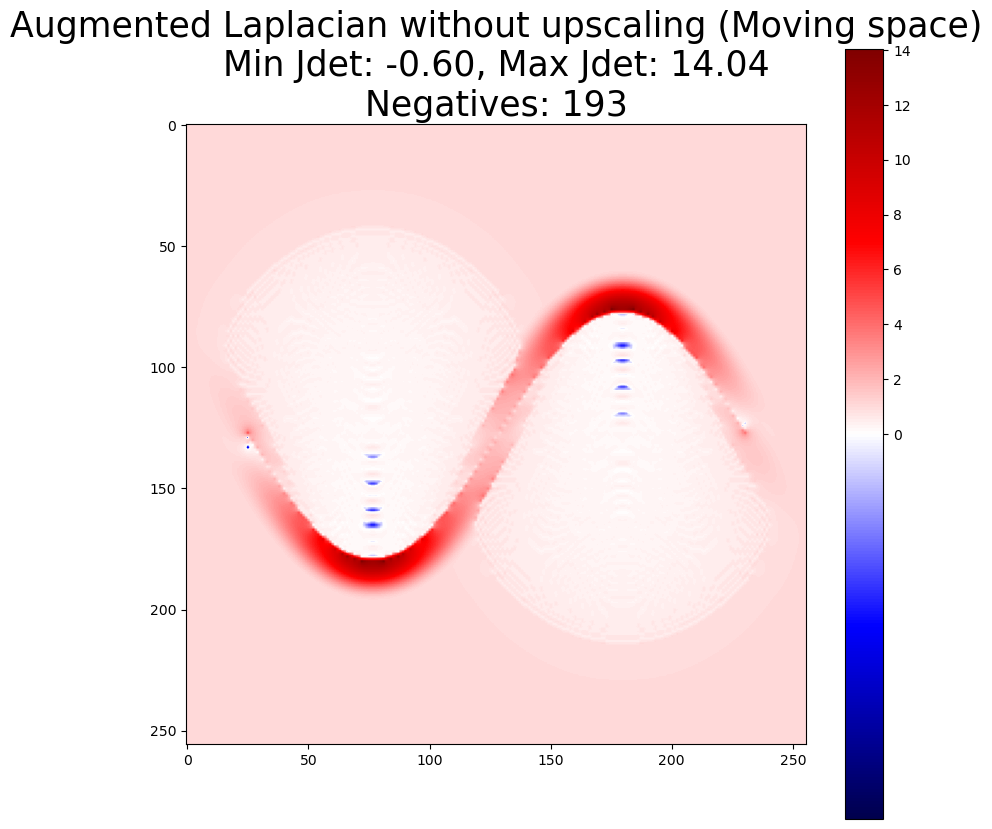

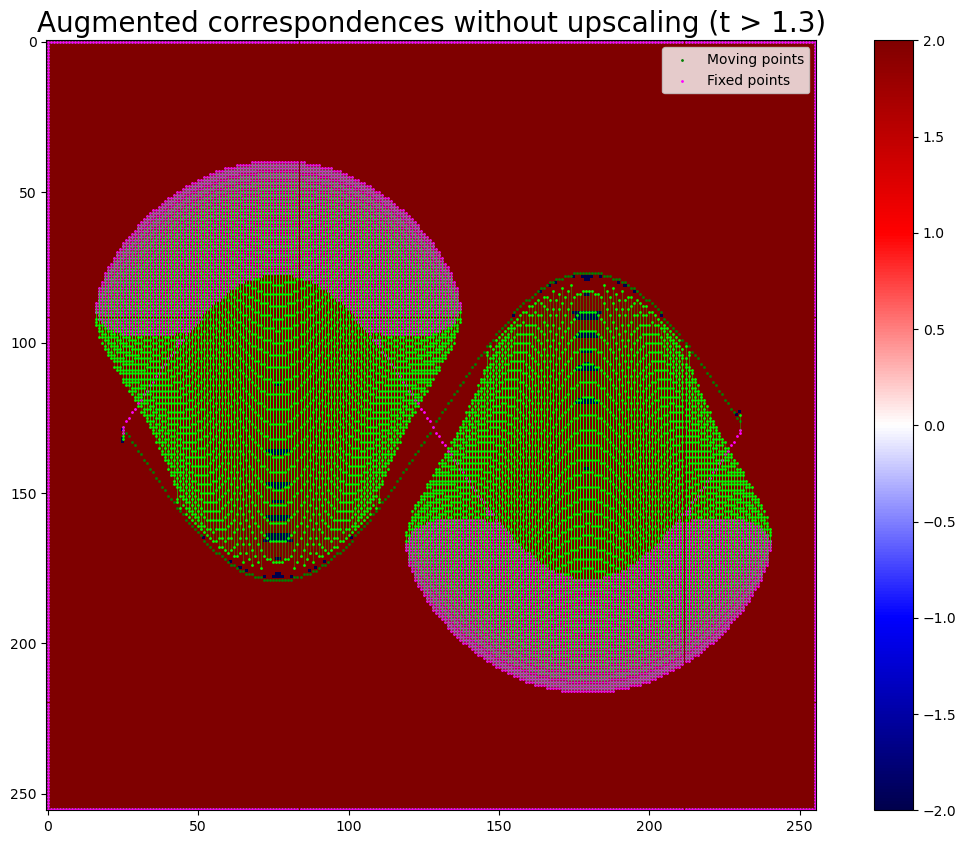

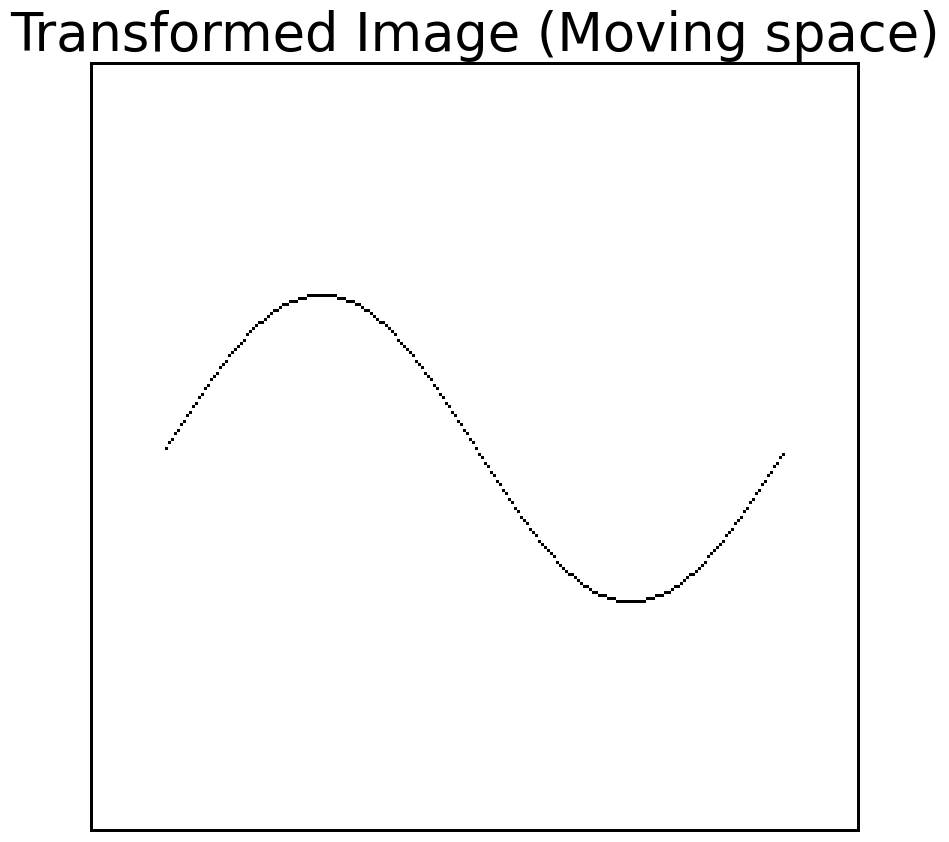

In [4]:
scale = 3
jdet_threshold = 1.3 # 1.3 default
verbose = False
resolution = (256, 256)
# Remove point pairs where the distance between new_mpoints and new_fpoints is above a threshold
magnitude_thresh = 10000000  # 100 elsewhere
plot_points = True




# 20 x 20 case
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=1,
    amplitude_ratio=0.2,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

"""
# Create a specific double helix for correspondence analysis
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)
"""



mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Make moving and fixed points on the image boundaries
boundary_points = boundary_points_on_grid(resolution)
mpoints = np.vstack([mpoints, boundary_points])
fpoints = np.vstack([fpoints, boundary_points])

#mpoints = mdata
#fpoints = fdata


# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = np.load("d_moving.npy", allow_pickle=True).item()
d_moving = Data_Moving(mpoints, fpoints, resolution)

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Moving space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Fixed space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")


# Upscale the deformation fields
upscaled_fixed = upscale_dvf_preserve(d_fixed.deformation, scale=scale)
upscaled_moving = upscale_dvf_preserve(d_moving.deformation, scale=scale)



########### EDIT:  DO IT IN MOVING SPACE ###########
#d_moving = d_fixed


expanding_coord = get_expanding_coordinates(d_fixed.jdet_field, threshold=jdet_threshold, verbose=False)
# Remove points that occur in the fixed points set
expanding_coord = np.array([coord for coord in expanding_coord if tuple(coord) not in set(map(tuple, d_moving.fpoints[:, 1:]))])




# For each expanding coordinate, get the adjacent coordinates in the upscaled deformation field
print()

new_mpoints = []
new_fpoints = []
for y, x in expanding_coord:
    # Get the corresponding coordinates in the upscaled deformation field (now use upscaled_moving)
    
    """
    y_curr = y * scale
    x_curr = x * scale
    displacement_curr = upscaled_moving[:, 0, y_curr, x_curr]
    mapped_point_curr = np.array((y + displacement_curr[1], x + displacement_curr[2]))

    # Left and right coordinates in the upscaled deformation field
    x_left = x_curr - 1
    x_right = x_curr + 1
    y_up = y_curr - 1
    y_down = y_curr + 1

    displacement_left = upscaled_moving[:, 0, y_curr, x_left]
    displacement_right = upscaled_moving[:, 0, y_curr, x_right]
    displacement_up = upscaled_moving[:, 0, y_up, x_curr]
    displacement_down = upscaled_moving[:, 0, y_down, x_curr]

    mapped_point_left = np.array((y + displacement_left[1], x + displacement_left[2]))
    mapped_point_right = np.array((y + displacement_right[1], x + displacement_right[2]))
    mapped_point_up = np.array((y + displacement_up[1], x + displacement_up[2]))
    mapped_point_down = np.array((y + displacement_down[1], x + displacement_down[2]))

    # Of all of the mapped points, find the mapped point that is closest to an integer coordinate
    mapped_points = [mapped_point_left, mapped_point_right, mapped_point_up, mapped_point_down, mapped_point_curr]
    closest_point = min(mapped_points, key=lambda p: np.linalg.norm(p - np.round(p)))
    closest_point = np.round(closest_point).astype(int)
    """
    # Now, moving point is [0, y, x], fixed point is [0, closest_point[0], closest_point[1]]
    new_fpoints.append([0, y, x])
    #new_fpoints.append([0, closest_point[0], closest_point[1]])
    #new_mpoints = [np.round(get_mapped_point(f[1:], d_fixed.deformation)).astype(int) for f in new_fpoints]
    # Add zero to the first axis for Data class compatibility
    new_mpoints = [np.concatenate([[0], np.round(get_mapped_point(f[1:], d_fixed.deformation)).astype(int)]) for f in new_fpoints]

    #for f in new_fpoints:
    #f = m.copy()
    #m -= np.array([0, 0, 0])  # Adjust to (y, x) format
    #mapped_point = get_mapped_point(m[1:], d_fixed.deformation)
    #print(f"Fixed point: {m[1:]} -> displacement: {get_displacement(m[1:], d_fixed.deformation)[1:]}, \tmapped point: {get_mapped_point(m[1:], d_fixed.deformation)}, \tjacobian: {d_fixed.jdet_field[m[1], m[2]]}")
    #print(mapped_point)
    #plt.scatter(mapped_point[1], mapped_point[0], c='violet', s=1, label='Mapped Points')


# Convert to numpy arrays for consistency
new_mpoints = np.array(new_mpoints)
new_fpoints = np.array(new_fpoints)

###### Visualize the Jacobian determinant field with J > thresh ######
plt.figure(figsize=(15, 10))
jdet_field = d_fixed.jdet_field.copy()
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())

plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Connect moving and fixed points
plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='lime', s=1, label='Expanding points')
plt.title(f"Selected expanding points in fixed space (J > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()



print("New moving points shape:", new_mpoints.shape)
print("New fixed points shape:", new_fpoints.shape)

# Remove duplicates as before
new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])


# Compute distances for each pair
distances = np.linalg.norm(new_mpoints[:, 1:] - new_fpoints[:, 1:], axis=1)

# Create a mask for pairs within the threshold
mask = distances < magnitude_thresh

# Filter both arrays using the mask
new_mpoints = new_mpoints[mask]
new_fpoints = new_fpoints[mask]

print("Cleaned new moving points shape:", new_mpoints.shape)
print("Cleaned new fixed points shape:", new_fpoints.shape)

old_mpoints = mpoints.copy()
old_fpoints = fpoints.copy()


# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# ...existing code...
print("Cleaned new fixed points shape:", new_fpoints.shape)
print("Cleaned new moving points shape:", new_mpoints.shape)

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# Create a new Data object with the updated points
d_expanded = Data_Moving(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Augmented Laplacian without upscaling (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Max Jdet: {d_expanded.jdet_field.max():.2f}\nNegatives: {d_expanded.count_negatives()}")
#d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Output: Laplacian with new correspondences (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")

###### Visualize the Jacobian determinant field with new correspondences ######
plt.figure(figsize=(15, 10))
jdet_field = d_expanded.jdet_field.copy()
jdet_field[jdet_field < 0] = -2  # Clip values below -1 for better visualization
jdet_field[jdet_field > 0] = 2  # Clip values below -1 for better visualization

norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())
plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Vectorized plotting for all correspondences
# Draw lines between new_mpoints and new_fpoints
if plot_points:
       plt.plot(
       np.stack([new_mpoints[:, 2], new_fpoints[:, 2]]),
       np.stack([new_mpoints[:, 1], new_fpoints[:, 1]]),
       c='lime', linewidth=0.5, alpha=0.5
       )

       # Scatter all points at once
       plt.scatter(new_mpoints[:, 2], new_mpoints[:, 1], c='lime', s=1)
       plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='magenta', s=1)
       plt.scatter(old_mpoints[:, 2], old_mpoints[:, 1], c='green', s=1, label='Moving points', alpha=1)  # 0.15
       plt.scatter(old_fpoints[:, 2], old_fpoints[:, 1], c='magenta', s=1, label='Fixed points', alpha=1)
       
       
#plt.grid(True, which='both', linestyle='--', linewidth=0.25)

"""
pidx = 125

expanding_mpoints_to_plot = new_mpoints.copy()
expanding_fpoints_to_plot = new_fpoints.copy()

# Remove all indices in both points where moving points has y = 126
mask = expanding_mpoints_to_plot[:, 1] == pidx
expanding_mpoints_to_plot = expanding_mpoints_to_plot[mask]
expanding_fpoints_to_plot = expanding_fpoints_to_plot[mask]


plt.plot(
    np.stack([expanding_mpoints_to_plot[:, 2], expanding_fpoints_to_plot[:, 2]]),
    np.stack([expanding_mpoints_to_plot[:, 1], expanding_fpoints_to_plot[:, 1]]),
    c='lime', linewidth=0.5, alpha=0.5
)
plt.scatter(expanding_mpoints_to_plot[:, 2], expanding_mpoints_to_plot[:, 1], c='lime', s=1)
plt.scatter(fpoints[:, 2], fpoints[:, 1], c='hotpink', s=1)



plt.ylim(118, 142)
plt.xlim(90, 115)
plt.gca().invert_yaxis()
"""
plt.title(f"Augmented correspondences without upscaling (t > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()




# Scatter all points at once
#plt.scatter(expanding_mpoints[:, 2], expanding_mpoints[:, 1], c='lime', s=1)
#plt.scatter(expanding_fpoints[:, 2], expanding_fpoints[:, 1], c='hotpink', s=1)

#plt.scatter(mpoints[:, 2], mpoints[:, 1], c='green', s=1, label='Moving points', alpha=1)  # 0.15
#plt.scatter(fpoints[:, 2], fpoints[:, 1], c='magenta', s=1, label='Fixed points', alpha=1)



# Save to raw image
moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.fpoints, resolution, save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_expanded, moving_img, title="Transformed Image (Moving space)")

## Moving space augmentation

In [3]:
import numpy as np


def deduplicate_rounded_points(moving_coords, fixed_coords):
    """
    Rounds moving_coords to nearest integer, keeps only the closest point for each integer coordinate,
    and returns the selected moving and fixed pairs.
    """
    moving_coords = np.asarray(moving_coords)
    fixed_coords = np.asarray(fixed_coords)
    assert moving_coords.shape == fixed_coords.shape

    rounded = np.round(moving_coords).astype(int)
    unique_points = {}
    for i, int_coord in enumerate(rounded):
        key = tuple(int_coord)
        dist = np.linalg.norm(moving_coords[i] - int_coord)
        if key not in unique_points or dist < unique_points[key][0]:
            unique_points[key] = (dist, i)

    selected_indices = [v[1] for v in unique_points.values()]
    selected_moving = moving_coords[selected_indices]
    selected_fixed = fixed_coords[selected_indices]
    return selected_moving, selected_fixed

# Example usage:
moving_coords = [
    (12.3, 45.7), 
    (13.8, 46.2),
    (14.1, 47.5), 
    (15.0, 48.0), 
    (100.5, 200.5), 
    (101.2, 201.8),
    (101, 202),
]
fixed_coords = [
    (100, 200), 
    (101.3, 201),
    (102.1, 202.5), 
    (103.0, 203.0), 
    (200, 300), 
    (201, 301),
    (101, 202)]

# Example usage:
selected_moving, selected_fixed = deduplicate_rounded_points(moving_coords, fixed_coords)
# Round selected moving to the nearest integer
selected_moving = np.round(selected_moving).astype(int)

for m, f in zip(selected_moving, selected_fixed):
    print(f"{m} -> {f}")

[12 46] -> [100. 200.]
[14 46] -> [101.3 201. ]
[14 48] -> [102.1 202.5]
[15 48] -> [103. 203.]
[100 200] -> [200. 300.]
[101 202] -> [101. 202.]


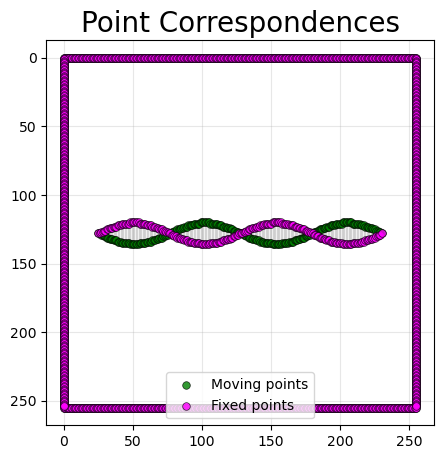

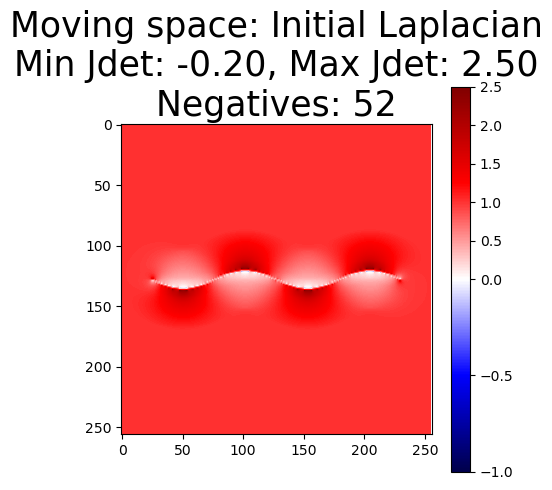

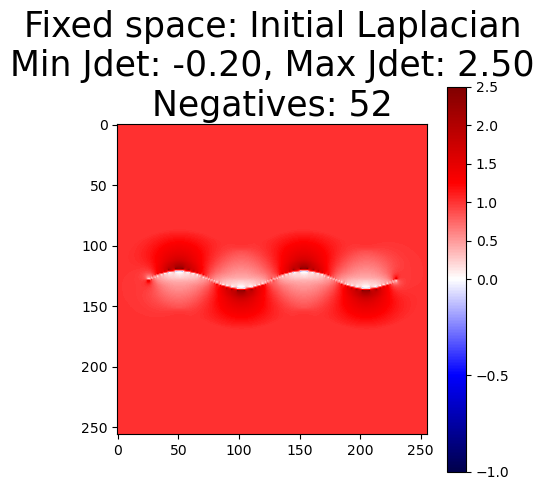

Found 826 expanding Jacobian determinants with threshold 2.
Expanding points in fixed space (Jdet > 2): 826 points
[[349 147]
 [349 148]
 [349 149]
 [349 150]
 [349 151]
 [349 152]
 [349 153]
 [349 154]
 [349 155]
 [349 156]]
Upscaled moving points shape: (826, 2)
Cleaned expanding fixed points shape: (256, 3)
Cleaned expanding moving points shape: (256, 3)
Cleaned expanding fixed points shape (distance): (256, 3)
Cleaned expanding moving points shape (distance): (256, 3)


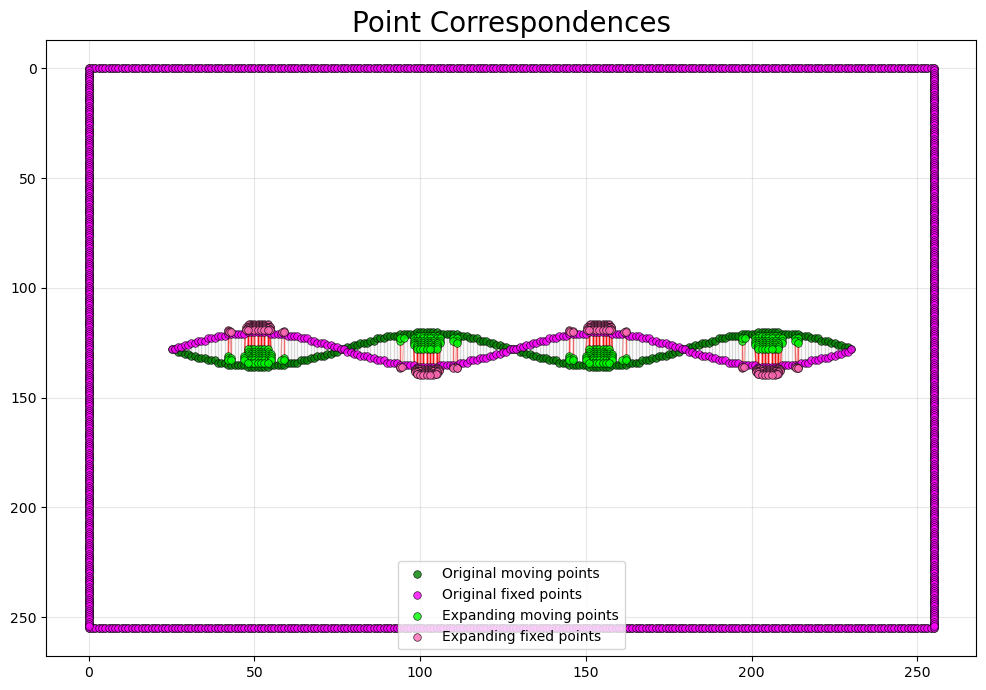

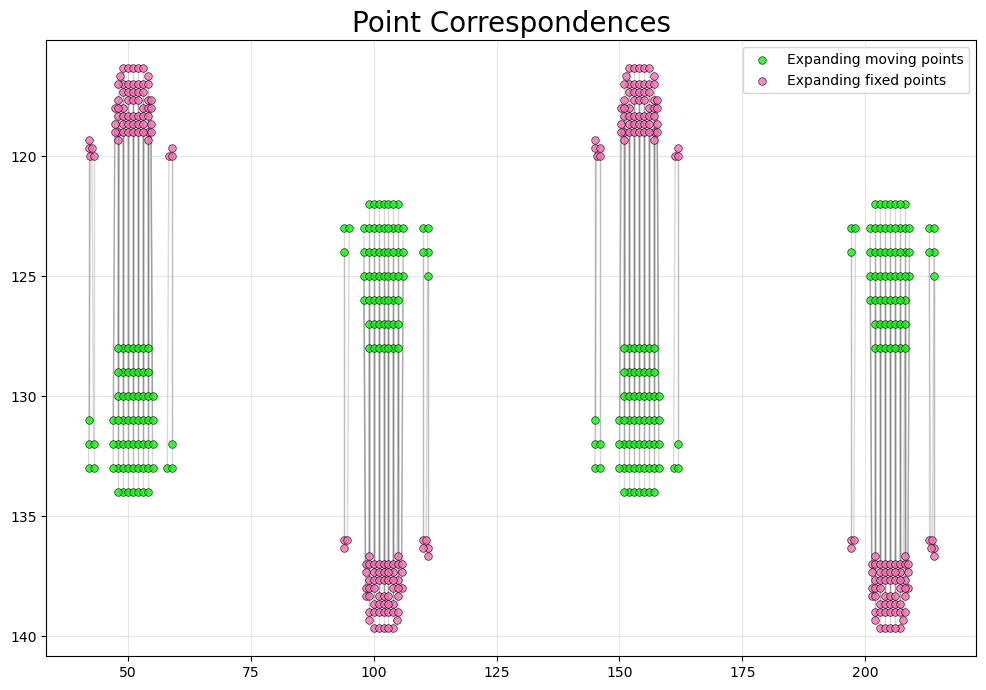

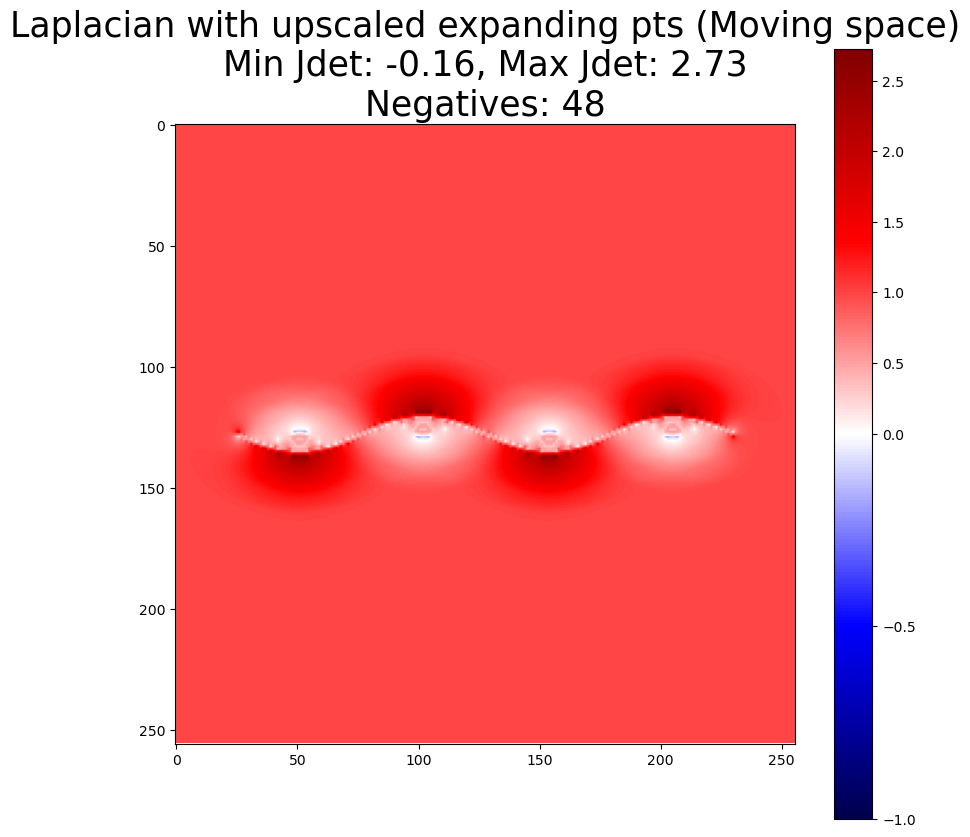

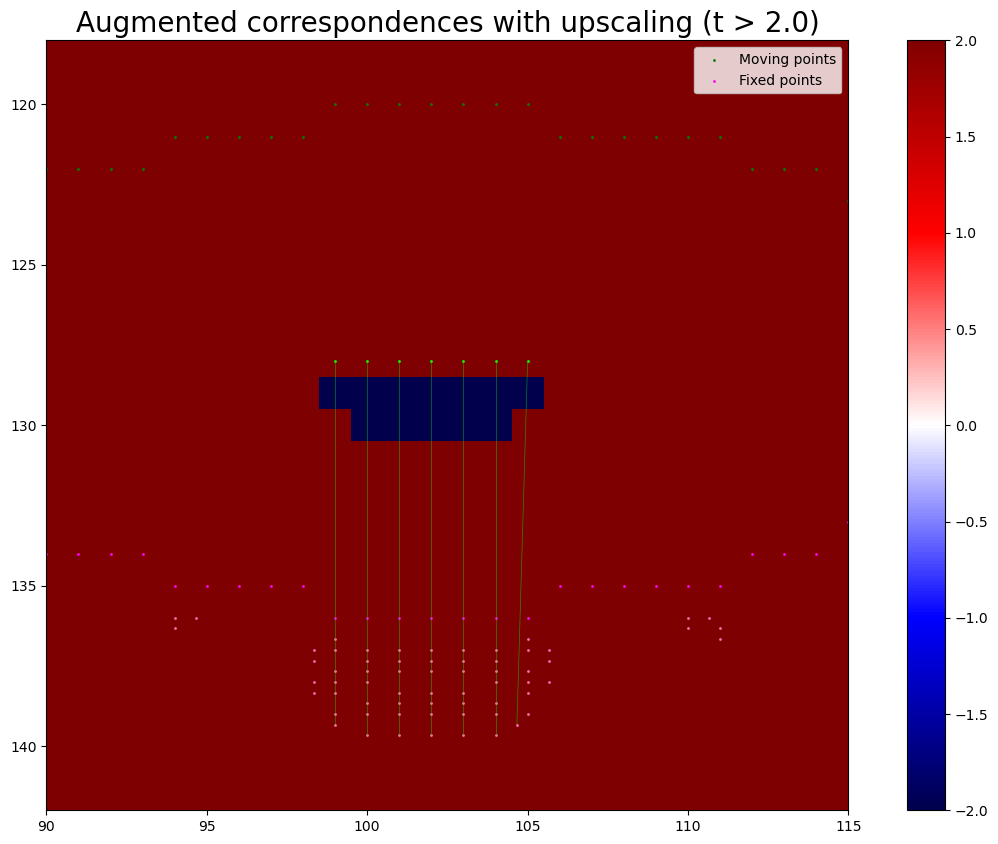

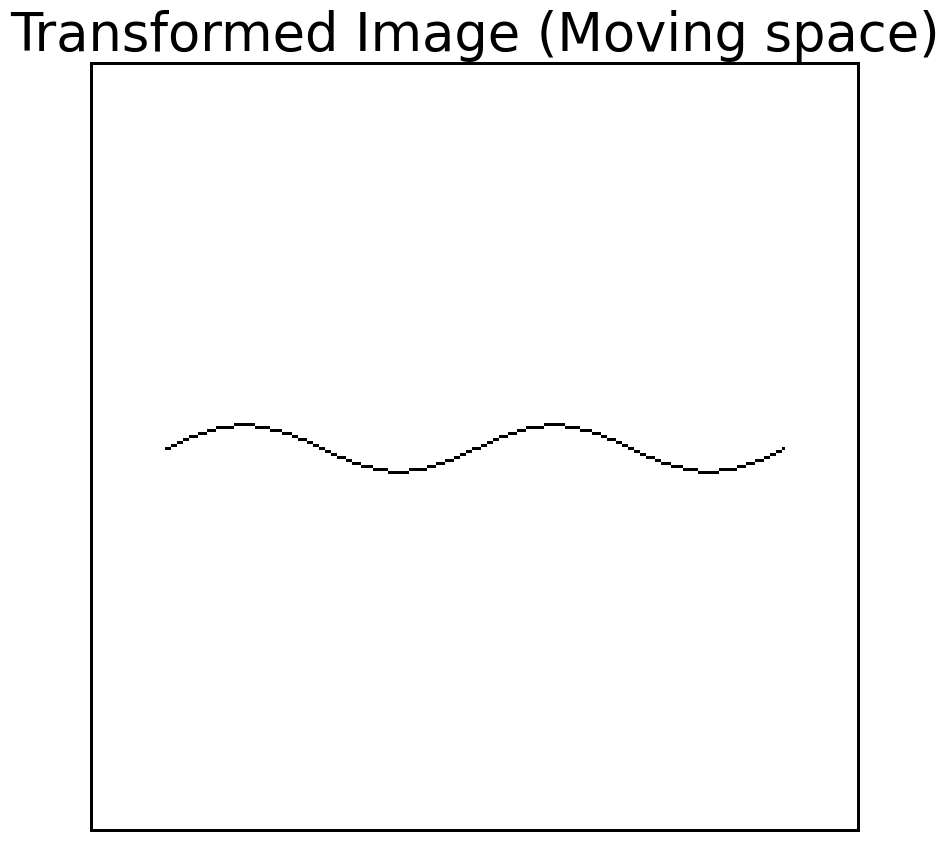

In [64]:
scale = 3
jdet_threshold = 2
resolution = (256, 256)
magnitude_thresh = 9999

################################################################################################

# 20 x 20 case
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=1,
    amplitude_ratio=0.2,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)



mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)


################################################################################################

# Swap to (y, x) format 
mpoints = mpoints[:, [1, 0]]
fpoints = fpoints[:, [1, 0]]  

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Make moving and fixed points on the image boundaries
boundary_points = boundary_points_on_grid(resolution)
mpoints = np.vstack([mpoints, boundary_points])
fpoints = np.vstack([fpoints, boundary_points])

# Show the initial correspondences
_ = plot_point_correspondences(mpoints[:, [2, 1]], fpoints[:, [2, 1]], labels=('Moving points', 'Fixed points'), colors=('green', 'magenta'), figsize=(5, 5))

# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = Data_Moving(mpoints, fpoints, resolution)
d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(5, 5), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Max Jdet: {np.max(d_moving.jdet_field):.2f}\nNegatives: {d_moving.count_negatives()}")
d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(5, 5), binarize_negatives=False,
         title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Max Jdet: {np.max(d_fixed.jdet_field):.2f}\nNegatives: {d_fixed.count_negatives()}")
    
# Create points from the initial fixed Laplacian to interpolate throughout the upscaled grid.
ifpoints = []
impoints = []
for y in range(resolution[0]):
    for x in range(resolution[1]):
        #print(f"Current point: ({y}, {x})")
        curr_fpoint = (y, x)
        curr_mpoint = get_mapped_point(curr_fpoint, d_fixed.deformation)
        #print(f"Mapped point: {curr_mpoint}")
        ifpoints.append(curr_fpoint)
        impoints.append(curr_mpoint)
ifpoints = np.array(ifpoints)
impoints = np.array(impoints)
interp_coords = interpolate_coordinates(ifpoints, impoints, grid_shape=resolution, scale=scale)

"""
# Print the interpolated coordinates throughout the grid, including axis numbers
print("\nInterpolated coordinates throughout the grid:\ny - ↓, x ->")
# Print column headers (x-axis)
header = ["\t"] + [f"  {x/scale:.2f}\t\t\t\t" for x in range(interp_coords.shape[2] - scale + 1)]
print("".join(header))
for y in range(interp_coords.shape[1] - scale + 1):
    row = [f"{y/scale:.2f}|"]  # Row header (y-axis)
    for x in range(interp_coords.shape[2] - scale + 1):
        entry = f"\t({abs(interp_coords[0, y, x])/scale:.1f}, {interp_coords[1, y, x]/scale:.1f})"
        if entry == "(nan, nan)\t":
            entry = "    nan\t\t"
        row.append(f"{entry}\t\t")
    print("".join(row))
export_interpolated_grid_to_csv(interp_coords, scale=scale, filename="interpolated_grid.csv")
"""

###############################################################################
# GET EXPANDING POINTS FROM THE FIXED LAPLACIAN AND CLEAN UP THE COORDINATES
###############################################################################

# Upscale the Jacobian determinant field from the fixed Laplacian and get the coordinates of the expanding points
upscaled_fixed_jdet = upscale_grid_with_priors(d_fixed.jdet_field, scale=3)
upscaled_expanding_fpts = get_expanding_coordinates(upscaled_fixed_jdet, threshold=jdet_threshold, verbose=False)
print(f"Expanding points in fixed space (Jdet > {jdet_threshold}): {len(upscaled_expanding_fpts)} points")
print(upscaled_expanding_fpts[:10])  # Print first 10 points

# Save all of the expanding upscaled coordinate pairs
expanding_mpoints = []
expanding_fpoints = []
for i in range(len(upscaled_expanding_fpts)):
    y, x = upscaled_expanding_fpts[i]
    expanding_mpoints.append(interp_coords[:, y, x] / scale)
    expanding_fpoints.append((y / scale, x / scale))
expanding_mpoints = np.array(expanding_mpoints)
expanding_fpoints = np.array(expanding_fpoints)
        
print(f"Upscaled moving points shape: {expanding_mpoints.shape}")


# For each expanding moving coordinate, get the closest integer coordinate. 
expanding_mpoints, expanding_fpoints = deduplicate_rounded_points(expanding_mpoints, expanding_fpoints)
# Round selected moving to the nearest integer
expanding_mpoints = np.round(expanding_mpoints).astype(int)

# Round all moving points to the nearest integer
expanding_mpoints = np.round(expanding_mpoints).astype(int)

# Stack zeros to the first axis for Data class compatibility
expanding_mpoints = np.pad(expanding_mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
expanding_fpoints = np.pad(expanding_fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Make sure all expanding moving points are unique and do not duplicate in expanding moving points, remove the corresponding pairs in expanding_fpoints that are duplicates
#expanding_mpoints = np.unique(expanding_mpoints, axis=0)
#expanding_fpoints = np.array([fp for fp, mp in zip(expanding_fpoints, expanding_mpoints) if tuple(mp[1:]) not in set(map(tuple, expanding_mpoints[:, 1:]))])

# Make sure the expanding points are unique and do not overlap with the original fixed points or moving points
expanding_fpoints = np.array([fp for fp in expanding_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
expanding_mpoints = np.array([mp for mp, fp in zip(expanding_mpoints, expanding_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

print("Cleaned expanding fixed points shape:", expanding_fpoints.shape)
print("Cleaned expanding moving points shape:", expanding_mpoints.shape)

# Compute distances for each pair
distances = np.linalg.norm(expanding_mpoints[:, 1:] - expanding_fpoints[:, 1:], axis=1)
#distances = np.linalg.norm(expanding_mpoints[:, 2] - expanding_fpoints[:, 2], axis=0)

# Create a mask for pairs within the threshold
mask = distances < magnitude_thresh

# Filter both arrays using the mask
expanding_mpoints = expanding_mpoints[mask]
expanding_fpoints = expanding_fpoints[mask]

print("Cleaned expanding fixed points shape (distance):", expanding_fpoints.shape)
print("Cleaned expanding moving points shape (distance):", expanding_mpoints.shape)


plot_point_correspondences(mpoints[:, [2, 1]], fpoints[:, [2, 1]],
                           expanding_mpoints[:, [2, 1]], expanding_fpoints[:, [2, 1]],
                           labels=('Original moving points', 'Original fixed points', 'Expanding moving points', 'Expanding fixed points'),
                           colors=('green', 'magenta', 'lime', 'hotpink'))


plot_point_correspondences(expanding_mpoints[:, [2, 1]], expanding_fpoints[:, [2, 1]],
                           labels=('Expanding moving points', 'Expanding fixed points'),
                           colors=('lime', 'hotpink'))

# Update the original moving and fixed points with the expanding points
merged_mpoints = np.vstack((mpoints, expanding_mpoints))
merged_fpoints = np.vstack((fpoints, expanding_fpoints))

###############################################################################
# SHOW RESULTS
###############################################################################

# Create a new Data object with the updated points
d_merged = Data_Moving(merged_mpoints, merged_fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_merged.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Laplacian with upscaled expanding pts (Moving space)\nMin Jdet: {d_merged.min():.2f}, Max Jdet: {d_merged.jdet_field.max():.2f}\nNegatives: {d_merged.count_negatives()}")

###### Visualize the Jacobian determinant field with new correspondences ######
plt.figure(figsize=(15, 10))
jdet_field = d_merged.jdet_field.copy()
jdet_field[jdet_field > 0] = 2
jdet_field[jdet_field < 0] = -2
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())
plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Vectorized plotting for all correspondences
# Draw lines between new_mpoints and new_fpoints
#plt.plot(
#    np.stack([expanding_mpoints[:, 2], expanding_fpoints[:, 2]]),
#    np.stack([expanding_mpoints[:, 1], expanding_fpoints[:, 1]]),
#    c='lime', linewidth=0.5, alpha=0.25
#)


expanding_mpoints_to_plot = expanding_mpoints.copy()
expanding_fpoints_to_plot = expanding_fpoints.copy()

pidx = 128

# Remove all indices in both points where moving points has y = 126
mask = expanding_mpoints_to_plot[:, 1] == pidx
expanding_mpoints_to_plot = expanding_mpoints_to_plot[mask]
expanding_fpoints_to_plot = expanding_fpoints_to_plot[mask]


plt.plot(
    np.stack([expanding_mpoints_to_plot[:, 2], expanding_fpoints_to_plot[:, 2]]),
    np.stack([expanding_mpoints_to_plot[:, 1], expanding_fpoints_to_plot[:, 1]]),
    c='lime', linewidth=0.5, alpha=0.5
)
plt.scatter(expanding_mpoints_to_plot[:, 2], expanding_mpoints_to_plot[:, 1], c='lime', s=1)
plt.scatter(expanding_fpoints[:, 2], expanding_fpoints[:, 1], c='hotpink', s=1)


# Scatter all points at once
#plt.scatter(expanding_mpoints[:, 2], expanding_mpoints[:, 1], c='lime', s=1)
#plt.scatter(expanding_fpoints[:, 2], expanding_fpoints[:, 1], c='hotpink', s=1)
plt.scatter(mpoints[:, 2], mpoints[:, 1], c='green', s=1, label='Moving points', alpha=1)  # 0.15
plt.scatter(fpoints[:, 2], fpoints[:, 1], c='magenta', s=1, label='Fixed points', alpha=1)

plt.ylim(118, 142)
plt.xlim(90, 115)
plt.gca().invert_yaxis()

#plt.grid(True, which='both', linestyle='--', linewidth=0.25)
plt.title(f"Augmented correspondences with upscaling (t > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()

moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.fpoints, resolution, save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_merged, moving_img, title="Transformed Image (Moving space)")

## Moving space (interpolate displacements)

In [5]:
def interpolate_displacements(displacements, fixed_points, grid_shape=(10, 10), scale=1):
    """
    Interpolates fixed point coordinates over a full grid from sparse moving-to-fixed correspondences.
    Optionally upscales the grid and points by an integer scale factor before interpolation.

    Args:
        moving_points: (N, 2) array of [y, x] source positions.
        fixed_points: (N, 2) array of [y', x'] target positions.
        grid_shape: (Y, X) shape of the output grid.
        scale: int, optional. If >1, upscales the grid and points by this factor before interpolation.

    Returns:
        interp_coords: (2, Y*scale, X*scale) array of interpolated [y', x'] at each grid coordinate.
    """
    Y, X = grid_shape
    # Upscale grid shape
    Y_up, X_up = Y * scale, X * scale
    # Upscale points
    fixed_points_up = fixed_points * scale
    # New grid
    grid_y, grid_x = np.meshgrid(np.arange(Y_up), np.arange(X_up), indexing='ij')
    grid_coords = np.stack([grid_y.ravel(), grid_x.ravel()], axis=-1)

    interpolated_coords = np.zeros((Y_up * X_up, 2), dtype=np.float32)

    for i in range(2):  # y', x'
        interp = griddata(
            displacements, fixed_points_up[:, i],
            grid_coords, method='linear', fill_value=np.nan
        )
        fallback = np.nan
        interpolated_coords[:, i] = np.where(np.isnan(interp), fallback, interp)

    interp_coords = interpolated_coords.reshape(Y_up, X_up, 2)
    # Move last axis to first: (2, Y_up, X_up)
    return np.moveaxis(interp_coords, -1, 0)  # (2, Y_up, X_up) shape for [y', x'] coordinates

In [20]:
interp_coords[1, :-2, :-2]

array([[  0.,   1.,   2., ..., 763., 764., 765.],
       [  0.,   1.,   2., ..., 763., 764., 765.],
       [  0.,   1.,   2., ..., 763., 764., 765.],
       ...,
       [  0.,   1.,   2., ..., 763., 764., 765.],
       [  0.,   1.,   2., ..., 763., 764., 765.],
       [  0.,   1.,   2., ..., 763., 764., 765.]], dtype=float32)

In [ ]:
# Print the interpolated coordinates throughout the grid, including axis numbers
print("\nInterpolated coordinates throughout the grid:\ny - ↓, x ->")

# Print column headers (x-axis)
header = ["\t"] + [f"  {x/scale:.2f}\t\t\t\t" for x in range(interp_coords.shape[2] - scale + 1)]
print("".join(header))

for y in range(interp_coords.shape[1] - scale + 1):
    row = [f"{y/scale:.2f}|"]  # Row header (y-axis)
    for x in range(interp_coords.shape[2] - scale + 1):
        entry = f"\t({abs(interp_coords[0, y, x])/scale:.1f}, {interp_coords[1, y, x]/scale:.1f})"
        if entry == "(nan, nan)\t":
            entry = "    nan\t\t"
        row.append(f"{entry}\t\t")
    print("".join(row))

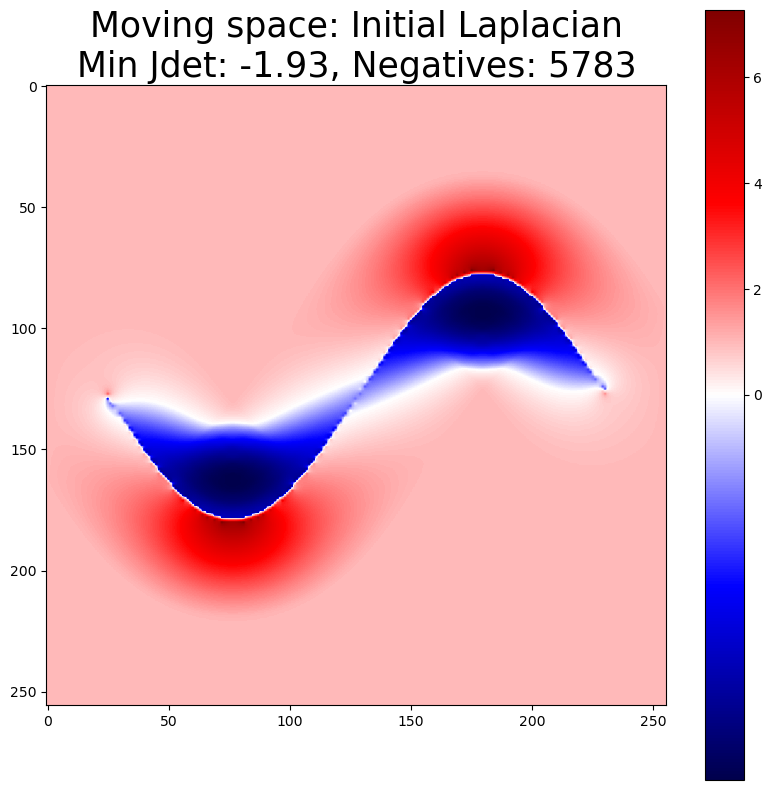

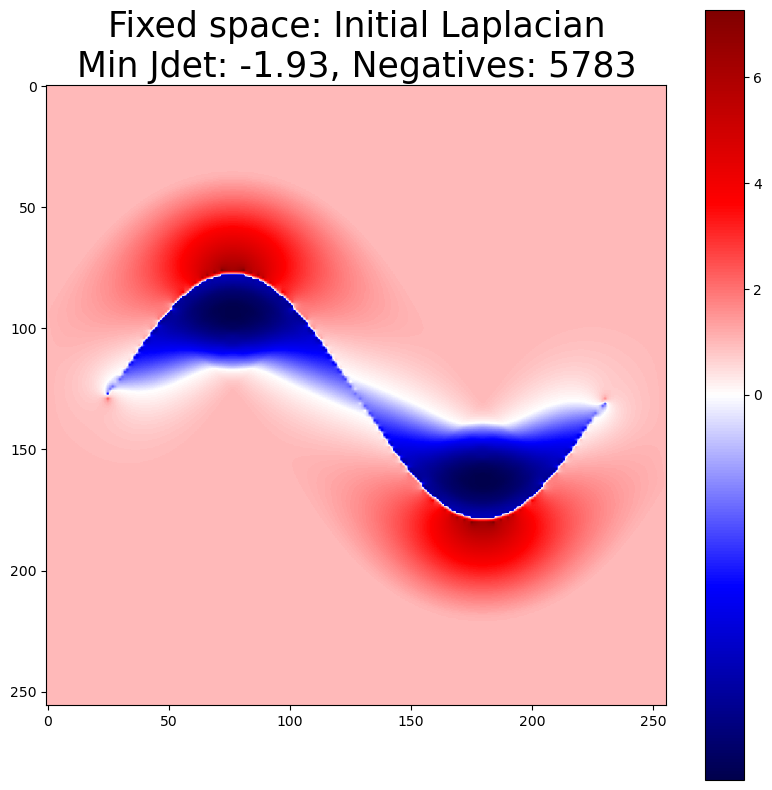

Found 9297 expanding Jacobian determinants with threshold 1.3.



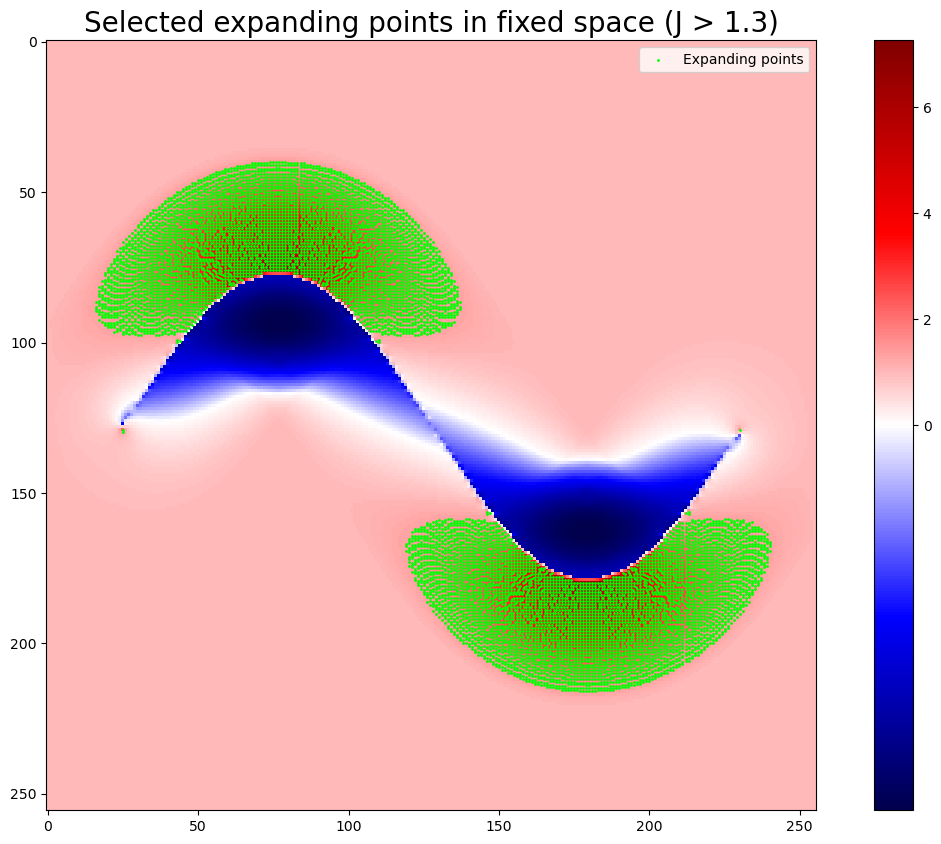

New moving points shape: (9249, 3)
New fixed points shape: (9249, 3)
Cleaned new moving points shape: (9249, 3)
Cleaned new fixed points shape: (9249, 3)
Cleaned new fixed points shape: (9249, 3)
Cleaned new moving points shape: (9249, 3)


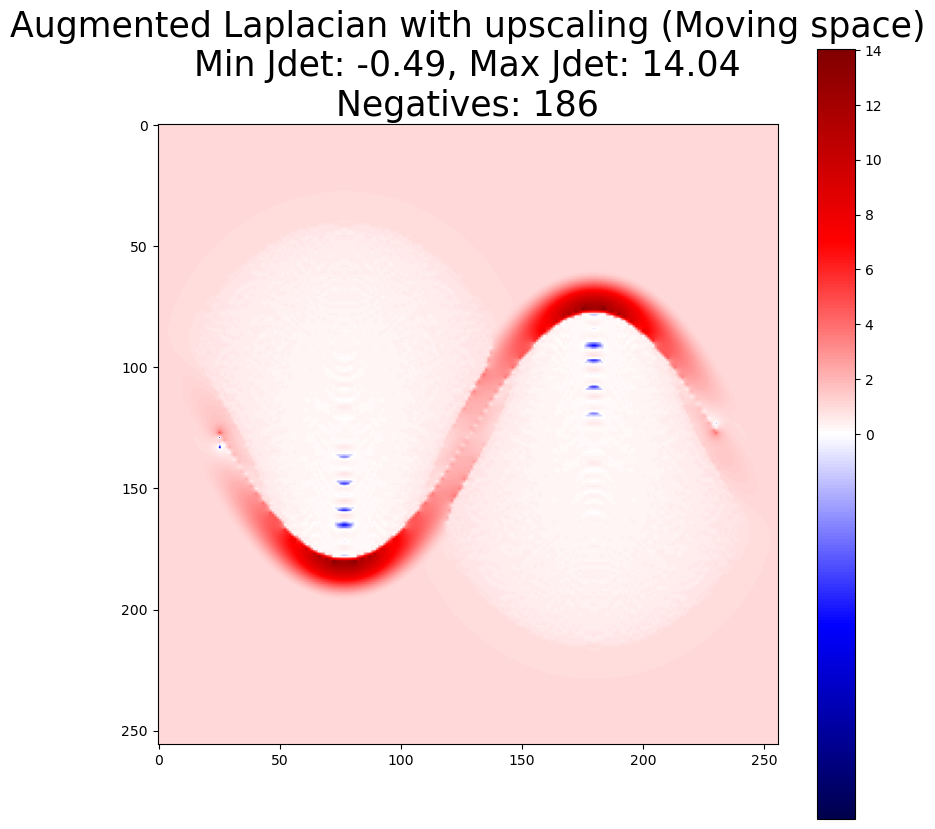

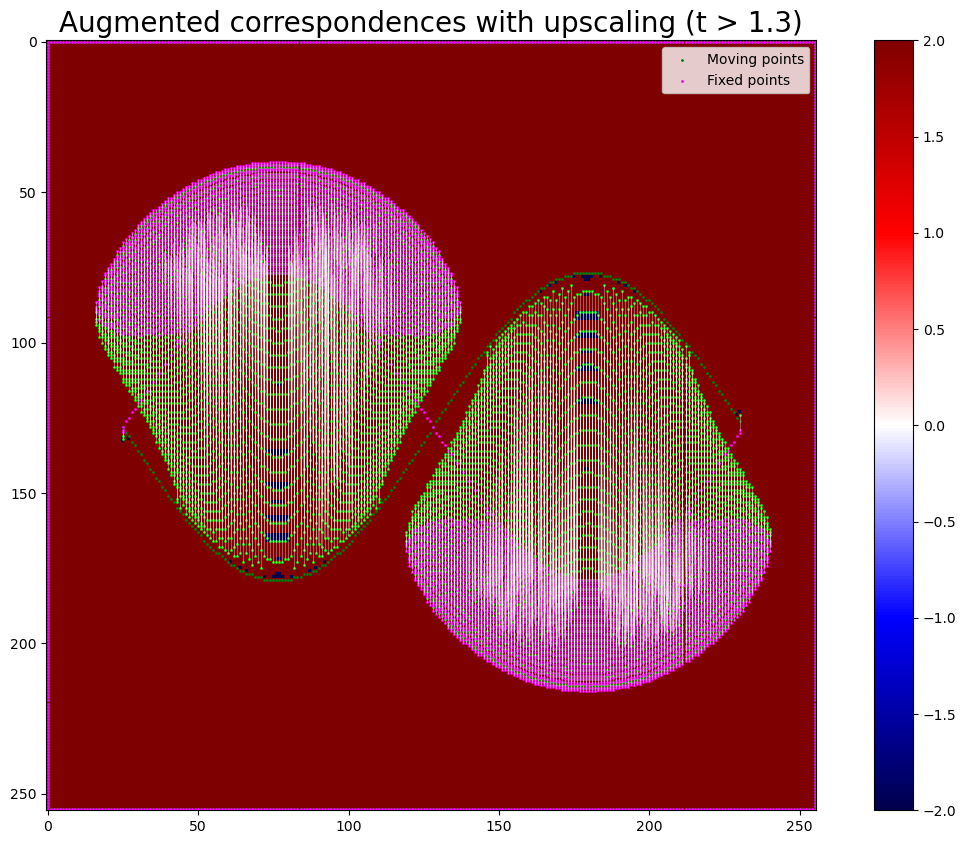

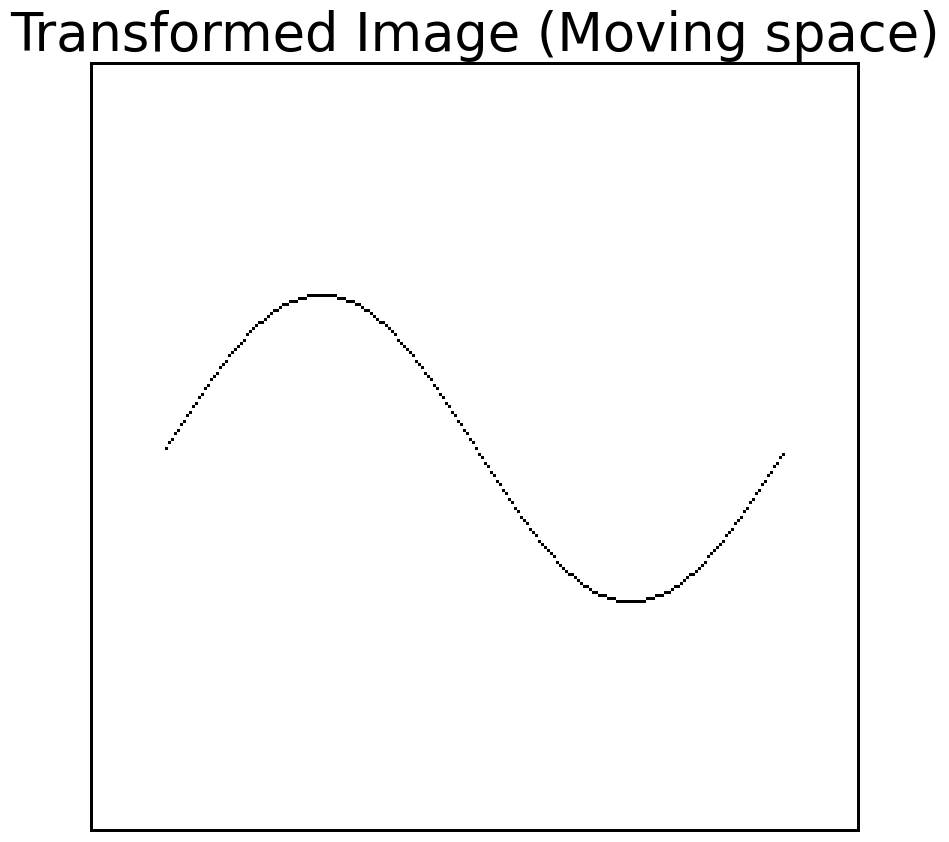

In [3]:
scale = 3
jdet_threshold = 1.3 # 1.3 default
verbose = False
resolution = (256, 256)
# Remove point pairs where the distance between new_mpoints and new_fpoints is above a threshold
magnitude_thresh = 10000000  # 100 elsewhere
plot_points = True




# 20 x 20 case
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=1,
    amplitude_ratio=0.2,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

"""
# Create a specific double helix for correspondence analysis
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)
"""



mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Make moving and fixed points on the image boundaries
boundary_points = boundary_points_on_grid(resolution)
mpoints = np.vstack([mpoints, boundary_points])
fpoints = np.vstack([fpoints, boundary_points])

#mpoints = mdata
#fpoints = fdata


# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = Data_Moving(mpoints, fpoints, resolution)

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Moving space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Fixed space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")





# For each expanding coordinate, get the adjacent coordinates in the upscaled deformation field

# Create points from the initial fixed Laplacian to interpolate throughout the upscaled grid.
ifpoints = []
idisplacements = []
for y in range(resolution[0]):
    for x in range(resolution[1]):
        #print(f"Current point: ({y}, {x})")
        curr_fpoint = (y, x)
        curr_displacement = d_fixed.deformation[1:, 0, curr_fpoint[0], curr_fpoint[1]]
        #print(f"Mapped point: {curr_mpoint}")
        ifpoints.append(curr_fpoint)
        idisplacements.append(curr_displacement)
ifpoints = np.array(ifpoints)
idisplacements = np.array(idisplacements)
interp_coords = interpolate_coordinates(ifpoints, idisplacements, grid_shape=resolution, scale=scale)

# Now convert the interp_coords to moving coordinates
for i in range(interp_coords.shape[1]):
    for j in range(interp_coords.shape[2]):
        interp_coords[:, i, j] = np.array([i, j]) + interp_coords[:, i, j]

# Get the coordinates of the expanding points in the fixed Laplacian
expanding_coord = get_expanding_coordinates(d_fixed.jdet_field, threshold=jdet_threshold, verbose=False)
# Remove points that occur in the fixed points set
expanding_coord = np.array([coord for coord in expanding_coord if tuple(coord) not in set(map(tuple, d_moving.fpoints[:, 1:]))])


print()
new_mpoints = []
new_fpoints = []
for y, x in expanding_coord:
    #new_fpoints.append([0, y, x])
    #new_mpoints = [np.concatenate([[0], np.round(get_mapped_point(f[1:], d_fixed.deformation)).astype(int)]) for f in new_fpoints]
    best_fpoint, best_mpoint = get_best_neighbor(y, x, interp_coords, scale=scale)
    # Add a zero at the beginning for Data class compatibility
    new_fpoints.append([0, best_fpoint[0], best_fpoint[1]])
    new_mpoints.append([0, best_mpoint[0], best_mpoint[1]])
# Convert to numpy arrays for consistency
new_mpoints = np.array(new_mpoints)
new_fpoints = np.array(new_fpoints)

###### Visualize the Jacobian determinant field with J > thresh ######
plt.figure(figsize=(15, 10))
jdet_field = d_fixed.jdet_field.copy()
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())

plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Connect moving and fixed points
plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='lime', s=1, label='Expanding points')
plt.title(f"Selected expanding points in fixed space (J > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()



print("New moving points shape:", new_mpoints.shape)
print("New fixed points shape:", new_fpoints.shape)

# Remove duplicates as before
new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])


# Compute distances for each pair
distances = np.linalg.norm(new_mpoints[:, 1:] - new_fpoints[:, 1:], axis=1)

# Create a mask for pairs within the threshold
mask = distances < magnitude_thresh

# Filter both arrays using the mask
new_mpoints = new_mpoints[mask]
new_fpoints = new_fpoints[mask]

print("Cleaned new moving points shape:", new_mpoints.shape)
print("Cleaned new fixed points shape:", new_fpoints.shape)

old_mpoints = mpoints.copy()
old_fpoints = fpoints.copy()


# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

print("Cleaned new fixed points shape:", new_fpoints.shape)
print("Cleaned new moving points shape:", new_mpoints.shape)

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# Create a new Data object with the updated points
d_expanded = Data_Moving(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Augmented Laplacian with upscaling (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Max Jdet: {d_expanded.jdet_field.max():.2f}\nNegatives: {d_expanded.count_negatives()}")
#d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Output: Laplacian with new correspondences (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")

###### Visualize the Jacobian determinant field with new correspondences ######
plt.figure(figsize=(15, 10))
jdet_field = d_expanded.jdet_field.copy()
jdet_field[jdet_field < 0] = -2  # Clip values below -1 for better visualization
jdet_field[jdet_field > 0] = 2  # Clip values below -1 for better visualization

norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())
plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Vectorized plotting for all correspondences
# Draw lines between new_mpoints and new_fpoints
if plot_points:
       plt.plot(
       np.stack([new_mpoints[:, 2], new_fpoints[:, 2]]),
       np.stack([new_mpoints[:, 1], new_fpoints[:, 1]]),
       c='white', linewidth=0.5, alpha=0.5
       )

       # Scatter all points at once
       plt.scatter(new_mpoints[:, 2], new_mpoints[:, 1], c='lime', s=1)
       plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='magenta', s=1)
       plt.scatter(old_mpoints[:, 2], old_mpoints[:, 1], c='green', s=1, label='Moving points', alpha=1)  # 0.15
       plt.scatter(old_fpoints[:, 2], old_fpoints[:, 1], c='magenta', s=1, label='Fixed points', alpha=1)
       

plt.title(f"Augmented correspondences with upscaling (t > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()


# Save to raw image
moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.fpoints, resolution, save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_expanded, moving_img, title="Transformed Image (Moving space)")

## Moving space++

In [2]:
def get_best_neighbor(y, x, upscaled_coords, scale=1, verbose=False):
    """
    Get the 8 nearest neighbors in the upscaled Jacobian determinant field.
    """
    m_current = upscaled_coords[:, y * scale, x * scale] / scale
    fneighbors = [(y, x)]
    mneighbors = [m_current]
    for dy in [-1, 0, 1]:
        for dx in [-1, 0, 1]:
            if dy == 0 and dx == 0:
                continue
            ny, nx = y * scale + dy, x * scale + dx
            if 0 <= ny < upscaled_coords.shape[1] and 0 <= nx < upscaled_coords.shape[2]:
                fneighbors.append((ny  / scale, nx / scale))
                mneighbors.append(upscaled_coords[:, ny, nx] / scale)
                
    m_current_rounded = np.round(m_current).astype(int)
    # For each neighbor, get the pair that is closest to m_current_rounded relative to the moving point
    fneighbors = np.array(fneighbors)
    mneighbors = np.array(mneighbors)
    distances = np.linalg.norm(mneighbors - m_current_rounded, axis=1)
    closest_idx = np.argmin(distances)
    if verbose:
        print(f"Current point: ({y}, {x}) -> Moving point: {m_current}")
        for i in range(len(fneighbors)):
            print(f"Neighbor {i}: Fixed point: {fneighbors[i]}, Moving point: {mneighbors[i]}")
        print(f"Closest neighbor: Fixed point: {fneighbors[closest_idx]}, Moving point: {mneighbors[closest_idx]}")
        if closest_idx != 0:
            print(f"Current point: {m_current_rounded} is not the closest neighbor, closest is {fneighbors[closest_idx]} with moving point {mneighbors[closest_idx]}")
    return fneighbors[closest_idx], m_current_rounded

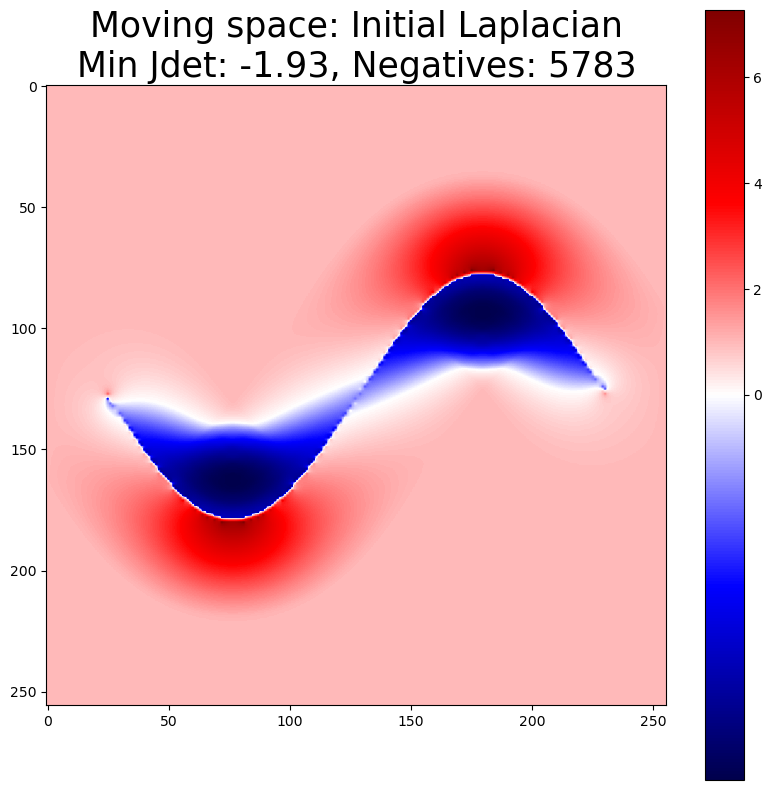

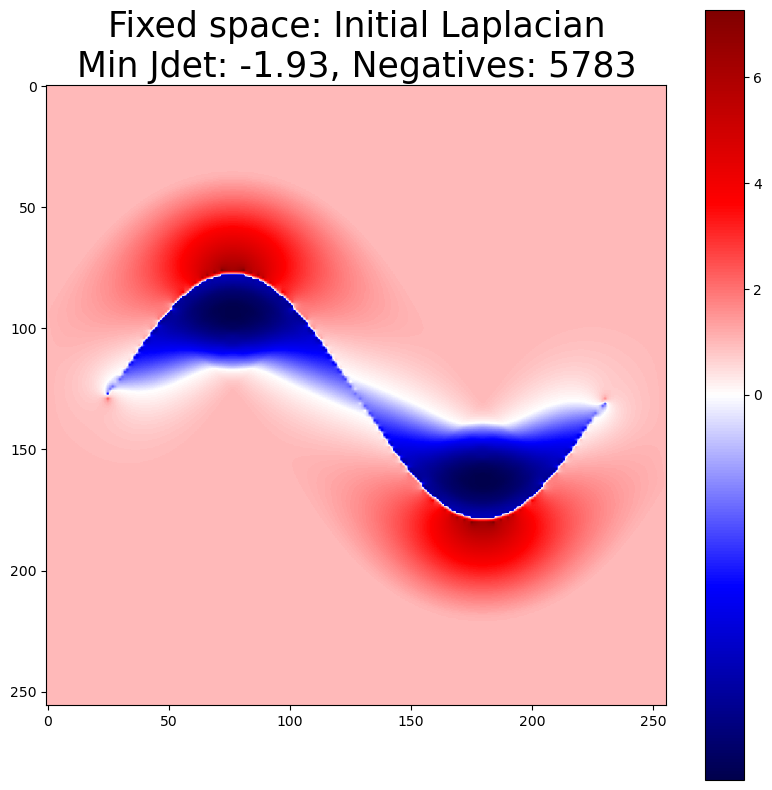

Found 9297 expanding Jacobian determinants with threshold 1.3.



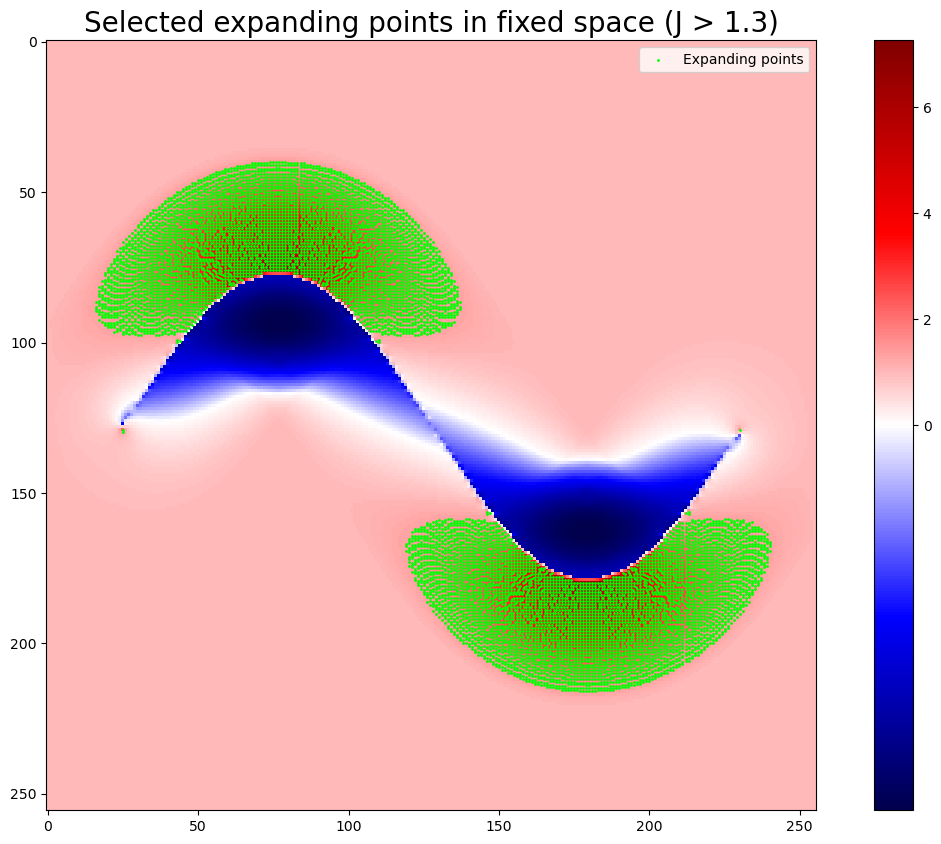

New moving points shape: (9249, 3)
New fixed points shape: (9249, 3)
Cleaned new moving points shape: (9249, 3)
Cleaned new fixed points shape: (9249, 3)
Cleaned new fixed points shape: (9249, 3)
Cleaned new moving points shape: (9249, 3)


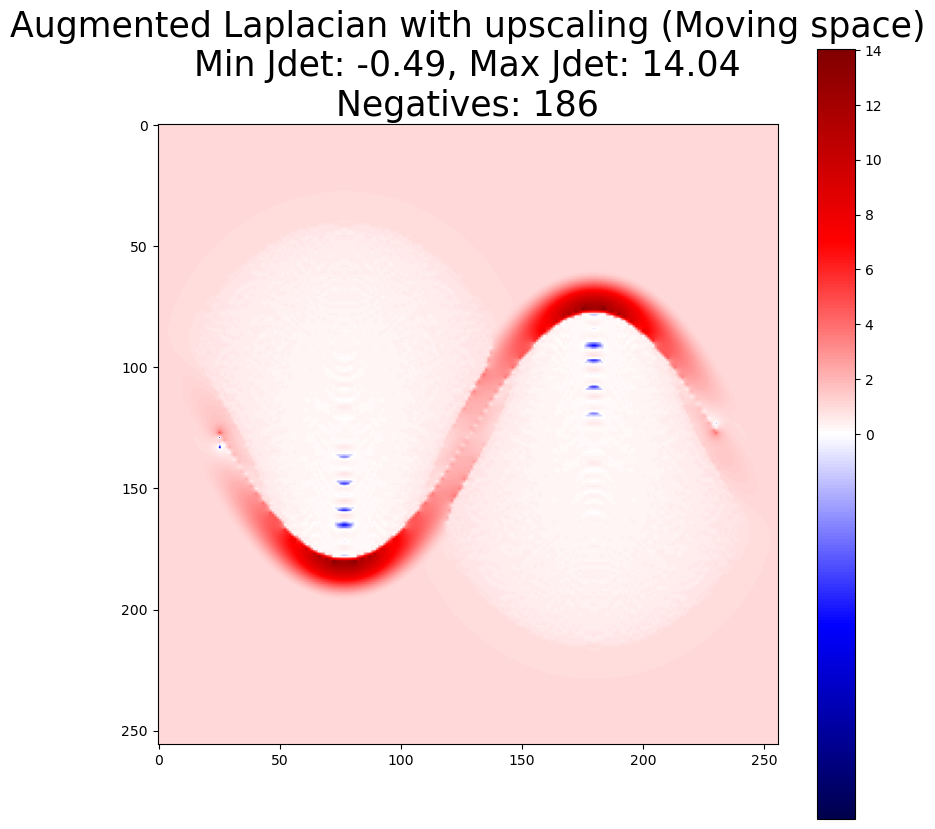

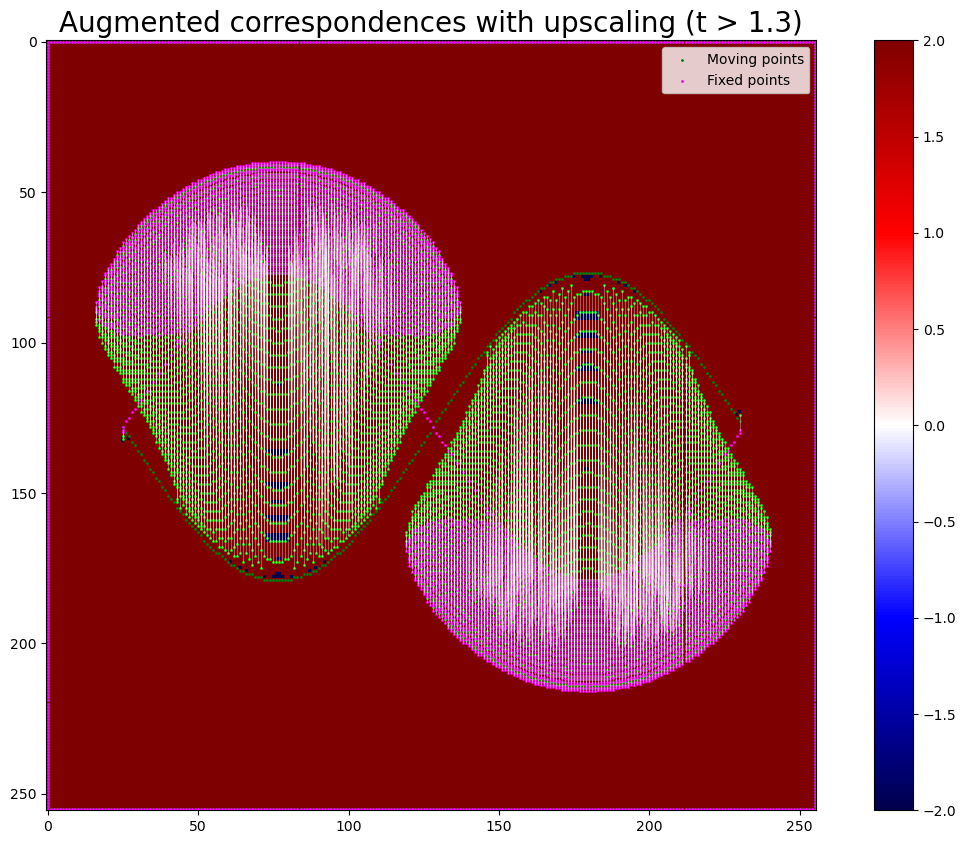

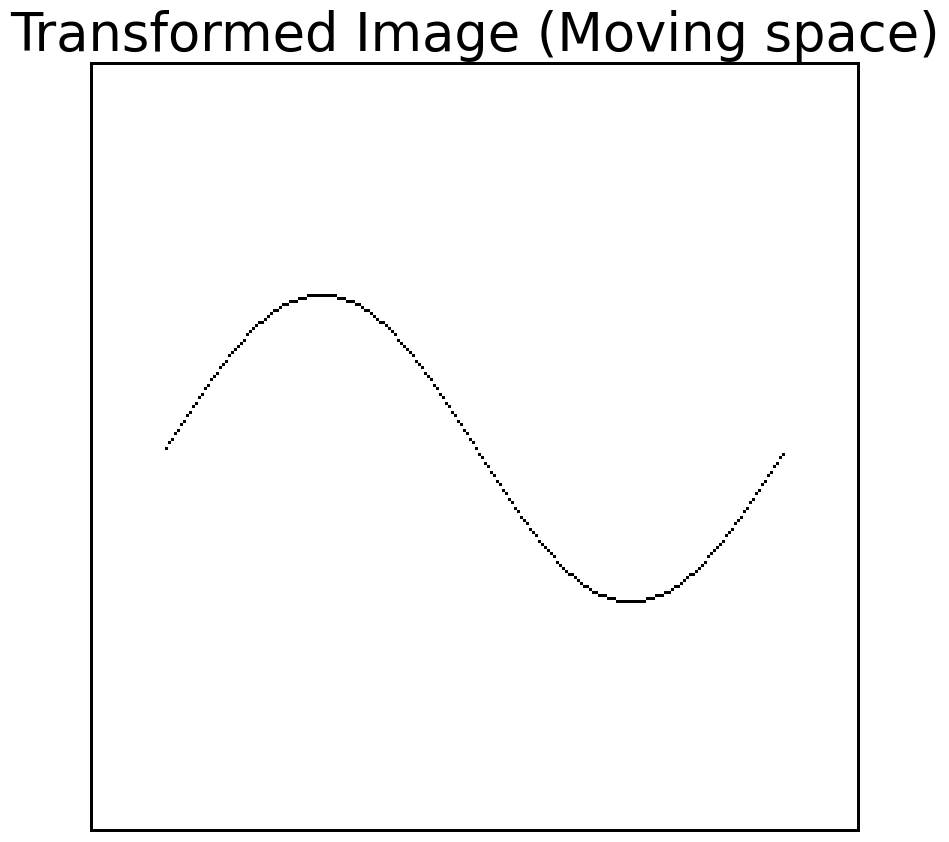

In [5]:
scale = 3
jdet_threshold = 1.3 # 1.3 default
verbose = False
resolution = (256, 256)
# Remove point pairs where the distance between new_mpoints and new_fpoints is above a threshold
magnitude_thresh = 10000000  # 100 elsewhere
plot_points = True




# 20 x 20 case
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=1,
    amplitude_ratio=0.2,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

"""
# Create a specific double helix for correspondence analysis
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)
"""



mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Make moving and fixed points on the image boundaries
boundary_points = boundary_points_on_grid(resolution)
mpoints = np.vstack([mpoints, boundary_points])
fpoints = np.vstack([fpoints, boundary_points])

#mpoints = mdata
#fpoints = fdata


# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = Data_Moving(mpoints, fpoints, resolution)

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Moving space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Fixed space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")





# For each expanding coordinate, get the adjacent coordinates in the upscaled deformation field

# Create points from the initial fixed Laplacian to interpolate throughout the upscaled grid.
ifpoints = []
impoints = []
for y in range(resolution[0]):
    for x in range(resolution[1]):
        #print(f"Current point: ({y}, {x})")
        curr_fpoint = (y, x)
        curr_mpoint = get_mapped_point(curr_fpoint, d_fixed.deformation)
        #print(f"Mapped point: {curr_mpoint}")
        ifpoints.append(curr_fpoint)
        impoints.append(curr_mpoint)
ifpoints = np.array(ifpoints)
impoints = np.array(impoints)
interp_coords = interpolate_coordinates(ifpoints, impoints, grid_shape=resolution, scale=scale)
# Get the coordinates of the expanding points in the fixed Laplacian
expanding_coord = get_expanding_coordinates(d_fixed.jdet_field, threshold=jdet_threshold, verbose=False)
# Remove points that occur in the fixed points set
expanding_coord = np.array([coord for coord in expanding_coord if tuple(coord) not in set(map(tuple, d_moving.fpoints[:, 1:]))])


print()
new_mpoints = []
new_fpoints = []
for y, x in expanding_coord:
    #new_fpoints.append([0, y, x])
    #new_mpoints = [np.concatenate([[0], np.round(get_mapped_point(f[1:], d_fixed.deformation)).astype(int)]) for f in new_fpoints]
    best_fpoint, best_mpoint = get_best_neighbor(y, x, interp_coords, scale=scale)
    # Add a zero at the beginning for Data class compatibility
    new_fpoints.append([0, best_fpoint[0], best_fpoint[1]])
    new_mpoints.append([0, best_mpoint[0], best_mpoint[1]])
# Convert to numpy arrays for consistency
new_mpoints = np.array(new_mpoints)
new_fpoints = np.array(new_fpoints)

###### Visualize the Jacobian determinant field with J > thresh ######
plt.figure(figsize=(15, 10))
jdet_field = d_fixed.jdet_field.copy()
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())

plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Connect moving and fixed points
plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='lime', s=1, label='Expanding points')
plt.title(f"Selected expanding points in fixed space (J > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()



print("New moving points shape:", new_mpoints.shape)
print("New fixed points shape:", new_fpoints.shape)

# Remove duplicates as before
new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])


# Compute distances for each pair
distances = np.linalg.norm(new_mpoints[:, 1:] - new_fpoints[:, 1:], axis=1)

# Create a mask for pairs within the threshold
mask = distances < magnitude_thresh

# Filter both arrays using the mask
new_mpoints = new_mpoints[mask]
new_fpoints = new_fpoints[mask]

print("Cleaned new moving points shape:", new_mpoints.shape)
print("Cleaned new fixed points shape:", new_fpoints.shape)

old_mpoints = mpoints.copy()
old_fpoints = fpoints.copy()


# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

print("Cleaned new fixed points shape:", new_fpoints.shape)
print("Cleaned new moving points shape:", new_mpoints.shape)

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# Create a new Data object with the updated points
d_expanded = Data_Moving(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Augmented Laplacian with upscaling (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Max Jdet: {d_expanded.jdet_field.max():.2f}\nNegatives: {d_expanded.count_negatives()}")
#d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Output: Laplacian with new correspondences (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")

###### Visualize the Jacobian determinant field with new correspondences ######
plt.figure(figsize=(15, 10))
jdet_field = d_expanded.jdet_field.copy()
jdet_field[jdet_field < 0] = -2  # Clip values below -1 for better visualization
jdet_field[jdet_field > 0] = 2  # Clip values below -1 for better visualization

norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())
plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Vectorized plotting for all correspondences
# Draw lines between new_mpoints and new_fpoints
if plot_points:
       plt.plot(
       np.stack([new_mpoints[:, 2], new_fpoints[:, 2]]),
       np.stack([new_mpoints[:, 1], new_fpoints[:, 1]]),
       c='white', linewidth=0.5, alpha=0.5
       )

       # Scatter all points at once
       plt.scatter(new_mpoints[:, 2], new_mpoints[:, 1], c='lime', s=1)
       plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='magenta', s=1)
       plt.scatter(old_mpoints[:, 2], old_mpoints[:, 1], c='green', s=1, label='Moving points', alpha=1)  # 0.15
       plt.scatter(old_fpoints[:, 2], old_fpoints[:, 1], c='magenta', s=1, label='Fixed points', alpha=1)
       

plt.title(f"Augmented correspondences with upscaling (t > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()


# Save to raw image
moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.fpoints, resolution, save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_expanded, moving_img, title="Transformed Image (Moving space)")

## Moving space+

In [2]:
def get_best_neighbor(y, x, upscaled_coords, scale=1):
    """
    Get the 8 nearest neighbors in the upscaled Jacobian determinant field.
    """
    m_current = upscaled_coords[:, y * scale, x * scale] / scale
    fneighbors = [(y, x)]
    mneighbors = [m_current]
    for dy in [-1, 0, 1]:
        for dx in [-1, 0, 1]:
            if dy == 0 and dx == 0:
                continue
            ny, nx = y * scale + dy, x * scale + dx
            if 0 <= ny < upscaled_coords.shape[1] and 0 <= nx < upscaled_coords.shape[2]:
                fneighbors.append((ny  / scale, nx / scale))
                mneighbors.append(upscaled_coords[:, ny, nx] / scale)
                
    m_current_rounded = np.round(m_current).astype(int)
    # For each neighbor, get the pair that is closest to m_current_rounded relative to the moving point
    fneighbors = np.array(fneighbors)
    mneighbors = np.array(mneighbors)
    distances = np.linalg.norm(mneighbors[:, 1:] - m_current_rounded[1:], axis=1)
    closest_idx = np.argmin(distances)
    #print(f"Current point: ({y}, {x}) -> Moving point: {m_current}")
    #for i in range(len(fneighbors)):
    #    print(f"Neighbor {i}: Fixed point: {fneighbors[i]}, Moving point: {mneighbors[i]}")
    #print(f"Closest neighbor: Fixed point: {fneighbors[closest_idx]}, Moving point: {mneighbors[closest_idx]}")
    if closest_idx != 0:
        print("Not 0!")
    return fneighbors[closest_idx], m_current_rounded

In [107]:
test = expanding_fpts[2]
fn, mn = get_best_neighbor(test[0], test[1], interp_coords, scale=3)

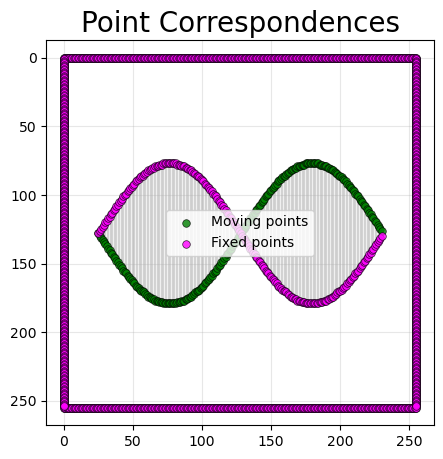

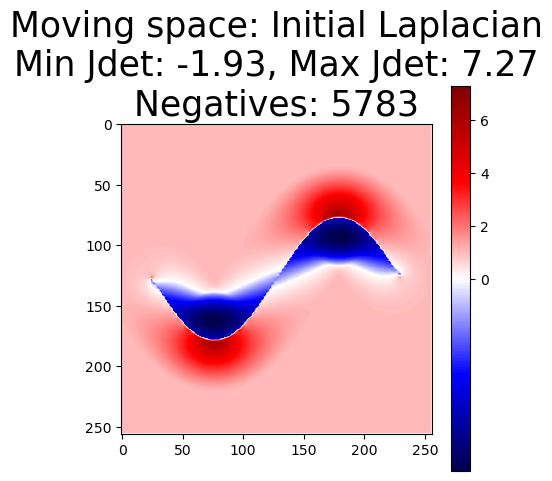

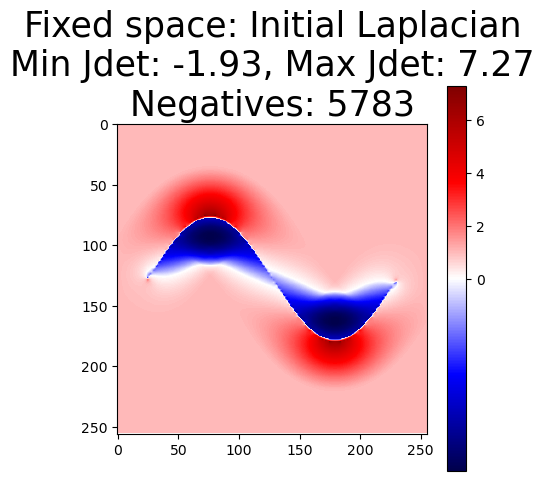

Found 2448 expanding Jacobian determinants with threshold 3.
Expanding points in fixed space (Jdet > 3): 2448 points
Expanding moving points shape: (2448, 2)
Cleaned expanding fixed points shape: (2444, 3)
Cleaned expanding moving points shape: (2444, 3)


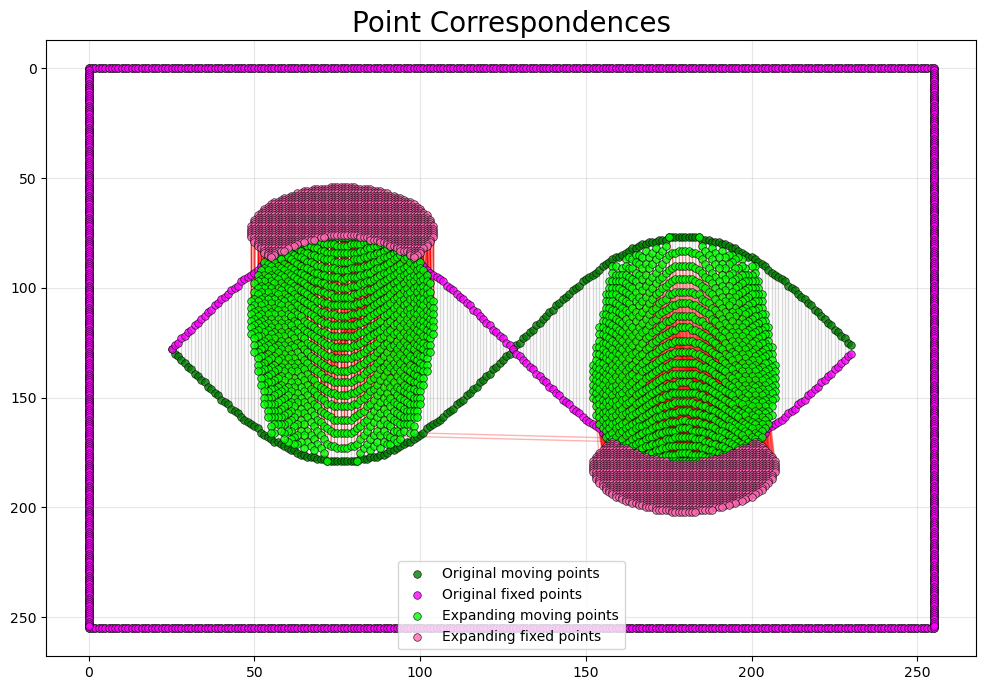

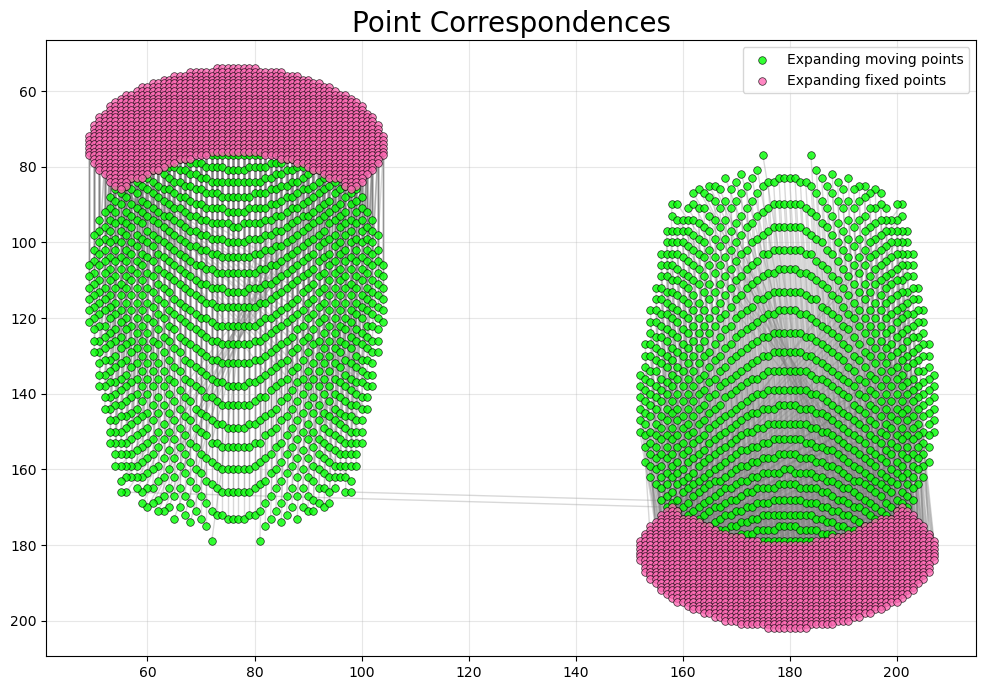

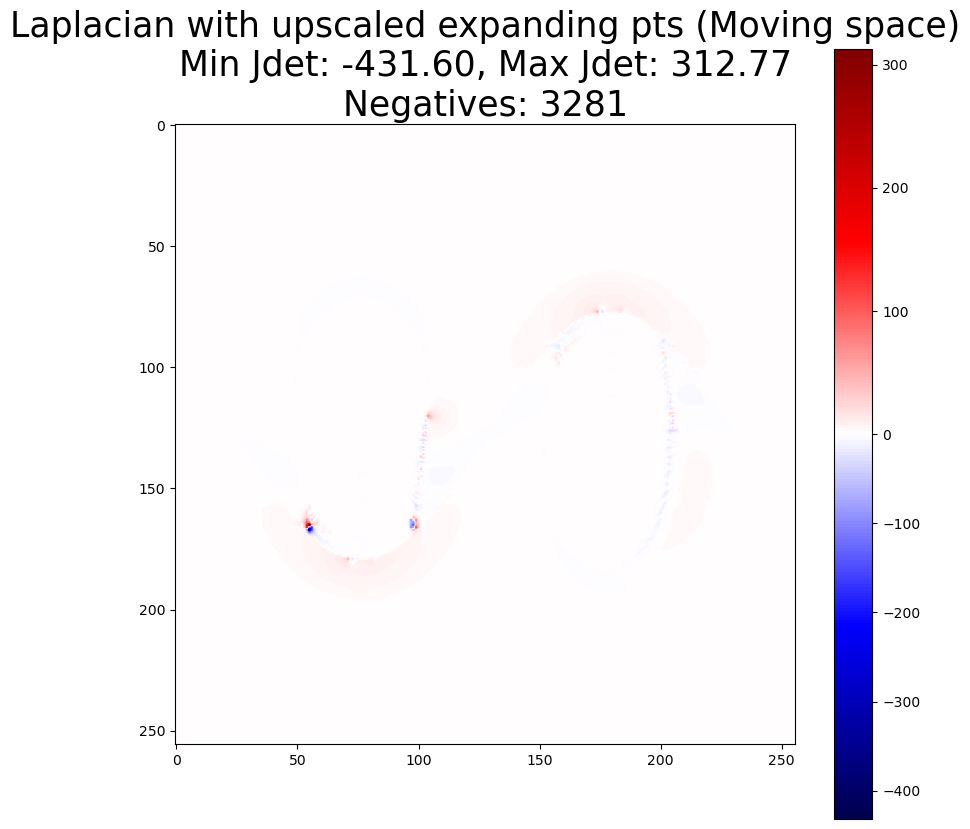

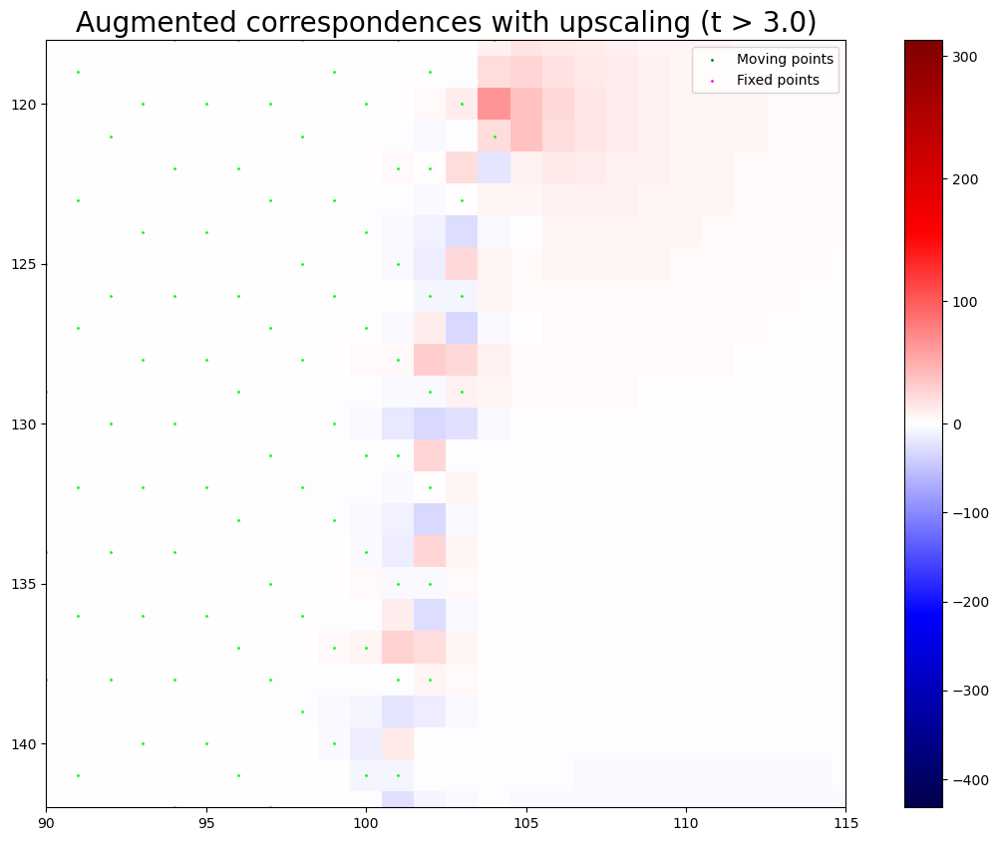

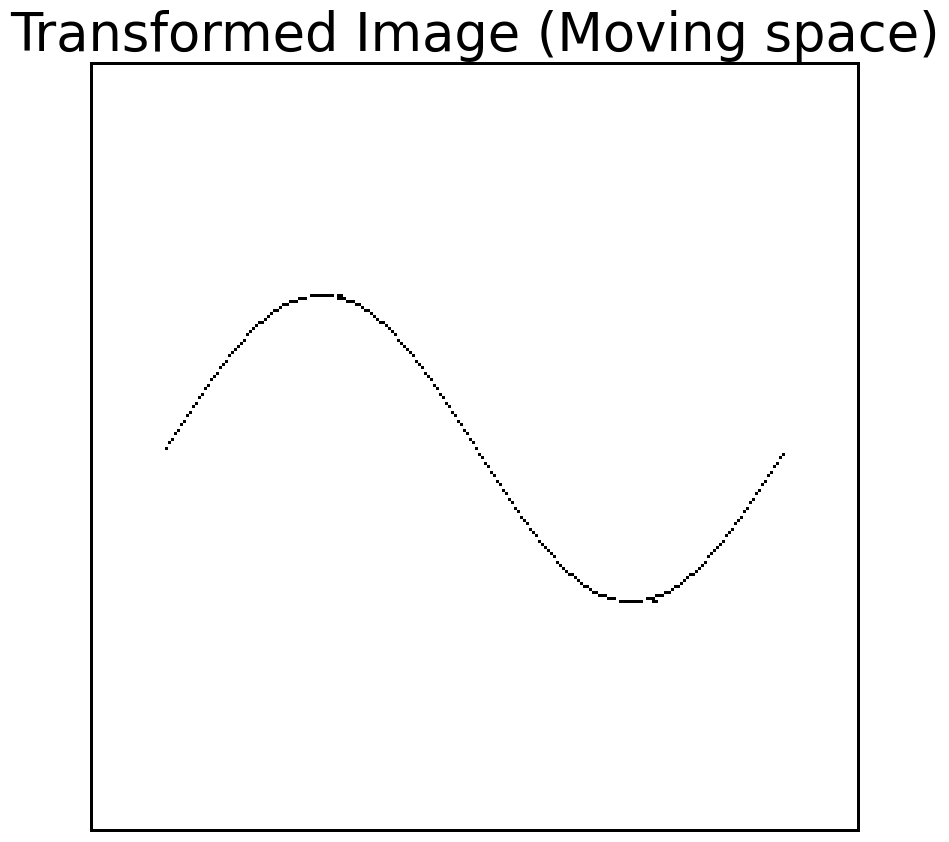

In [4]:
scale = 3
jdet_threshold = 3
resolution = (256, 256)

################################################################################################

# 20 x 20 case
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=1,
    amplitude_ratio=0.2,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)


"""
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)
"""

################################################################################################

# Swap to (y, x) format 
mpoints = mpoints[:, [1, 0]]
fpoints = fpoints[:, [1, 0]]  

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Make moving and fixed points on the image boundaries
boundary_points = boundary_points_on_grid(resolution)
mpoints = np.vstack([mpoints, boundary_points])
fpoints = np.vstack([fpoints, boundary_points])

# Show the initial correspondences
_ = plot_point_correspondences(mpoints[:, [2, 1]], fpoints[:, [2, 1]], labels=('Moving points', 'Fixed points'), colors=('green', 'magenta'), figsize=(5, 5))

# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = Data_Moving(mpoints, fpoints, resolution)
d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(5, 5), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Max Jdet: {np.max(d_moving.jdet_field):.2f}\nNegatives: {d_moving.count_negatives()}")
d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(5, 5), binarize_negatives=False,
         title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Max Jdet: {np.max(d_fixed.jdet_field):.2f}\nNegatives: {d_fixed.count_negatives()}")
    
# Create points from the initial fixed Laplacian to interpolate throughout the upscaled grid.
ifpoints = []
impoints = []
for y in range(resolution[0]):
    for x in range(resolution[1]):
        #print(f"Current point: ({y}, {x})")
        curr_fpoint = (y, x)
        curr_mpoint = get_mapped_point(curr_fpoint, d_fixed.deformation)
        #print(f"Mapped point: {curr_mpoint}")
        ifpoints.append(curr_fpoint)
        impoints.append(curr_mpoint)
ifpoints = np.array(ifpoints)
impoints = np.array(impoints)
interp_coords = interpolate_coordinates(ifpoints, impoints, grid_shape=resolution, scale=scale)

"""
# Print the interpolated coordinates throughout the grid, including axis numbers
print("\nInterpolated coordinates throughout the grid:\ny - ↓, x ->")
# Print column headers (x-axis)
header = ["\t"] + [f"  {x/scale:.2f}\t\t\t\t" for x in range(interp_coords.shape[2] - scale + 1)]
print("".join(header))
for y in range(interp_coords.shape[1] - scale + 1):
    row = [f"{y/scale:.2f}|"]  # Row header (y-axis)
    for x in range(interp_coords.shape[2] - scale + 1):
        entry = f"\t({abs(interp_coords[0, y, x])/scale:.1f}, {interp_coords[1, y, x]/scale:.1f})"
        if entry == "(nan, nan)\t":
            entry = "    nan\t\t"
        row.append(f"{entry}\t\t")
    print("".join(row))
export_interpolated_grid_to_csv(interp_coords, scale=scale, filename="interpolated_grid.csv")
"""

###############################################################################
# GET EXPANDING POINTS FROM THE FIXED LAPLACIAN AND CLEAN UP THE COORDINATES
###############################################################################

# Upscale the Jacobian determinant field from the fixed Laplacian and get the coordinates of the expanding points
expanding_fpts = get_expanding_coordinates(d_fixed.jdet_field, threshold=jdet_threshold, verbose=False)
print(f"Expanding points in fixed space (Jdet > {jdet_threshold}): {len(expanding_fpts)} points")

# Save all of the expanding upscaled coordinate pairs
expanding_mpts = []
for i in range(len(expanding_fpts)):
    y, x = expanding_fpts[i]
    expanding_mpts.append(interp_coords[:, y * scale, x * scale] / scale)
expanding_mpts = np.array(expanding_mpts)
expanding_fpts = np.array(expanding_fpts)
print(f"Expanding moving points shape: {expanding_mpts.shape}")

new_fpts = []
new_mpts = []
# For every expanding fixed coordinate, get the best of its 8 nearest neighbors in the upscaled space
for fpt in expanding_fpts:
    y, x = fpt
    # Get the 8 nearest neighbors in the upscaled space
    best_f, best_m = get_best_neighbor(y, x, interp_coords, scale=3)
    new_fpts.append(best_f)  # Fixed point
    new_mpts.append(best_m)  # Moving point

# Stack zeros to the first axis for Data class compatibility

#expanding_mpts = np.pad(new_mpts, ((0, 0), (1, 0)), mode='constant', constant_values=0)
#expanding_fpts = np.pad(new_fpts, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Make sure all expanding moving points are unique and do not duplicate in expanding moving points, remove the corresponding pairs in expanding_fpoints that are duplicates
expanding_mpts = np.pad(expanding_mpts, ((0, 0), (1, 0)), mode='constant', constant_values=0)
expanding_fpts = np.pad(expanding_fpts, ((0, 0), (1, 0)), mode='constant', constant_values=0)
expanding_mpts = np.round(expanding_mpts).astype(int)
#expanding_mpoints = np.unique(expanding_mpoints, axis=0)
#expanding_fpoints = np.array([fp for fp, mp in zip(expanding_fpoints, expanding_mpoints) if tuple(mp[1:]) not in set(map(tuple, expanding_mpoints[:, 1:]))])

# Make sure the expanding points are unique and do not overlap with the original fixed points or moving points
expanding_fpts = np.array([fp for fp in expanding_fpts if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
expanding_mpts = np.array([mp for mp, fp in zip(expanding_mpts, expanding_fpts) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

print("Cleaned expanding fixed points shape:", expanding_fpts.shape)
print("Cleaned expanding moving points shape:", expanding_mpts.shape)

# Compute distances for each pair
#distances = np.linalg.norm(expanding_mpts[:, 1:] - expanding_fpts[:, 1:], axis=1)
#distances = np.linalg.norm(expanding_mpoints[:, 2] - expanding_fpoints[:, 2], axis=0)

# Create a mask for pairs within the threshold
#mask = distances < magnitude_thresh

# Filter both arrays using the mask
#expanding_mpts = expanding_mpts[mask]
#expanding_fpts = expanding_fpts[mask]


plot_point_correspondences(mpoints[:, [2, 1]], fpoints[:, [2, 1]],
                           expanding_mpts[:, [2, 1]], expanding_fpts[:, [2, 1]],
                           labels=('Original moving points', 'Original fixed points', 'Expanding moving points', 'Expanding fixed points'),
                           colors=('green', 'magenta', 'lime', 'hotpink'))


plot_point_correspondences(expanding_mpts[:, [2, 1]], expanding_fpts[:, [2, 1]],
                           labels=('Expanding moving points', 'Expanding fixed points'),
                           colors=('lime', 'hotpink'))

# Update the original moving and fixed points with the expanding points
merged_mpoints = np.vstack((mpoints, expanding_mpts))
merged_fpoints = np.vstack((fpoints, expanding_fpts))

###############################################################################
# SHOW RESULTS
###############################################################################

# Create a new Data object with the updated points
d_merged = Data_Moving(merged_mpoints, merged_fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_merged.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Laplacian with upscaled expanding pts (Moving space)\nMin Jdet: {d_merged.min():.2f}, Max Jdet: {d_merged.jdet_field.max():.2f}\nNegatives: {d_merged.count_negatives()}")

###### Visualize the Jacobian determinant field with new correspondences ######
plt.figure(figsize=(15, 10))
jdet_field = d_merged.jdet_field.copy()
#jdet_field[jdet_field > 0] = 2
#jdet_field[jdet_field < 0] = -2
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())
plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Vectorized plotting for all correspondences
# Draw lines between new_mpoints and new_fpoints
#plt.plot(
#    np.stack([expanding_mpoints[:, 2], expanding_fpoints[:, 2]]),
#    np.stack([expanding_mpoints[:, 1], expanding_fpoints[:, 1]]),
#    c='lime', linewidth=0.5, alpha=0.25
#)

"""
expanding_mpoints_to_plot = expanding_mpoints.copy()
expanding_fpoints_to_plot = expanding_fpoints.copy()

pidx = 128

# Remove all indices in both points where moving points has y = 126
mask = expanding_mpoints_to_plot[:, 1] == pidx
expanding_mpoints_to_plot = expanding_mpoints_to_plot[mask]
expanding_fpoints_to_plot = expanding_fpoints_to_plot[mask]


plt.plot(
    np.stack([expanding_mpoints_to_plot[:, 2], expanding_fpoints_to_plot[:, 2]]),
    np.stack([expanding_mpoints_to_plot[:, 1], expanding_fpoints_to_plot[:, 1]]),
    c='lime', linewidth=0.5, alpha=0.5
)
plt.scatter(expanding_mpoints_to_plot[:, 2], expanding_mpoints_to_plot[:, 1], c='lime', s=1)
plt.scatter(expanding_fpoints[:, 2], expanding_fpoints[:, 1], c='hotpink', s=1)
"""

# Scatter all points at once
plt.scatter(expanding_mpts[:, 2], expanding_mpts[:, 1], c='lime', s=1)
plt.scatter(expanding_fpts[:, 2], expanding_fpts[:, 1], c='hotpink', s=1)
plt.scatter(mpoints[:, 2], mpoints[:, 1], c='green', s=1, label='Moving points', alpha=1)  # 0.15
plt.scatter(fpoints[:, 2], fpoints[:, 1], c='magenta', s=1, label='Fixed points', alpha=1)

plt.ylim(118, 142)
plt.xlim(90, 115)
plt.gca().invert_yaxis()

#plt.grid(True, which='both', linestyle='--', linewidth=0.25)
plt.title(f"Augmented correspondences with upscaling (t > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()

moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.fpoints, resolution, save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_merged, moving_img, title="Transformed Image (Moving space)")

### Generate jacobian close up

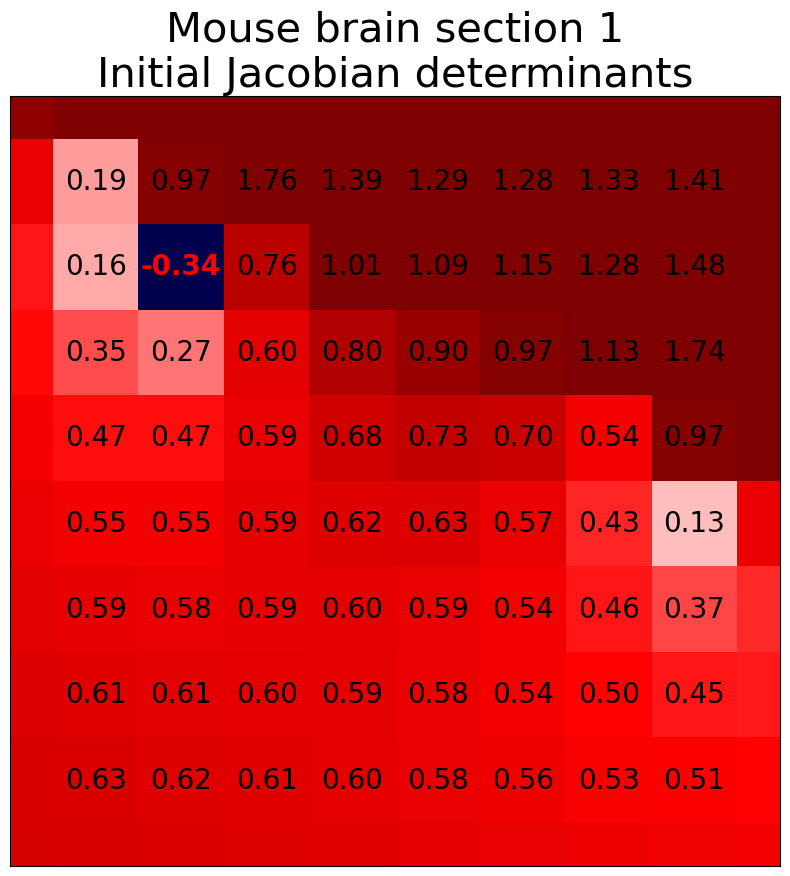

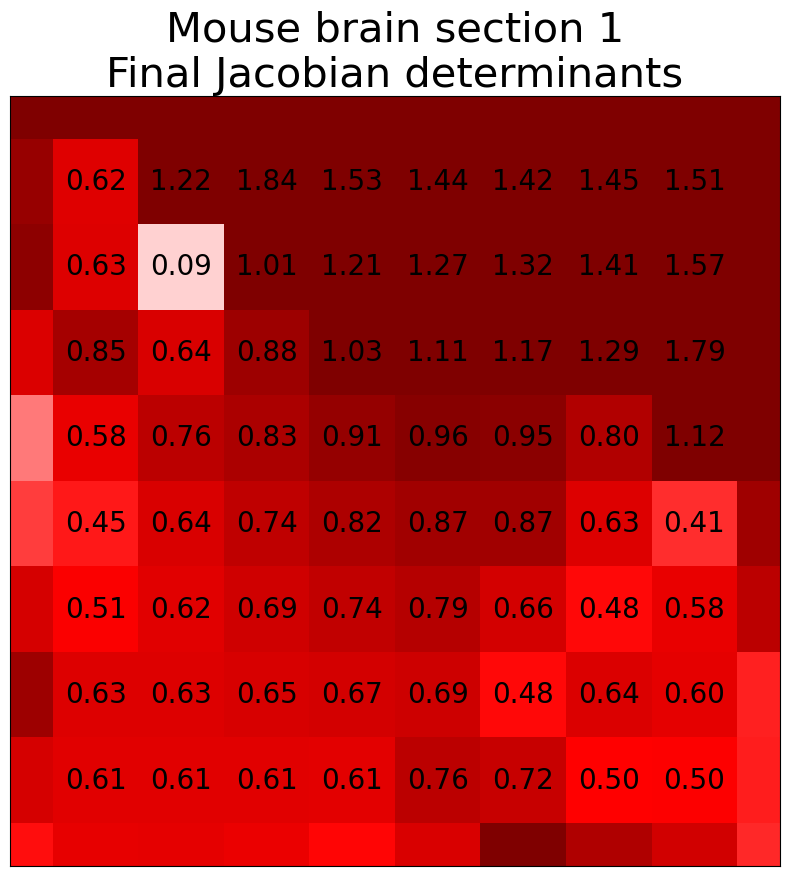

In [ ]:
# For 200:
# ylim = (79, 88)
# xlim = (275, 284)

# For 350:
# (235, 242)
# (197, 204)

# For 500:
# 84 92
# 119 127

ylim = (79, 88)
xlim = (275, 284)

jacobian_plot(d_moving, figsize=(10, 10), 
              title="Mouse brain section 1\nInitial Jacobian determinants",
              ylim=ylim, 
              xlim=xlim, 
              binarize_negatives=True)

jacobian_plot(d_expanded, figsize=(10, 10), 
              title="Mouse brain section 1\nFinal Jacobian determinants",
              ylim=ylim, 
              xlim=xlim, 
              binarize_negatives=True)

[128.9535277  48.       ]
[129.17436679  49.        ]
[129.29865094  50.        ]
[129.3350037  51.       ]
[129.28736784  52.        ]
[129.14947294  53.        ]
[128.91267271  54.        ]
[128.95240683 151.        ]
[129.1737329 152.       ]
[129.29831179 153.        ]
[129.33484044 154.        ]
[129.28729902 155.        ]
[129.14944713 156.        ]
[128.91266519 157.        ]
[131.02890368  48.        ]
[131.29692796  49.        ]
[131.4325478  50.       ]
[131.47084831  51.        ]
[131.42336078  52.        ]
[131.2771472  53.       ]
[130.99448885  54.        ]
[131.02799229 151.        ]
[131.29642269 152.        ]
[131.43228395 153.        ]
[131.47071894 154.        ]
[131.42330401 155.        ]
[131.27712646 156.        ]
[130.9944822 157.       ]
[133.27881428  48.        ]
[133.55938654  49.        ]
[133.67052441  50.        ]
[133.69933597  51.        ]
[133.66542056  52.        ]
[133.54759786  53.        ]
[133.25694227  54.        ]
[133.2782622 151.       ]
[133.5

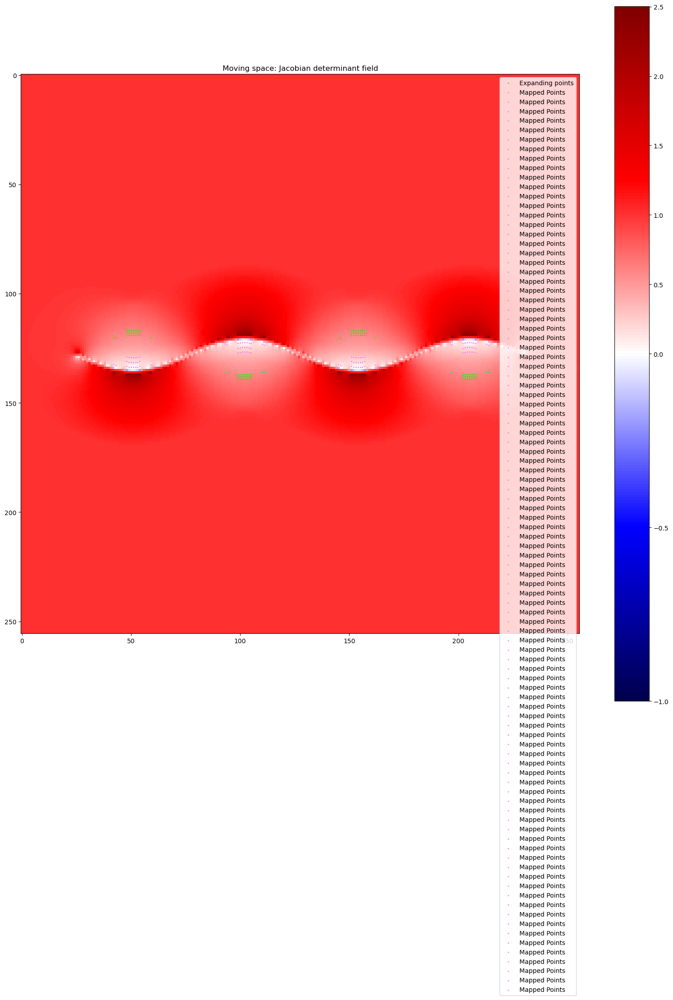

In [ ]:
###### Visualize the Jacobian determinant field with J > thresh ######
plt.figure(figsize=(20, 20))
jdet_field = d_moving.jdet_field.copy()
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())

plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Connect moving and fixed points
plt.scatter(new_mpoints[:, 2], new_mpoints[:, 1], c='lime', s=1, label='Expanding points')

for m in new_mpoints[:]:
    m = m.copy()
    m -= np.array([0, 0, 0])  # Adjust to (y, x) format
    mapped_point = get_mapped_point(m[1:], d_fixed.deformation)
    #print(f"Fixed point: {m[1:]} -> displacement: {get_displacement(m[1:], d_fixed.deformation)[1:]}, \tmapped point: {get_mapped_point(m[1:], d_fixed.deformation)}, \tjacobian: {d_fixed.jdet_field[m[1], m[2]]}")
    #print(mapped_point)
    plt.scatter(mapped_point[1], mapped_point[0], c='violet', s=1, label='Mapped Points')

plt.title(f"Moving space: Jacobian determinant field")
#plt.legend()
plt.show()

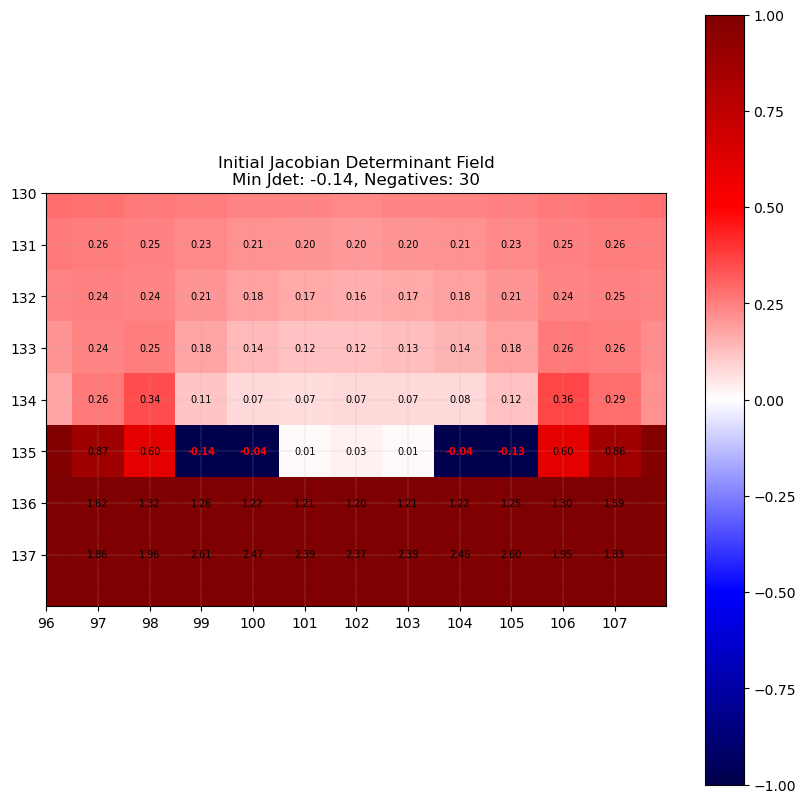

Point [135  98]
Displacement: [-14.00178662   0.        ]
Mapped point: [120.99821338  98.        ].

Point [135  99]
Displacement: [-14.65564734   0.        ]
Mapped point: [120.34435266  99.        ].

Point [135 100]
Displacement: [-14.89165503   0.        ]
Mapped point: [120.10834497 100.        ].

Point [135 101]
Displacement: [-14.98287846   0.        ]
Mapped point: [120.01712154 101.        ].

Point [135 102]
Displacement: [-15.00833411   0.        ]
Mapped point: [119.99166589 102.        ].

Point [135 103]
Displacement: [-14.98533487   0.        ]
Mapped point: [120.01466513 103.        ].

Point [135 104]
Displacement: [-14.89575819   0.        ]
Mapped point: [120.10424181 104.        ].

Point [135 105]
Displacement: [-14.66028857   0.        ]
Mapped point: [120.33971143 105.        ].

Point [135 106]
Displacement: [-14.00178662   0.        ]
Mapped point: [120.99821338 106.        ].



In [72]:
correspondence_pt = (136, 206)  # Point of interest for correspondence

jacobian_plot(d_expanded, pt=correspondence_pt, figsize=(10, 10), 
              title="Initial Jacobian Determinant Field\nMin Jdet: {:.2f}, Negatives: {}".format(d_expanded.min(), d_expanded.count_negatives()),
              xlim=(96, 108), 
              ylim=(130, 138), 
              binarize_negatives=True)

pts = np.array([
    [135, 98],
    [135, 99],
    [135, 100],
    [135, 101],
    [135, 102],
    [135, 103],
    [135, 104],
    [135, 105],
    [135, 106],
])

pts[:, 0] += 0

for pt in pts:
    print(f"Point {pt}")
    print(f"Displacement: {get_displacement(pt, d_expanded.deformation)[1:]}")
    print(f"Mapped point: {get_mapped_point(pt, d_expanded.deformation)}.")
    print()

In [5]:
pt = (136, 206)

pt = np.array(pt)
print("Current point:\t\t", pt)
print("Mapped point:\t\t", get_mapped_point(pt, d_fixed.deformation))

print("\nDisplacement:\t\t", get_displacement(pt, d_fixed.deformation)[1:])

upscaled_displacement = get_displacement(pt * 3, upscaled_fixed[1:])
upscaled_displacement_1 = get_displacement((pt[0] * 3 + 1, pt[1] * scale), upscaled_fixed[1:])
upscaled_displacement_2 = get_displacement((pt[0] * 3 + 2, pt[1] * scale), upscaled_fixed[1:])
upscaled_displacement_3 = get_displacement((pt[0] * 3 + 3, pt[1] * scale), upscaled_fixed[1:])

print("Upscaled displacement:\t", get_displacement(pt * 3, upscaled_fixed[1:]))
print("Upscaled displacement + 1:\t", get_displacement((pt[0] * 3 + 1, pt[1] * scale), upscaled_fixed[1:]))
print("Upscaled displacement + 2:\t", get_displacement((pt[0] * 3 + 2, pt[1] * scale), upscaled_fixed[1:]))
print("Upscaled displacement + 3:\t", get_displacement((pt[0] * 3 + 3, pt[1] * scale), upscaled_fixed[1:]))


# Verify the differences
upscaled_displacement_diff = upscaled_displacement_1 - upscaled_displacement
upscaled_displacement_diff2 = upscaled_displacement_2 - upscaled_displacement_1
upscaled_displacement_diff3 = upscaled_displacement_3 - upscaled_displacement_2

print("\nDifferences in upscaled displacements:")
print("Difference + 1:\t", upscaled_displacement_diff)
print("Difference + 2:\t", upscaled_displacement_diff2)
print("Difference + 3:\t", upscaled_displacement_diff3)


pt = (137, 206)

pt = np.array(pt)
print("\n\nCurrent point:\t\t", pt)
print("Mapped point:\t\t", get_mapped_point(pt, d_fixed.deformation))

print("\nDisplacement:\t\t", get_displacement(pt, d_fixed.deformation)[1:])
print("Upscaled displacement:\t", get_displacement(pt * 3, upscaled_fixed[1:]))

Current point:		 [136 206]
Mapped point:		 [120.00358152 206.        ]

Displacement:		 [-15.99641848   0.        ]
Upscaled displacement:	 [-15.99641848   0.        ]
Upscaled displacement + 1:	 [-15.97254359   0.        ]
Upscaled displacement + 2:	 [-15.58979985   0.        ]
Upscaled displacement + 3:	 [-14.6705409   0.       ]

Differences in upscaled displacements:
Difference + 1:	 [0.02387489 0.        ]
Difference + 2:	 [0.38274374 0.        ]
Difference + 3:	 [0.91925894 0.        ]


Current point:		 [137 206]
Mapped point:		 [122.3294591 206.       ]

Displacement:		 [-14.6705409   0.       ]
Upscaled displacement:	 [-14.6705409   0.       ]


Setup the original 256x256 points


=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
(206, 3) (206, 3)


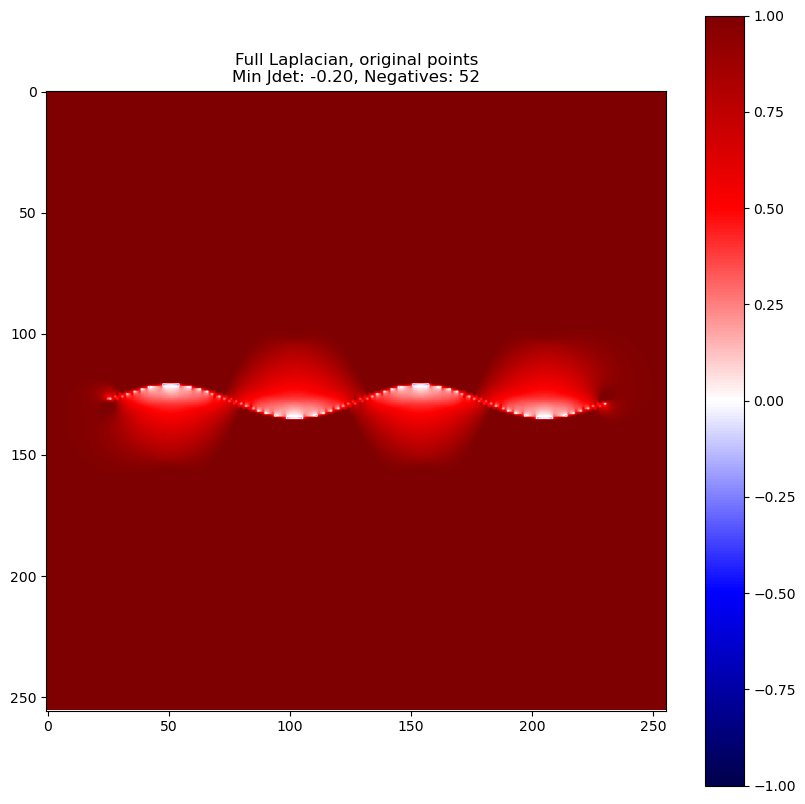

Plotted 206 point correspondences
Set 1 - X range: [75.0, 690.0], Y range: [360.0, 408.0]
Set 2 - X range: [75.0, 690.0], Y range: [360.0, 408.0]
Correspondence distances - Mean: 29.36, Std: 14.50, Max: 48.00


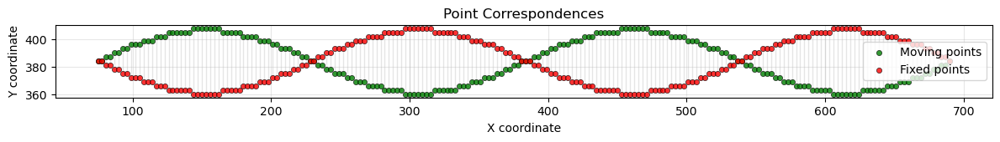

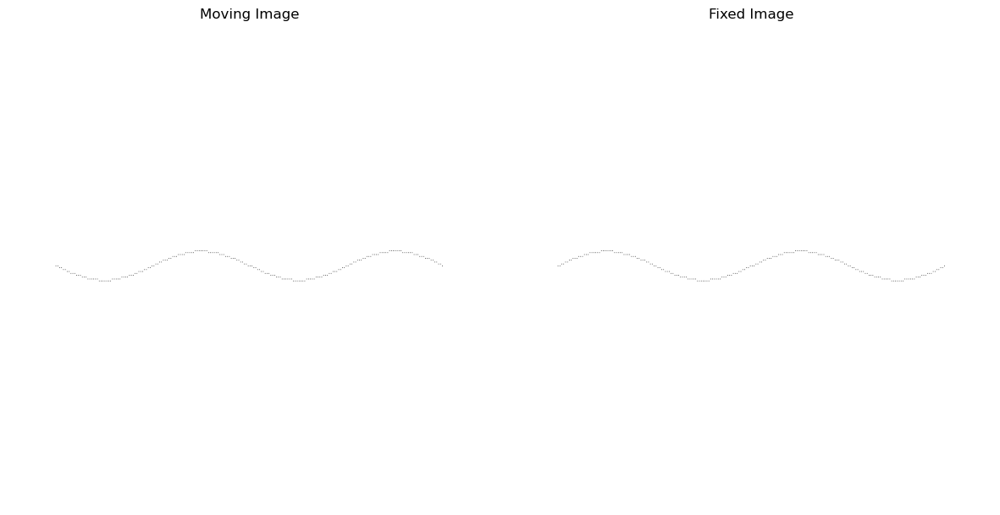

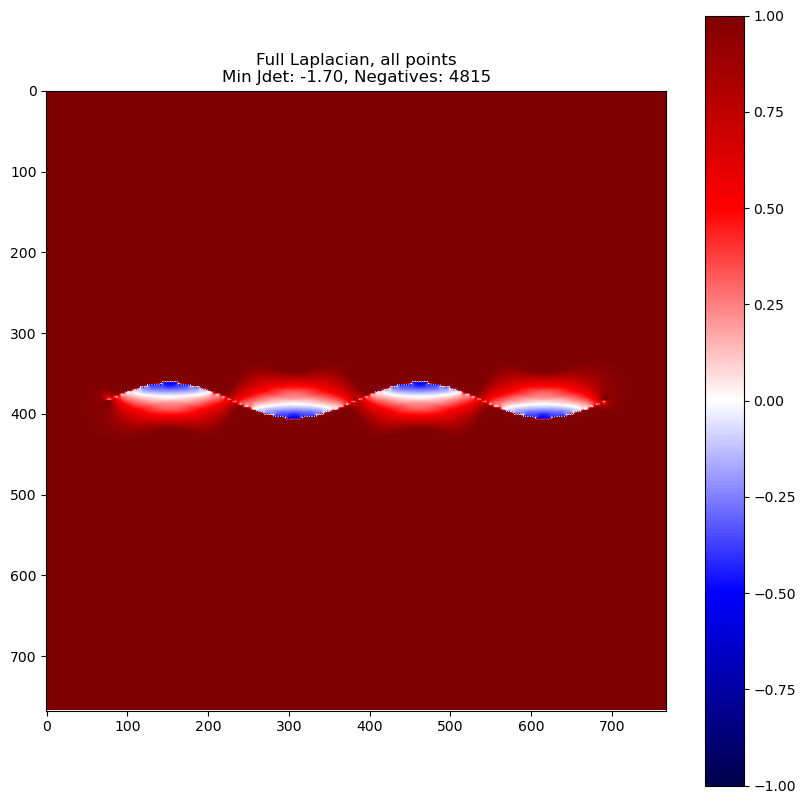

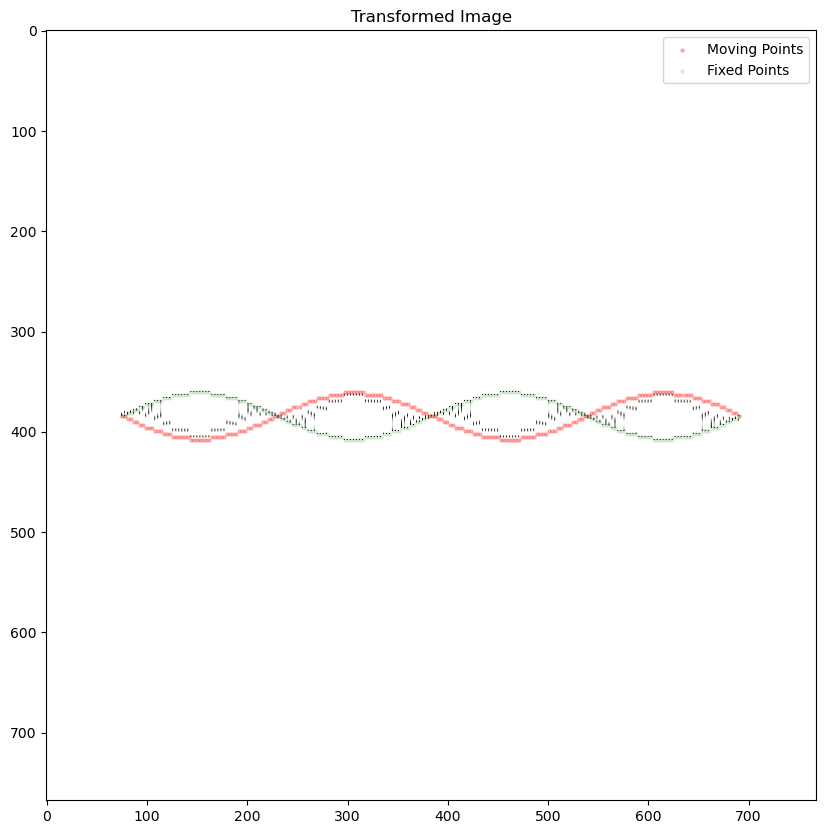

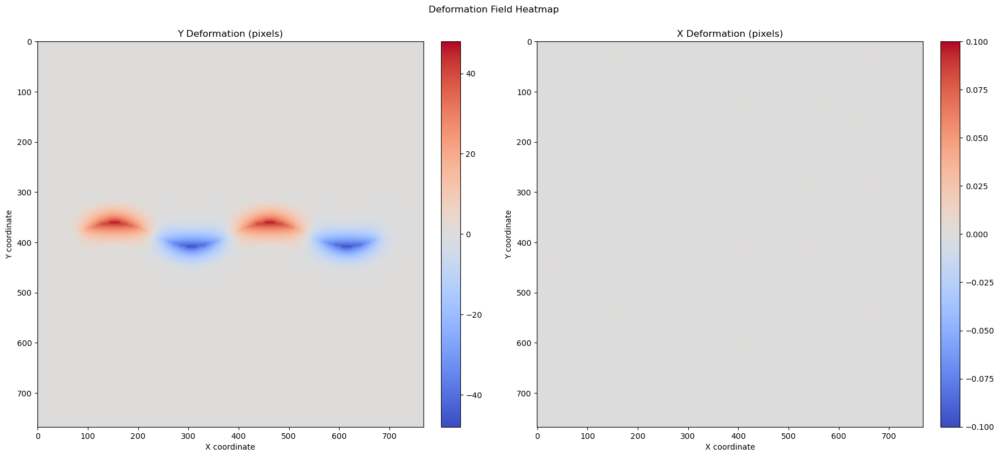

fdata.shape (1, 768, 768)
Time taken to create A:  0.13652276992797852
||Ax - b||: 4.63
Mean error at correspondences: 33.50464576697938


In [6]:
resolution = (256 * 3, 256 * 3)  # resolution for the data

#####################################################################################################
# SETUP 
#####################################################################################################

# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
original_mpoints, original_fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

# Scale the points up by a factor of 3 to fit a larger image resolution
mpoints = original_mpoints.copy() * 3
fpoints = original_fpoints.copy() * 3

# Swap columns to match expected format (x, y)
original_mpoints = original_mpoints[:, [1, 0]]  # Swap to (y, x) format
original_fpoints = original_fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
original_mpoints = np.pad(original_mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
original_fpoints = np.pad(original_fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

#original_mpoints = np.vstack([original_mpoints, np.array([0, 119, 206])])
#original_fpoints = np.vstack([original_fpoints, np.array([0, 134, 206])])

print(original_mpoints.shape, original_fpoints.shape)

d_original = Data(original_mpoints, original_fpoints, (256, 256))
d_original.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10),
       title=f"Full Laplacian, original points\nMin Jdet: {d_original.min():.2f}, Negatives: {d_original.count_negatives()}")

# Plot the correspondences between the two helical waves
data_utils.plot_point_correspondences(mpoints, fpoints,
                          labels=('Moving points', 'Fixed points'),
                          colors=('green', 'red'),
                          title='Point Correspondences',
                          show_indices=False,
                          line_alpha=0.2,  # More transparent lines to show the pattern better
                          point_size=20)

# Swap columns to match expected format (x, y)
mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Save to raw image
moving_img = data_utils.create_raw_image(mpoints, resolution, save_path="mpoints.png")
fixed_img = data_utils.create_raw_image(fpoints, resolution, save_path="fpoints.png")
data_utils.show_2_pngs(moving_img, fixed_img, title1="Moving Image", title2="Fixed Image")

#####################################################################################################
# Run Laplacian
#####################################################################################################

d = Data(mpoints, fpoints, resolution)  # Use larger resolution to fit the scaled points

d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10),
       title=f"Full Laplacian, all points\nMin Jdet: {d.min():.2f}, Negatives: {d.count_negatives()}")
transformed_img = reg_utils.apply_transformation_fixed(d, moving_img, mpoints=d.mpoints, fpoints=d.fpoints, title="Transformed Image")
reg_utils.deformation_heatmap(d, title="Deformation Field Heatmap")

_, _, _, total_err = reg_utils.compute_error_fixed(d.resolution, mpoints, fpoints, d.deformation)
print(f"||Ax - b||: {total_err:.2f}")
errors = reg_utils.correspondence_error(d.deformation, mpoints, fpoints)
print("Mean error at correspondences:", np.mean(errors))
#rint("Max error at correspondences:", np.max(errors))


In [43]:
d_original.mpoints[181]

array([  0, 120, 206])

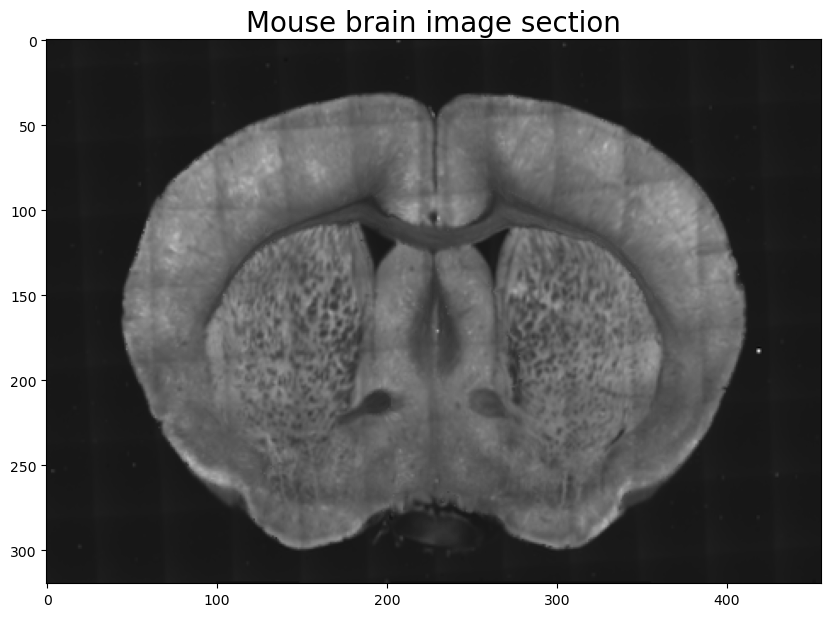

In [204]:
import nibabel as nib
mouse_brain_img = nib.load("data/corrected_correspondences_count_touching/registered_output/elastixRefined.nii.gz").get_fdata()
plt.figure(figsize=(10, 10))
plt.imshow(mouse_brain_img[200, :, :], cmap='gray')
plt.title("Mouse brain image section", fontsize=20)
plt.show()

## Grid interpolation

### Small test

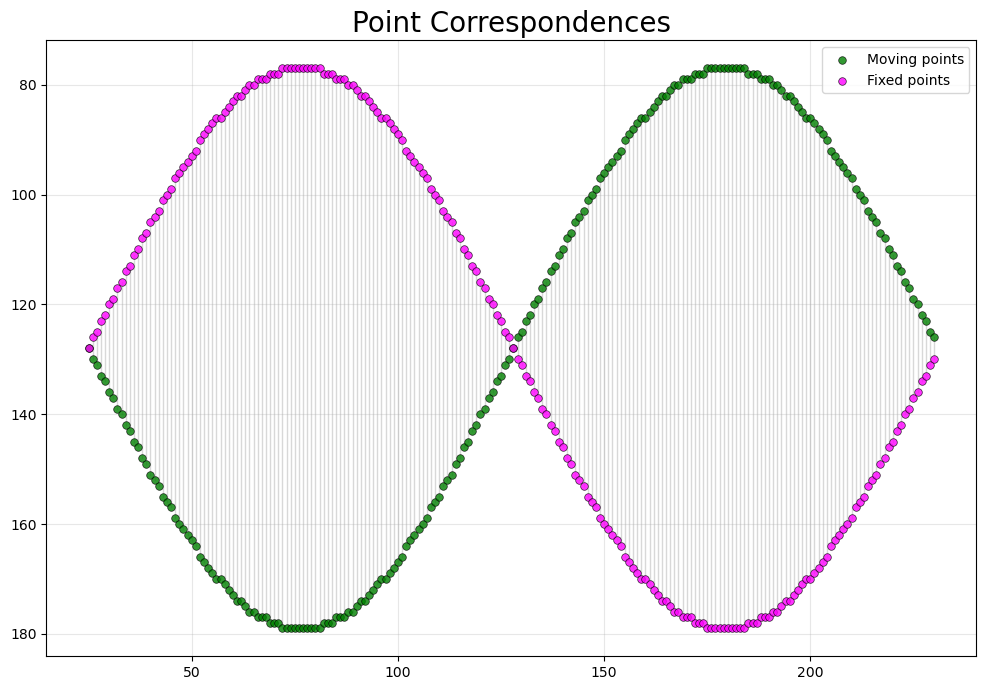

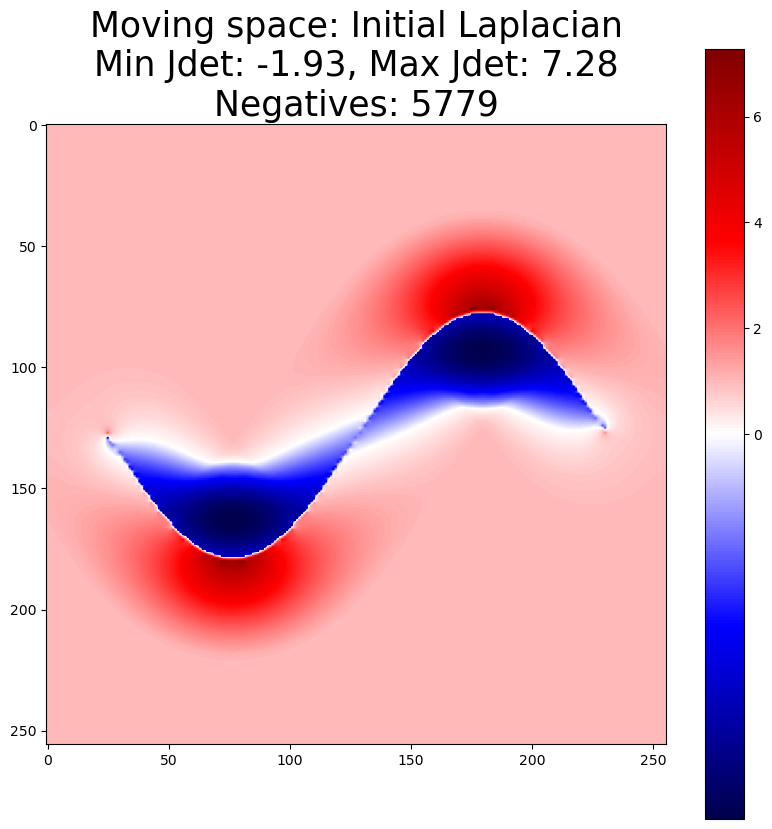

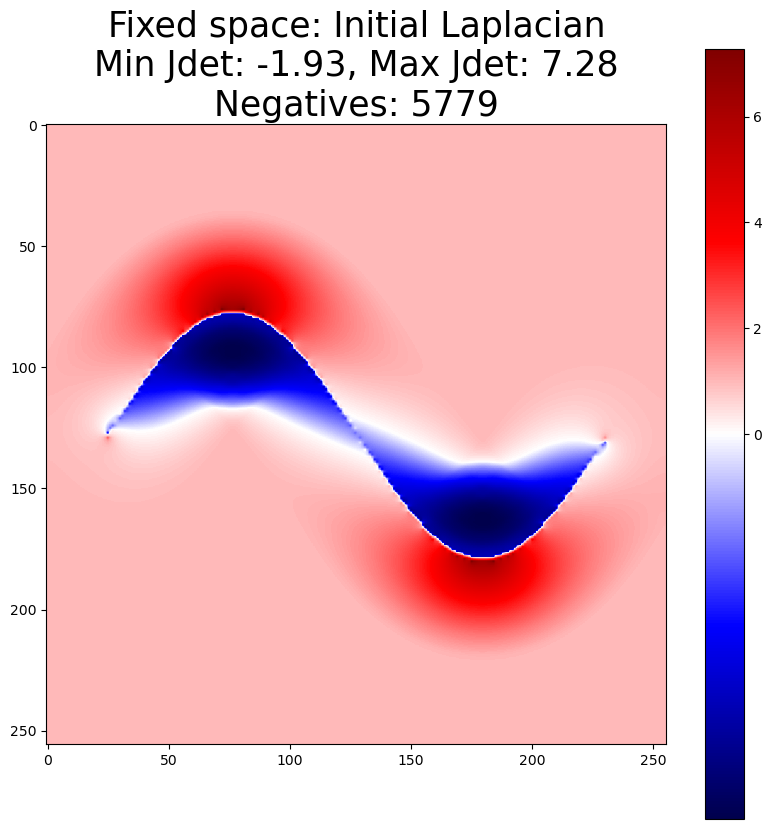

(65536, 2) (65536, 2)


'\n# Print the interpolated coordinates throughout the grid, including axis numbers\nprint("\nInterpolated coordinates throughout the grid:\ny - ↓, x ->")\n\n# Print column headers (x-axis)\nheader = ["\t"] + [f"  {x/scale:.2f}\t\t\t\t" for x in range(interp_coords.shape[2] - scale + 1)]\nprint("".join(header))\n\nfor y in range(interp_coords.shape[1] - scale + 1):\n    row = [f"{y/scale:.2f}|"]  # Row header (y-axis)\n    for x in range(interp_coords.shape[2] - scale + 1):\n        entry = f"\t({abs(interp_coords[0, y, x])/scale:.1f}, {interp_coords[1, y, x]/scale:.1f})"\n        if entry == "(nan, nan)\t":\n            entry = "    nan\t\t"\n        row.append(f"{entry}\t\t")\n    print("".join(row))\n    \nexport_interpolated_grid_to_csv(interp_coords, scale=scale, filename="interpolated_grid.csv")\n'

In [72]:
scale = 3
jdet_threshold = 1.3
sanity_check = 99999
resolution = (256, 256)

################################################################################################

# 20 x 20 case
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=1,
    amplitude_ratio=0.2,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)


"""
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=min(resolution),
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)
"""


interp_coords = interpolate_coordinates(fpoints, mpoints, grid_shape=resolution, scale=scale)

mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 


# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)


# Make moving and fixed points on the image boundaries
#boundary_points = boundary_points_on_grid(resolution)
#mpoints = np.vstack([mpoints, boundary_points])
#fpoints = np.vstack([fpoints, boundary_points])

_ = plot_point_correspondences(mpoints[:, [2, 1]], fpoints[:, [2, 1]], labels=('Moving points', 'Fixed points'), colors=('green', 'magenta'))

# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = Data_Moving(mpoints, fpoints, resolution)
d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Max Jdet: {np.max(d_moving.jdet_field):.2f}\nNegatives: {d_moving.count_negatives()}")
d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
         title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Max Jdet: {np.max(d_fixed.jdet_field):.2f}\nNegatives: {d_fixed.count_negatives()}")


"""
expanding_fcoord = get_expanding_coordinates(d_fixed.jdet_field, threshold=jdet_threshold, verbose=False)

# Remove points that occur in the fixed points set
expanding_fcoord = np.array([coord for coord in expanding_fcoord if tuple(coord) not in set(map(tuple, d_moving.fpoints[:, 1:]))])
expanding_mcoord = []
for i in range(len(expanding_fcoord)):
    mapped_point = get_mapped_point(expanding_fcoord[i], d_fixed.deformation)
    expanding_mcoord.append(mapped_point)
expanding_mcoord = np.array(expanding_mcoord)

# Append 0 to the first axis to format for Data class
expanding_mcoord = np.pad(expanding_mcoord, ((0, 0), (1, 0)), mode='constant', constant_values=0)
expanding_fcoord = np.pad(expanding_fcoord, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Round all expanding_mcoords to the nearest integer
expanding_mcoord = np.round(expanding_mcoord).astype(int)

#print("Mpoints -> Fpoints:")
#for i in range(len(mpoints)):
#    print(f"{mpoints[i]} -> {fpoints[i]}")

#print(f"Expanding coordinates in fixed space (Jdet > {jdet_threshold}): {expanding_fcoord.shape[0]} points")
#print("Expanding mpoints -> Expanding fpoints:")
#for i in range(len(expanding_fcoord)):
#    print(f"{expanding_mcoord[i]} -> {expanding_fcoord[i]}")
    
_ = plot_point_correspondences(mpoints[:, [2, 1]], fpoints[:, [2, 1]], 
                               expanding_mcoord[:, [2, 1]], expanding_fcoord[:, [2, 1]], 
                               labels=('Moving points', 'Fixed points', 'Expanding moving points', 'Expanding fixed points'), colors=('green', 'magenta', 'lime', 'hotpink'),)
"""
    

# Add the expanding points to the moving points
#mpoints = np.vstack([mpoints, expanding_mcoord])
#fpoints = np.vstack([fpoints, expanding_fcoord])

# Convert mpoints and fpoints to (y, x) format
impoints = mpoints[:, [2, 1]]  # Swap to (y, x) format
ifpoints = fpoints[:, [2, 1]]  # Swap to (y, x) format

#impoints = mpoints.copy()
#ifpoints = fpoints.copy()

ifpoints = []
impoints = []
for y in range(resolution[0]):
    for x in range(resolution[1]):
        #print(f"Current point: ({y}, {x})")
        curr_fpoint = (y, x)
        curr_mpoint = get_mapped_point(curr_fpoint, d_fixed.deformation)
        #print(f"Mapped point: {curr_mpoint}")
        ifpoints.append(curr_fpoint)
        impoints.append(curr_mpoint)
ifpoints = np.array(ifpoints)
impoints = np.array(impoints)

print(ifpoints.shape, impoints.shape)
interp_coords = interpolate_coordinates(ifpoints, impoints, grid_shape=resolution, scale=scale)

"""
# Print the interpolated coordinates throughout the grid, including axis numbers
print("\nInterpolated coordinates throughout the grid:\ny - ↓, x ->")

# Print column headers (x-axis)
header = ["\t"] + [f"  {x/scale:.2f}\t\t\t\t" for x in range(interp_coords.shape[2] - scale + 1)]
print("".join(header))

for y in range(interp_coords.shape[1] - scale + 1):
    row = [f"{y/scale:.2f}|"]  # Row header (y-axis)
    for x in range(interp_coords.shape[2] - scale + 1):
        entry = f"\t({abs(interp_coords[0, y, x])/scale:.1f}, {interp_coords[1, y, x]/scale:.1f})"
        if entry == "(nan, nan)\t":
            entry = "    nan\t\t"
        row.append(f"{entry}\t\t")
    print("".join(row))
    
export_interpolated_grid_to_csv(interp_coords, scale=scale, filename="interpolated_grid.csv")
"""

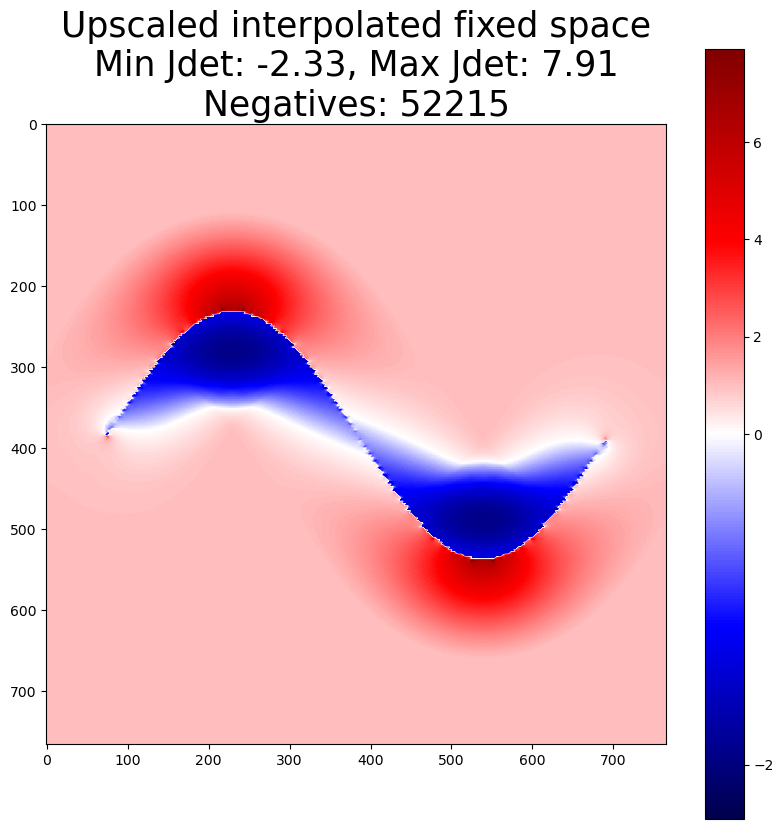

Upscaled fixed Jacobian determinant field shape: (766, 766)
Upscaled fixed deformation shape: (3, 1, 766, 766)


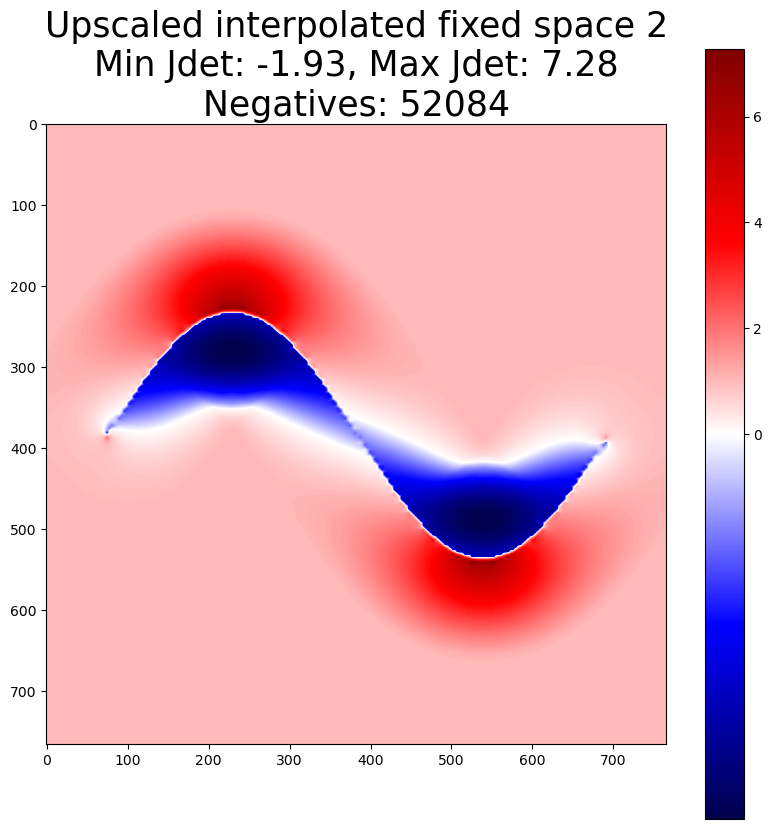

Found 83622 expanding Jacobian determinants with threshold 1.3.
Max jdet attempted to replace: 1.8898173146942217


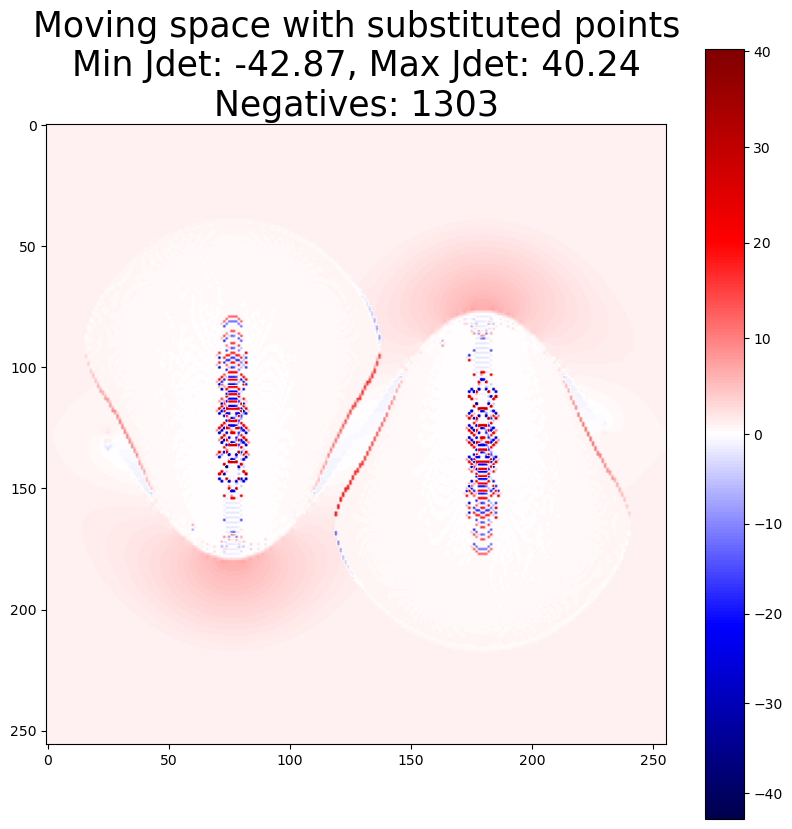

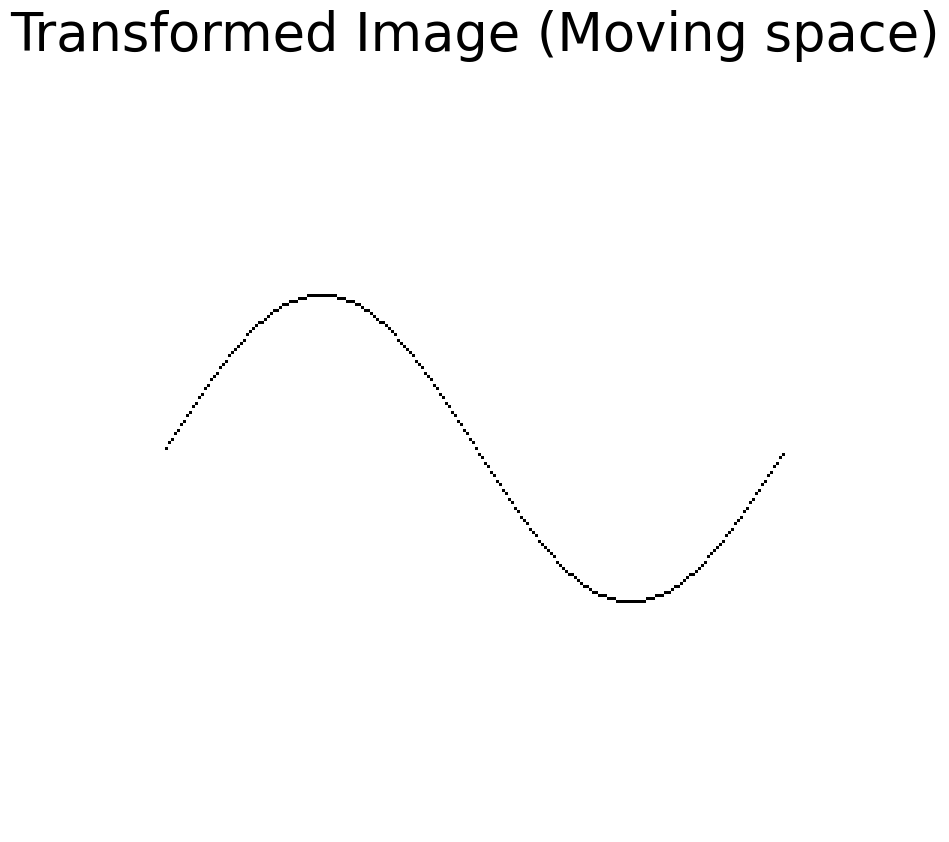

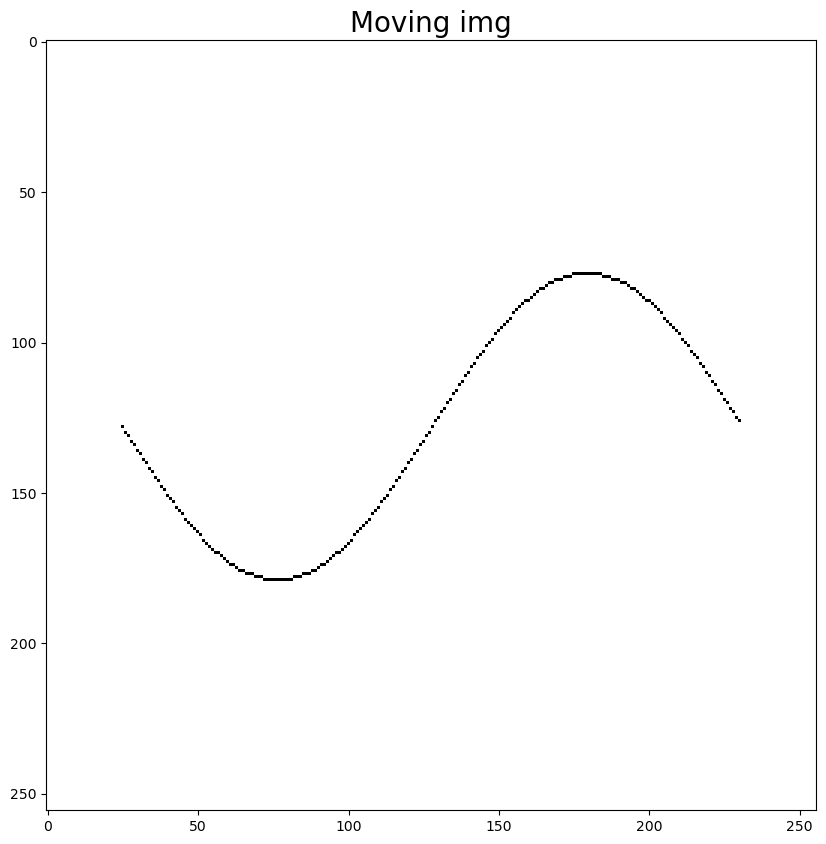

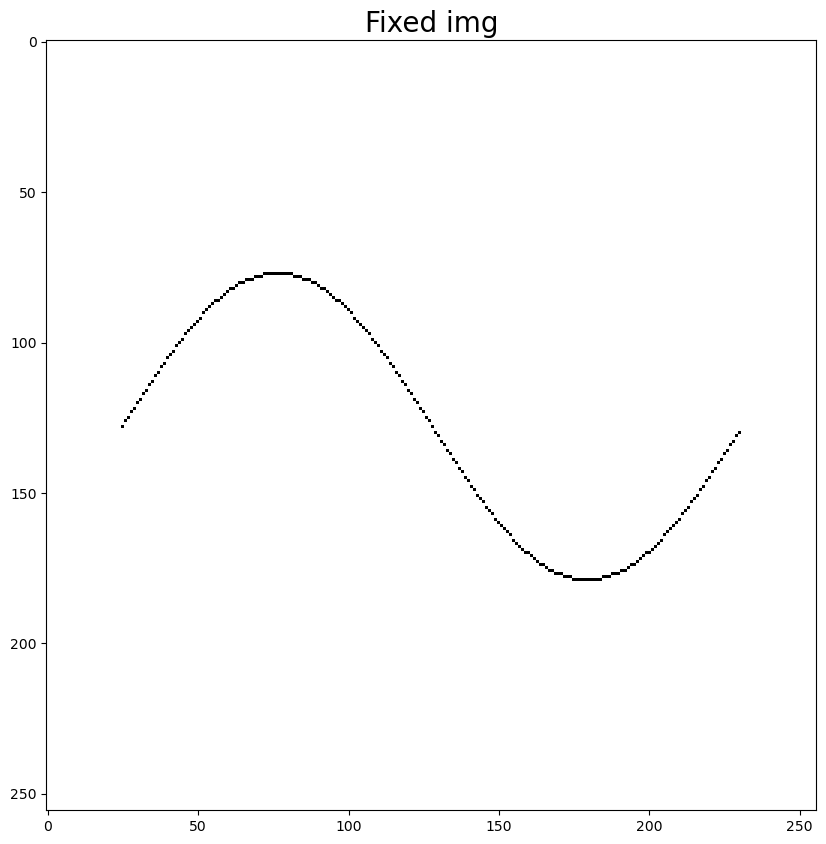

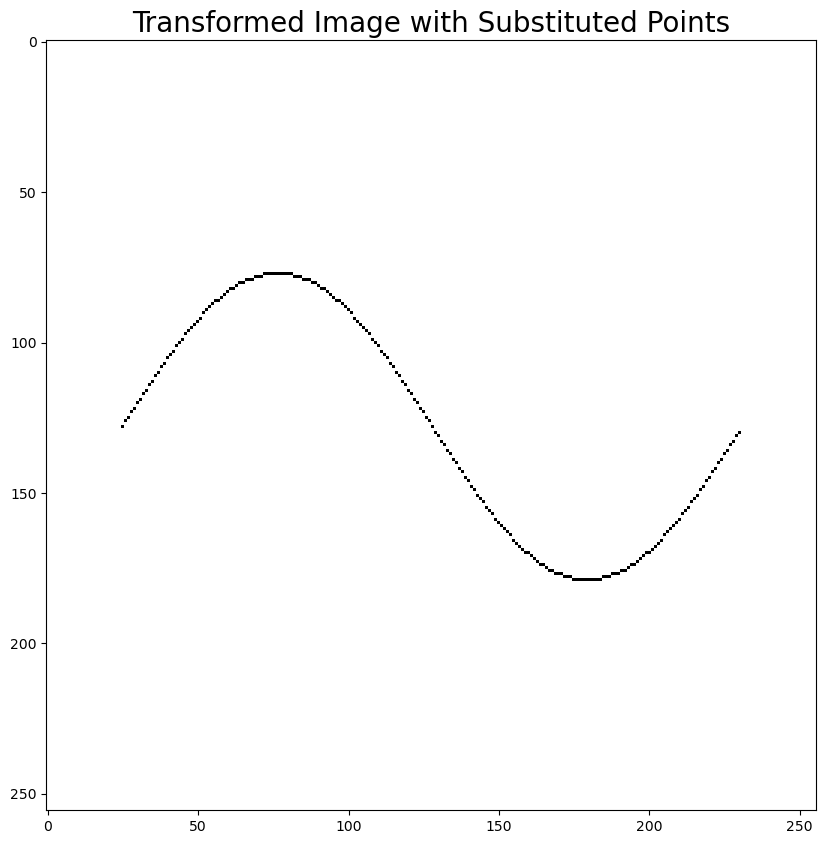

In [73]:
d_upscaled = Data(mpoints, fpoints, (resolution[0] * scale - scale + 1, resolution[1] * scale - scale + 1))  # Use larger resolution to fit the scaled points

# Create displacements to check for Jacobian
interp_displacements = np.zeros((3, 1, resolution[0] * scale - scale + 1, resolution[1] * scale - scale + 1), dtype=np.float32)
for y in range(resolution[0] * scale - scale + 1):
    for x in range(resolution[1] * scale - scale + 1):
        # Moving - fixed
        curr_mpoint = interp_coords[:, y, x]
        interp_displacements[1:, 0, y, x] =  (curr_mpoint - np.array([y, x]))
        
d_upscaled.mpoints = d_upscaled.mpoints.copy() * 3
d_upscaled.fpoints = d_upscaled.fpoints.copy() * 3
d_upscaled.deformation = interp_displacements
d_upscaled.jdet_field = jacobian.sitk_jacobian_determinant(d_upscaled.deformation)[0]
d_upscaled.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Upscaled interpolated fixed space\nMin Jdet: {d_upscaled.min():.2f}, Max Jdet: {np.max(d_upscaled.jdet_field):.2f}\nNegatives: {d_upscaled.count_negatives()}")




upscaled_fixed = upscale_grid_with_priors(d_fixed.jdet_field, scale=3)
print("Upscaled fixed Jacobian determinant field shape:", upscaled_fixed.shape)
print("Upscaled fixed deformation shape:", d_upscaled.deformation.shape)
#norm = mcolors.TwoSlopeNorm(vmin=min(upscaled_fixed.min(), -1), vcenter=0, vmax=upscaled_fixed.max())
#plt.figure(figsize=(10, 10))
#plt.imshow(upscaled_fixed, cmap='seismic')
#plt.title("Upscaled Jacobian Determinant Field", fontsize=20)
#plt.colorbar()
#plt.show()
d_upscaled.jdet_field = upscaled_fixed
d_upscaled.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Upscaled interpolated fixed space 2\nMin Jdet: {d_upscaled.min():.2f}, Max Jdet: {np.max(d_upscaled.jdet_field):.2f}\nNegatives: {d_upscaled.count_negatives()}")


upscaled_jdet = d_upscaled.jdet_field.copy()

# Get coordinates with Jdet > jdet_thresh
upscaled_fpts = get_expanding_coordinates(upscaled_jdet, threshold=jdet_thresh, verbose=False)
upscaled_mpts = np.array([get_mapped_point(pt, d_upscaled.deformation) for pt in upscaled_fpts if pt[0] < upscaled_jdet.shape[0] and pt[1] < upscaled_jdet.shape[1]])

# Print out the upscaled points
#print(f"Upscaled points with Jdet > {jdet_thresh}: {len(upscaled_fpts)} points")
#for i in range(len(upscaled_fpts)):
#    print(f"{np.round(upscaled_mpts[i] / scale).astype(int)} -> {upscaled_fpts[i]/3}")
    
d_sub = deepcopy(d_moving)


#d_sub.jdet_field = np.zeros((resolution[0] * scale - scale + 1, resolution[1] * scale - scale + 1), dtype=np.float32)
max_jdet = -np.inf
#max_px = None
#max_idx = None

for i in range(len(upscaled_mpts)):
    pt = upscaled_fpts[i]
    curr_mpt = np.round(upscaled_mpts[i] / scale).astype(int)
    curr_fpt = upscaled_fpts[i] / scale
    new_displacement = curr_fpt - curr_mpt
    # Append 0 to the first element to match the expected format
    new_displacement = np.pad(new_displacement, (1, 0), mode='constant', constant_values=0)
    
    # Only replace if the point is not in the moving points and if the Jacobian determinant is below the sanity check threshold
    if not tuple(curr_mpt) in set(map(tuple, d_sub.mpoints[:, 1:])) and d_sub.jdet_field[curr_mpt[0], curr_mpt[1]] < sanity_check:
        d_sub.deformation[:, 0, curr_mpt[0], curr_mpt[1]] = new_displacement
        if max_jdet < d_moving.jdet_field[curr_mpt[0], curr_mpt[1]]:
            max_jdet = d_moving.jdet_field[curr_mpt[0], curr_mpt[1]]
        #z    max_px = upscaled_mpts[i]
        #    max_idx = i
    #if not tuple(curr_mpt) in set(map(tuple, d_sub.mpoints[:, 1:])) and d_sub.jdet_field[curr_mpt[0], curr_mpt[1]] > 1:
    #    d_sub.jdet_field[curr_mpt[0], curr_mpt[1]] = 999
    #else:
    #    d_sub.jdet_field[curr_mpt[0], curr_mpt[1]] = 0
        
# If anything is not 999, set it to 0
#d_sub.jdet_field[d_sub.jdet_field != 999] = 0
print("Max jdet attempted to replace:", max_jdet)
#print("Max px attempted to replace:", max_px)
#print("Max index attempted to replace:", max_idx)
#print("Max index attempted to replace:", upscaled_fpts[max_idx] / 3)
#print("Jdet at max index in fixed space:", upscaled_jdet[max_px[0], max_px[1]])
#print("Jdet at max index in fixed space:", d_fixed.jdet_field[16, 7])
#print("Jdet at max index in fixed space:", upscaled_jdet[16*3, 7*3])


d_sub.jdet_field = jacobian.sitk_jacobian_determinant(d_sub.deformation)[0]
d_sub.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
           title=f"Moving space with substituted points\nMin Jdet: {d_sub.min():.2f}, Max Jdet: {np.max(d_sub.jdet_field):.2f}\nNegatives: {d_sub.count_negatives()}")


# Save to raw image
moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_fixed.fpoints, resolution, save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_sub, moving_img, title="Transformed Image (Moving space)")

# Make all values in boundary of transformed_img white
transformed_img[0, :] = 1  # Top boundary
transformed_img[-1, :] = 1  # Bottom boundary
transformed_img[:, 0] = 1  # Left boundary
transformed_img[:, -1] = 1  # Right boundary

moving_img[0, :] = 1  # Top boundary
moving_img[-1, :] = 1  # Bottom boundary
moving_img[:, 0] = 1  # Left boundary
moving_img[:, -1] = 1  # Right boundary

fixed_img[0, :] = 1  # Top boundary
fixed_img[-1, :] = 1  # Bottom boundary
fixed_img[:, 0] = 1  # Left boundary
fixed_img[:, -1] = 1  # Right boundary

plt.figure(figsize=(10, 10))
plt.imshow(moving_img, cmap='gray')
plt.title("Moving img", fontsize=20)
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(fixed_img, cmap='gray')
plt.title("Fixed img", fontsize=20)
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(transformed_img, cmap='gray')
plt.title("Transformed Image with Substituted Points", fontsize=20)
plt.show()


In [ ]:
from cluster_modules.grid import upscale_grid_values

upscaled_fixed = upscale_grid_with_priors(d_fixed.jdet_field, scale=3)
print(upscaled_fixed.shape)
norm = mcolors.TwoSlopeNorm(vmin=min(upscaled_fixed.min(), -1), vcenter=0, vmax=upscaled_fixed.max())
plt.figure(figsize=(10, 10))
plt.imshow(upscaled_fixed, cmap='seismic')
plt.title("Upscaled Jacobian Determinant Field", fontsize=20)
plt.colorbar()
plt.show()


In [90]:
idx = 120
print(f"Mpoint:", mpoints[idx])
print(f"Fpoint:", fpoints[idx])
print(f"Current deformation:", d_moving.deformation[:, 0, mpoints[idx][1], mpoints[idx][2]])
print(f"Interpolated deformation m:", d_new.deformation[:, 0, mpoints[idx][1], mpoints[idx][2]])
print(f"Interpolated deformation f:", d_new.deformation[:, 0, fpoints[idx][1], fpoints[idx][2]])

Y, X = 256, 256
grid_y, grid_x = np.meshgrid(np.arange(Y), np.arange(X), indexing='ij')
grid_coords = np.stack([grid_y.ravel(), grid_x.ravel()], axis=-1)

interpolated_coords = np.zeros((Y * X, 2), dtype=np.float32)
for i in range(2):
    interp = griddata(
        moving_points, fixed_points[:, i],
        grid_coords, method='linear', fill_value=np.nan
    )
    print(np.max(interp))

Mpoint: [  0 135 145]
Fpoint: [  0 121 145]
Current deformation: [  0.         -13.99686617   0.        ]
Interpolated deformation m: [0. 0. 0.]
Interpolated deformation f: [0. 0. 0.]
nan
nan



=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
16.0


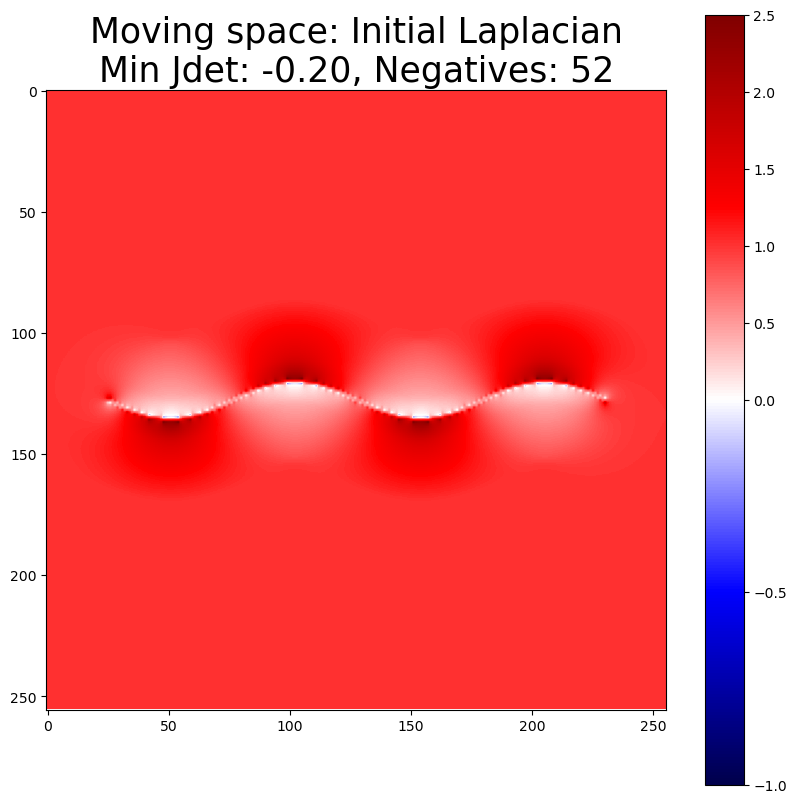

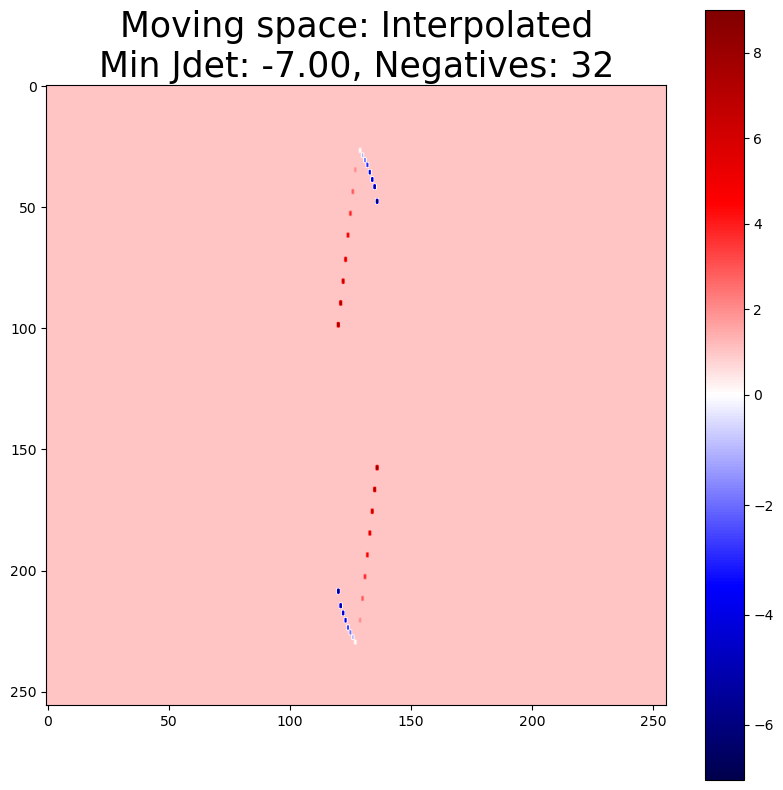

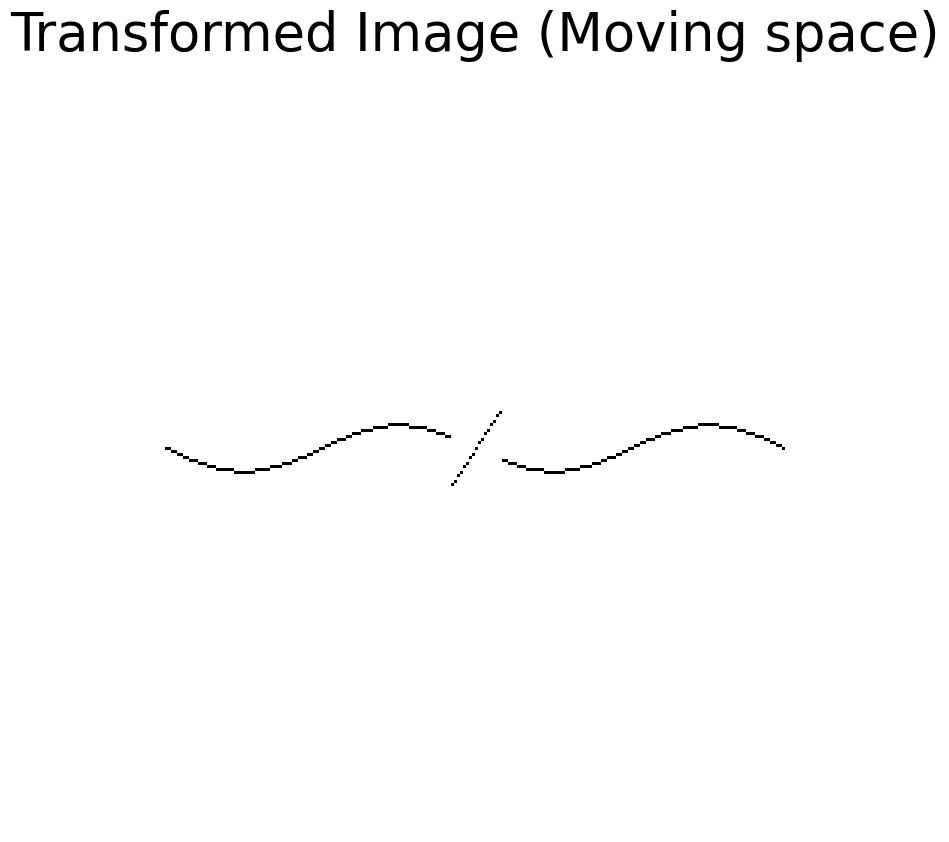

In [91]:
resolution = (256, 256)  # resolution for the data

# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

dfield = interpolate_displacements(mpoints, fpoints, grid_shape=resolution)
print(np.max(dfield))

mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = Data_Moving(mpoints, fpoints, resolution)
d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_new = deepcopy(d_moving)  # Create a new Data_Moving object to avoid modifying the original
d_new.deformation = dfield  # Assign the interpolated deformation field to the Data_Moving object
d_new.jdet_field = jacobian.sitk_jacobian_determinant(d_new.deformation)[0]
d_new.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Interpolated\nMin Jdet: {d_new.min():.2f}, Negatives: {d_new.count_negatives()}")


moving_img = data_utils.create_raw_image(d_moving.mpoints, resolution, save_path="wave1.png")
fixed_img = data_utils.create_raw_image(d_moving.fpoints, resolution, save_path="wave2.png")
transformed_img = reg_utils.apply_transformation(d_new, moving_img, title="Transformed Image (Moving space)")

## Alternative method

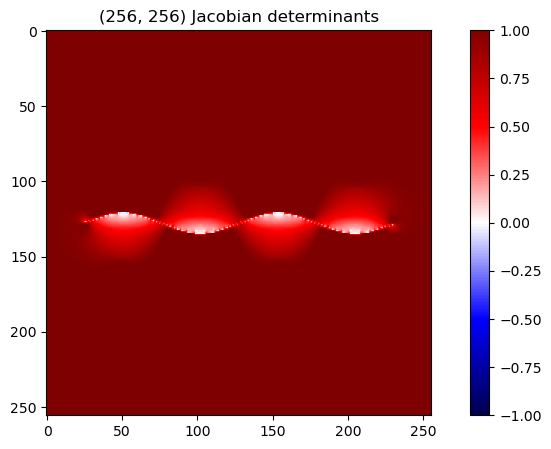

Min Jdet: -0.21, Negatives: 38


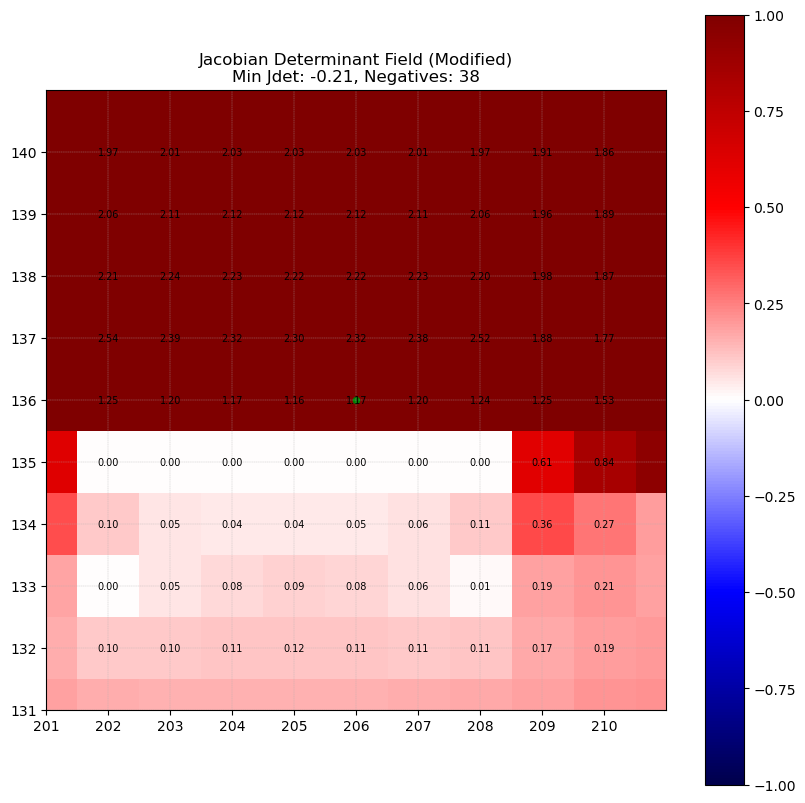

In [282]:
import numpy as np

def get_adjacent_coords(y, x, shape, connectivity=4):
    """Return list of valid adjacent (y, x) coordinates."""
    neighbors = []
    for dy in [-1, 0, 1]:
        for dx in [-1, 0, 1]:
            if dy == 0 and dx == 0:
                continue
            if connectivity == 4 and abs(dy) + abs(dx) != 1:
                continue
            ny, nx = y + dy, x + dx
            if 0 <= ny < shape[0] and 0 <= nx < shape[1]:
                neighbors.append((0, ny, nx))
    return neighbors

def get_adjacent_coords(y, x, shape):
    """
    Return a list of valid adjacent (y, x) coordinates: only above and below.
    """
    neighbors = []
    if y - 1 >= 0:
        neighbors.append((0, y - 1, x))
    if y + 1 < shape[0]:
        neighbors.append((0, y + 1, x))
    return neighbors

# 1. Get negative Jacobian coordinates in original resolution
neg_jac_coords = np.argwhere(d_original.jdet_field < 0)

# 2. Get set of fixed points (as (y, x) tuples)
fixed_coords = set(tuple(pt[1:]) for pt in d_original.fpoints.astype(int))

# 3. For each negative Jdet pixel, add correspondences for all adjacent pixels (not fixed points)
new_mpoints = []
new_fpoints = []
for y, x in neg_jac_coords:
    for nz, ny, nx in get_adjacent_coords(y, x, d_original.jdet_field.shape):
        if (nz, ny, nx) in fixed_coords:
            continue
        # Build new correspondence: moving = (0, ny, nx), fixed = (0, ny + disp_y, nx + disp_x)
        disp = d_original.deformation[:, nz, ny, nx]
        fpt = np.array([nz, ny, nx])
        mpt = np.array([nz, int(round(ny + disp[1])), int(round(nx + disp[2]))])
        new_mpoints.append(mpt)
        new_fpoints.append(fpt)

if new_mpoints:
    new_mpoints = np.vstack(new_mpoints)
    new_fpoints = np.vstack(new_fpoints)
    # Optionally, remove duplicates
    _, idx = np.unique(new_mpoints, axis=0, return_index=True)
    new_mpoints = new_mpoints[idx]
    new_fpoints = new_fpoints[idx]
    # Concatenate with original correspondences
    all_mpoints = np.vstack([d_original.mpoints, new_mpoints])
    all_fpoints = np.vstack([d_original.fpoints, new_fpoints])
else:
    all_mpoints = d_original.mpoints
    all_fpoints = d_original.fpoints

# 4. Recompute the deformation field
d_refined = Data(all_mpoints, all_fpoints, d_original.resolution)
d_refined.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)
print(f"Min Jdet: {d_refined.min():.2f}, Negatives: {d_refined.count_negatives()}")
#print(new_mpoints)
#print(new_fpoints)

jacobian_plot(d_refined, pt=correspondence_pt, figsize=(10, 10), title="Jacobian Determinant Field (Modified)\nMin Jdet: {:.2f}, Negatives: {}".format(d_refined.min(), d_refined.count_negatives()),
              xlim=(correspondence_pt[1] - 5, correspondence_pt[1] + 5), 
              ylim=(correspondence_pt[0] - 5, correspondence_pt[0] + 5), 
              binarize_negatives=True)

In [ ]:
from modules.upscaling import assign_unique_correspondences

# Example usage:
# fixed_coords: (N, 2) array of (y, x)
# displacements: (N, 2) array of (dy, dx)
# moving_coords: (M, 2) array of (y, x)
# assignment = assign_unique_correspondences(fixed_coords, displacements, moving_coords)
# Now, fixed_coords[i] is assigned to moving_coords[assignment[i]]

In [50]:
col_x = 206
H, W = d_original.jdet_field.shape

# 1. Fixed pixel coordinates in column
fixed_coords = np.array([[y, col_x] for y in range(H)])

# 2. Displacements for each pixel in the column
displacements = np.stack([
    d_original.deformation[1, 0, :, col_x],  # dy
    d_original.deformation[2, 0, :, col_x],  # dx
], axis=1)

# 3. Moving points (all possible y in column)
moving_coords = np.array([[y, col_x] for y in range(H)])

# 4. Assign unique correspondences
assignment = assign_unique_correspondences(fixed_coords, displacements, moving_coords)

# Now, fixed_coords[i] is assigned to moving_coords[assignment[i]]

In [ ]:

dvf_up = upscale_dvf_preserve(d_original.deformation, scale=3)

In [53]:
print(dvf_up[:, 0, 120 * 3 + 2, 206 * 3])
print(d_original.deformation[:, 0, 120, 206])

[ 0.         15.61722904  0.        ]
[ 0.         15.99641848  0.        ]


In [ ]:
from modules.jacobian import compute_jacobian_det
from modules.upscaling import generate_additional_correspondences_from_upscaled_dvf

In [55]:
# dvf: (3, 1, H, W) original deformation field
dvf_up = upscale_dvf_preserve(d_original.deformation, scale=3)
jacobian_up = jacobian.sitk_jacobian_determinant(dvf_up)[0]

# If you already have assigned fixed coordinates and moving points
assigned_fixed_set = set(map(tuple, d_original.fpoints[:, 1:].astype(int)))  # (y, x)
existing_moving_pts = d_original.mpoints  # shape (N, 3)

new_pairs = generate_additional_correspondences_from_upscaled_dvf(
    dvf_up, jacobian_up, scale=3,
    assigned_fixed_points=assigned_fixed_set,
    existing_moving_pts=existing_moving_pts,
    y_only=True,
    jacobian_thresh=1.2
)


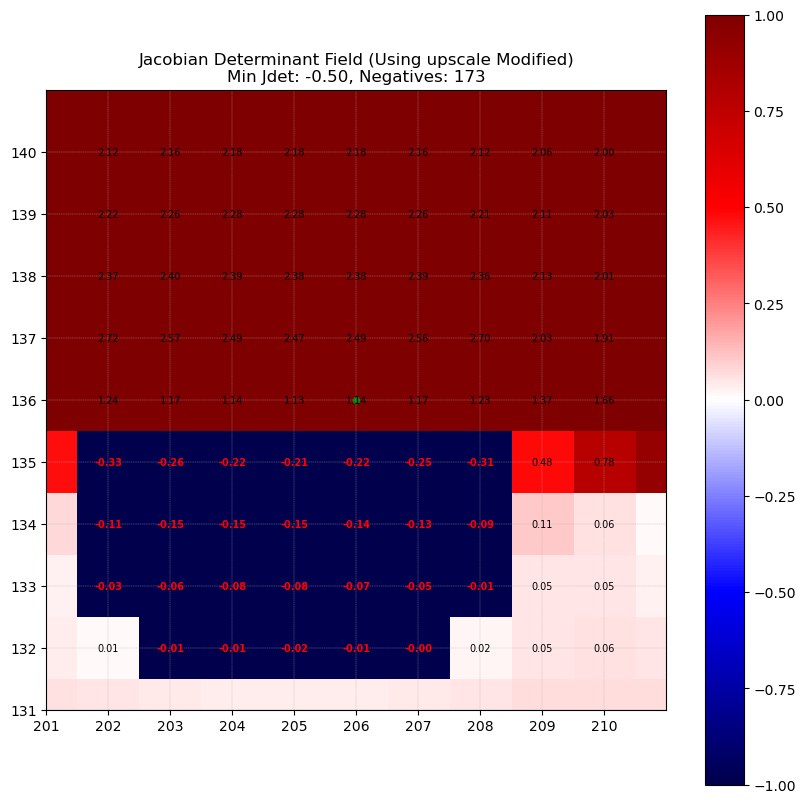

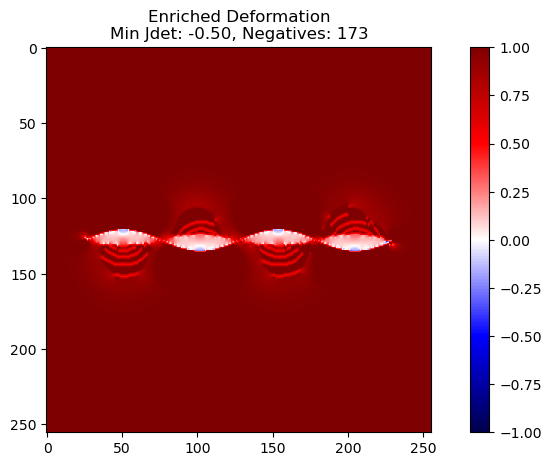

In [57]:
# Assume d_copy is your Data object with original correspondences
# and new_pairs is a list of (moving_coord, fixed_coord) tuples, where each coord is (y, x)

from copy import deepcopy
import numpy as np

# 1. Convert new_pairs to arrays with shape (N, 3) (add z=0 for 2D)
if len(new_pairs) > 0:
    new_mpoints = np.array([[0, y, x] for (y, x), _ in new_pairs])
    new_fpoints = np.array([[0, fy, fx] for _, (fy, fx) in new_pairs])

    # 2. Concatenate with d_copy's existing points
    all_mpoints = np.vstack([d_original.mpoints, new_mpoints])
    all_fpoints = np.vstack([d_original.fpoints, new_fpoints])

    # 3. Create a new Data object with the enriched correspondences
    d_copy = Data(all_mpoints, all_fpoints, d_original.resolution)
    
    
    jacobian_plot(d_copy, pt=correspondence_pt, figsize=(10, 10), title="Jacobian Determinant Field (Using upscale Modified)\nMin Jdet: {:.2f}, Negatives: {}".format(d_copy.min(), d_copy.count_negatives()),
              xlim=(correspondence_pt[1] - 5, correspondence_pt[1] + 5), 
              ylim=(correspondence_pt[0] - 5, correspondence_pt[0] + 5), 
              binarize_negatives=True)
    d_copy.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False,
                        title=f"Enriched Deformation\nMin Jdet: {d_copy.min():.2f}, Negatives: {d_copy.count_negatives()}")
else:
    print("No new pairs to add.")

# Now d_copy includes the new

# Test substitution


=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10


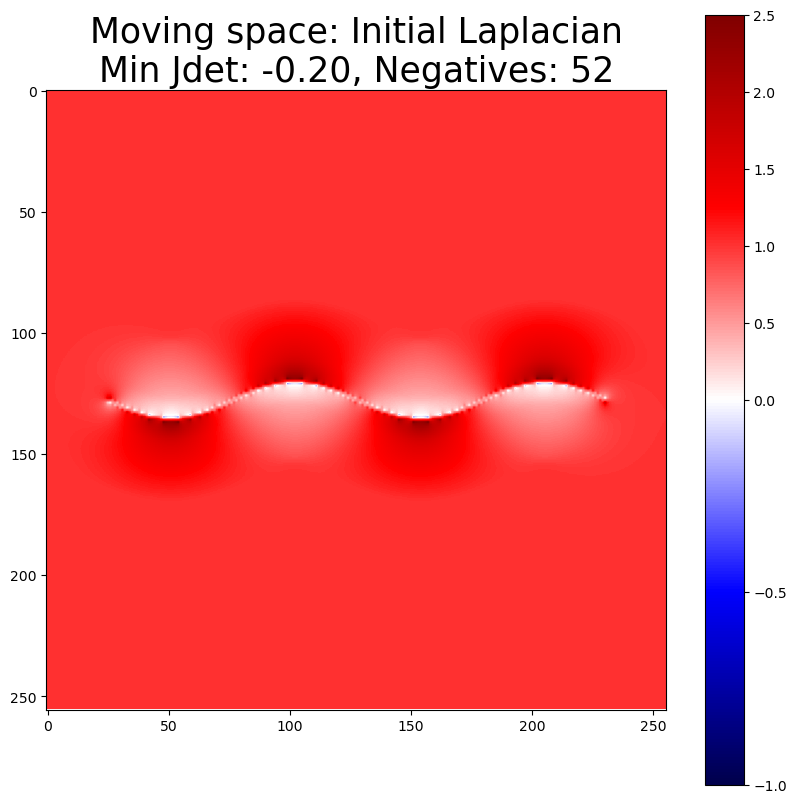

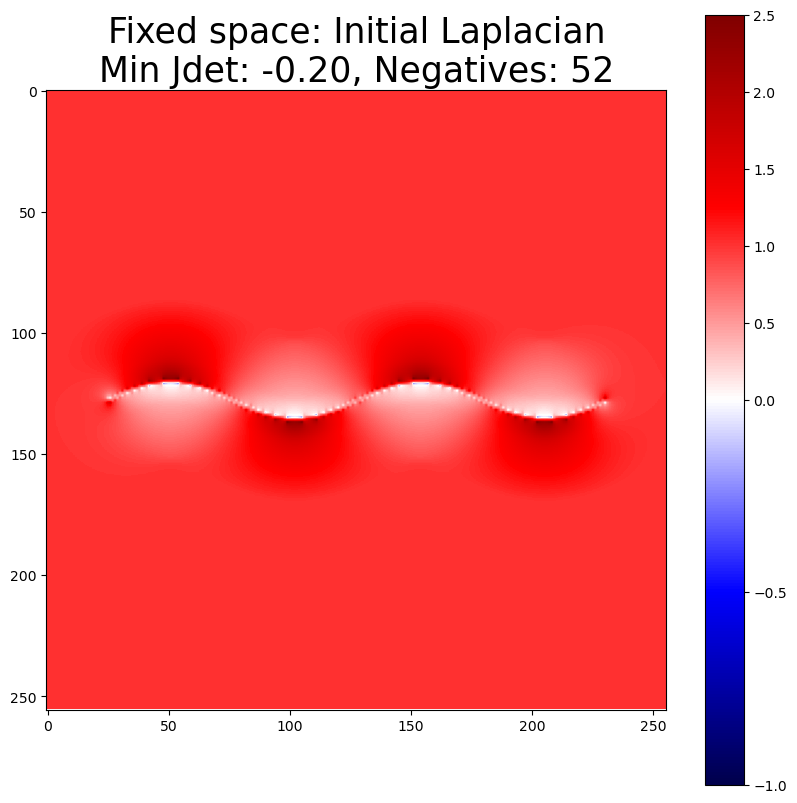

Found 96 expanding Jacobian determinants with threshold 2.0.



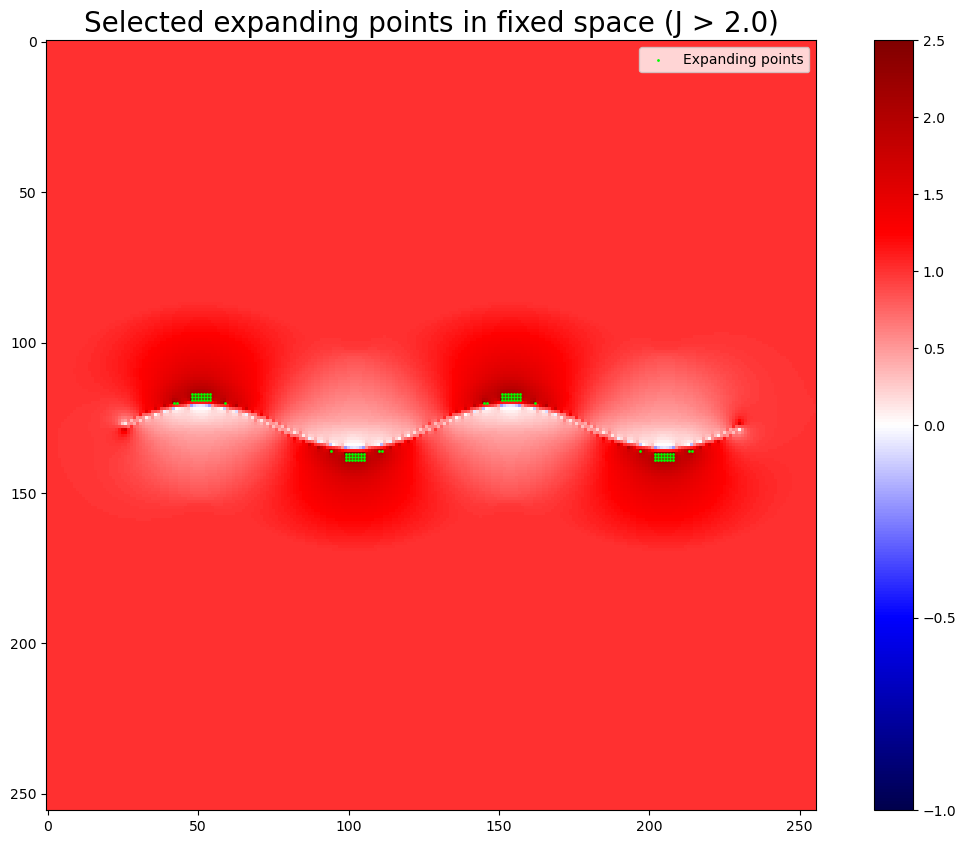

New moving points shape: (96, 3)
New fixed points shape: (96, 3)
Cleaned new moving points shape: (96, 3)
Cleaned new fixed points shape: (96, 3)
Cleaned new fixed points shape: (96, 3)
Cleaned new moving points shape: (96, 3)


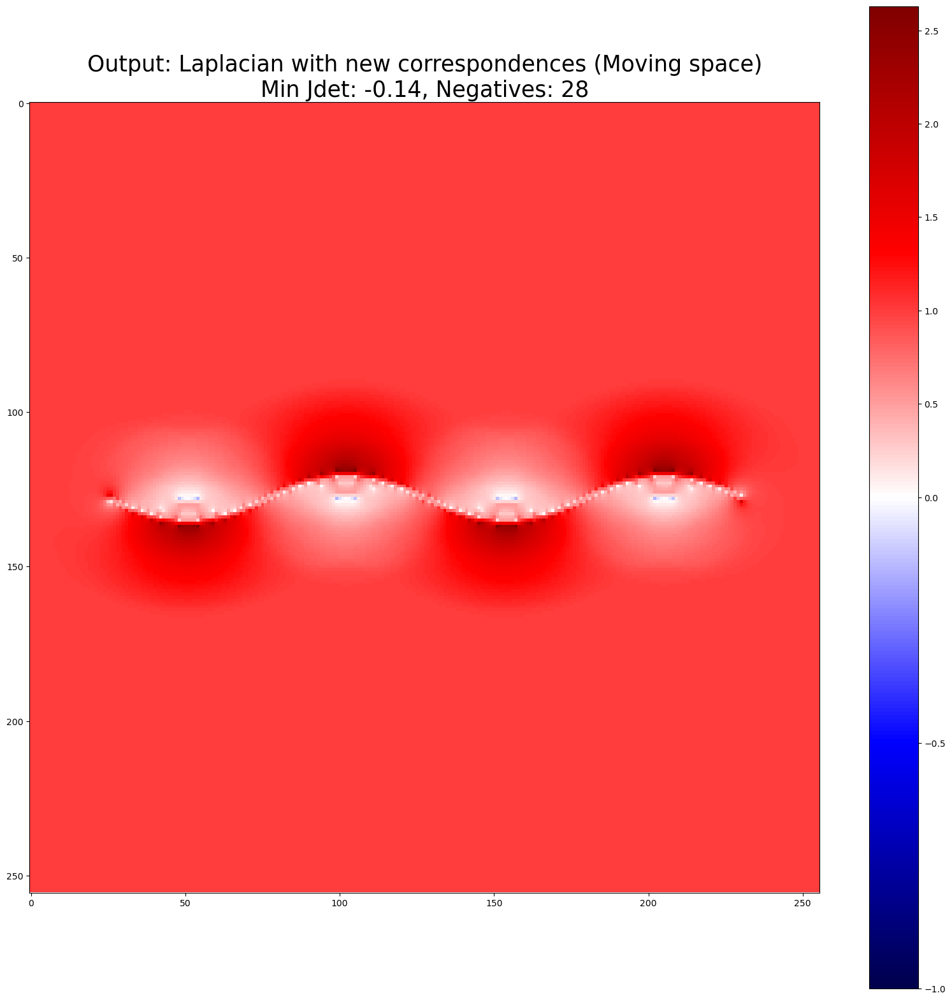

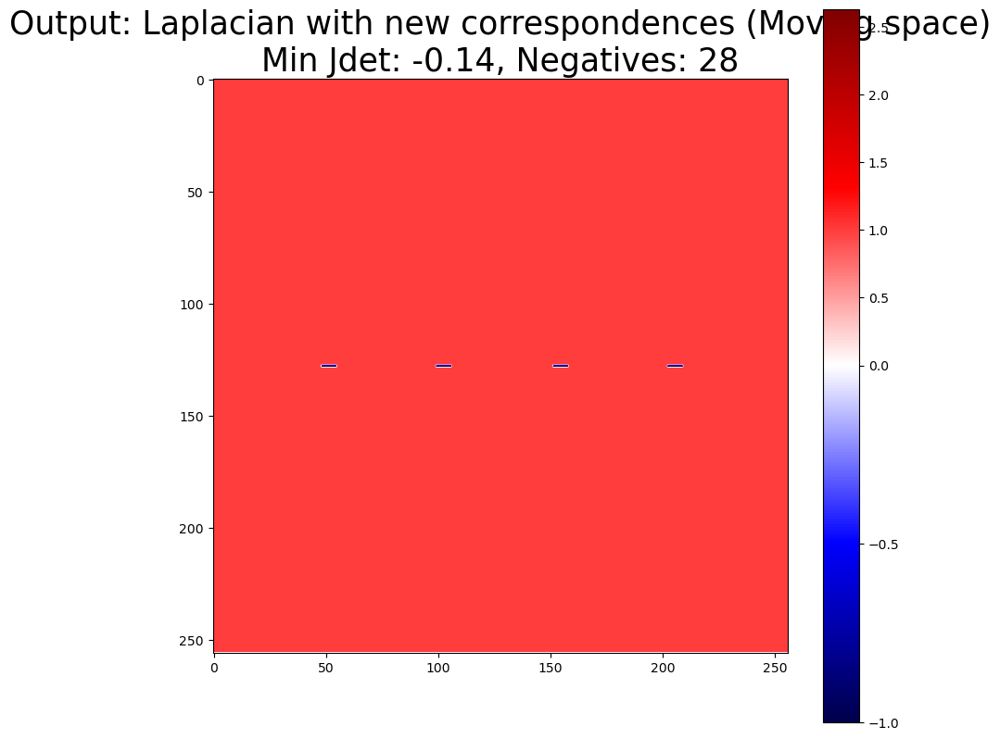

C:\Users\Andy\AppData\Local\Temp\ipykernel_9752\1100470945.py:209: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


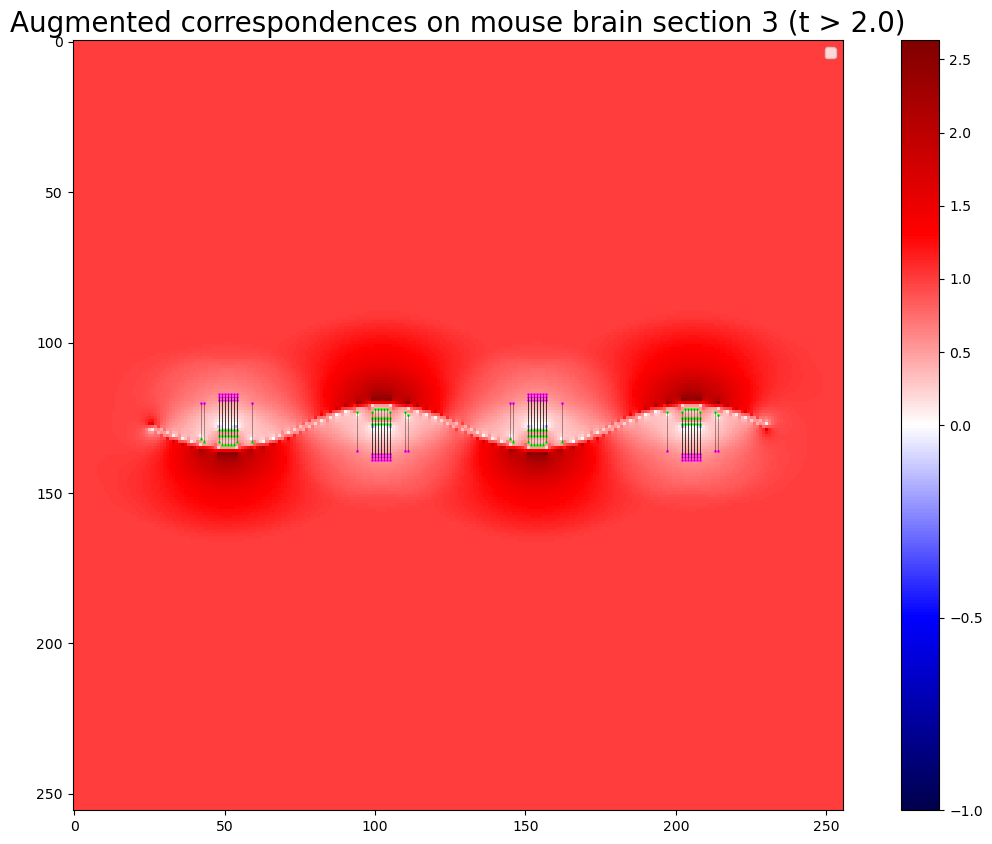

Old displacement at (129, 48): (8.229575271139424, 0.0)
New displacement at (129, 48): (-12.0, 0.0)
Old displacement at (129, 49): (8.28161978926392, 0.0)
New displacement at (129, 49): (-12.0, 0.0)
Old displacement at (129, 50): (8.310521575222017, 0.0)
New displacement at (129, 50): (-12.0, 0.0)
Old displacement at (129, 51): (8.313268814446387, 0.0)
New displacement at (129, 51): (-12.0, 0.0)
Old displacement at (129, 52): (8.293621306002828, 0.0)
New displacement at (129, 52): (-12.0, 0.0)
Old displacement at (129, 53): (8.247443340640158, 0.0)
New displacement at (129, 53): (-12.0, 0.0)
Old displacement at (129, 54): (8.177081798781135, 0.0)
New displacement at (129, 54): (-12.0, 0.0)
Old displacement at (129, 151): (8.206318165141857, 0.0)
New displacement at (129, 151): (-12.0, 0.0)
Old displacement at (129, 152): (8.264665069468837, 0.0)
New displacement at (129, 152): (-12.0, 0.0)
Old displacement at (129, 153): (8.298751024197564, 0.0)
New displacement at (129, 153): (-12.0, 

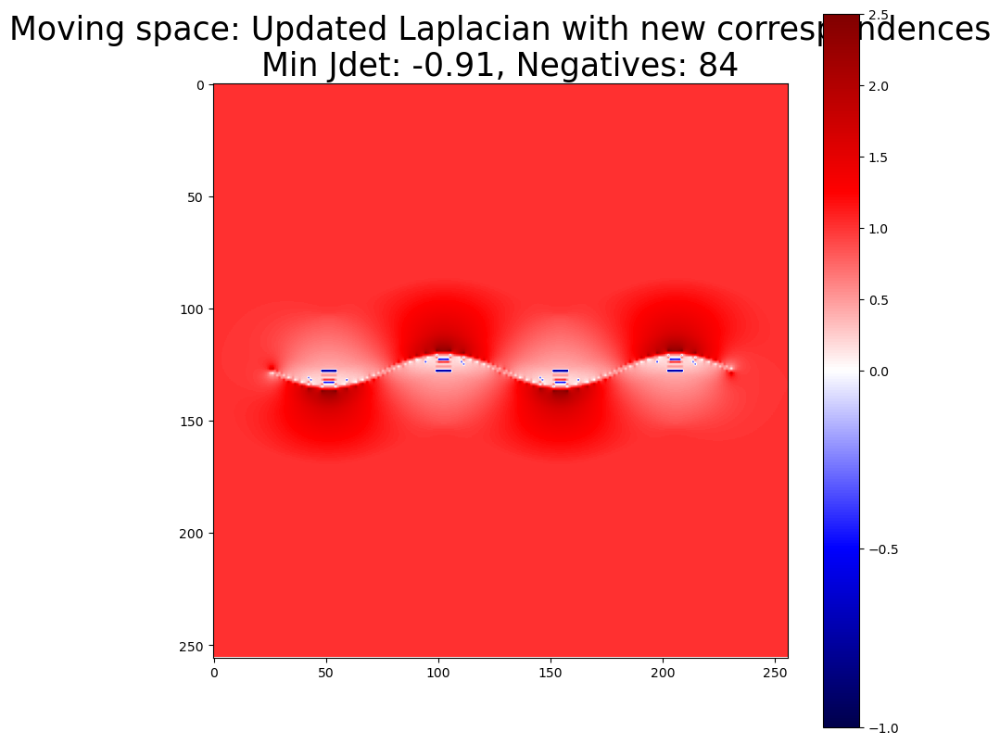

In [ ]:
scale = 3
jdet_threshold = 2.0
verbose = False
resolution = (256, 256)
# Remove point pairs where the distance between new_mpoints and new_fpoints is above a threshold
magnitude_thresh = 50  # 100 elsewhere
plot_points = True


# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)


#mpoints = mdata
#fpoints = fdata


# Create data classes
d_fixed = Data(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_moving = np.load("d_moving.npy", allow_pickle=True).item()
d_moving = Data_Moving(mpoints, fpoints, resolution)

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Moving space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")

#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
#       title=f"Fixed space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")


# Upscale the deformation fields
upscaled_fixed = upscale_dvf_preserve(d_fixed.deformation, scale=scale)
upscaled_moving = upscale_dvf_preserve(d_moving.deformation, scale=scale)



########### EDIT:  DO IT IN MOVING SPACE ###########
#d_moving = d_fixed


expanding_coord = get_expanding_coordinates(d_fixed.jdet_field, threshold=jdet_threshold, verbose=False)
# Remove points that occur in the fixed points set
expanding_coord = np.array([coord for coord in expanding_coord if tuple(coord) not in set(map(tuple, d_moving.fpoints[:, 1:]))])




# For each expanding coordinate, get the adjacent coordinates in the upscaled deformation field
print()

new_mpoints = []
new_fpoints = []
for y, x in expanding_coord:
    # Get the corresponding coordinates in the upscaled deformation field (now use upscaled_moving)
    
    """
    y_curr = y * scale
    x_curr = x * scale
    displacement_curr = upscaled_moving[:, 0, y_curr, x_curr]
    mapped_point_curr = np.array((y + displacement_curr[1], x + displacement_curr[2]))

    # Left and right coordinates in the upscaled deformation field
    x_left = x_curr - 1
    x_right = x_curr + 1
    y_up = y_curr - 1
    y_down = y_curr + 1

    displacement_left = upscaled_moving[:, 0, y_curr, x_left]
    displacement_right = upscaled_moving[:, 0, y_curr, x_right]
    displacement_up = upscaled_moving[:, 0, y_up, x_curr]
    displacement_down = upscaled_moving[:, 0, y_down, x_curr]

    mapped_point_left = np.array((y + displacement_left[1], x + displacement_left[2]))
    mapped_point_right = np.array((y + displacement_right[1], x + displacement_right[2]))
    mapped_point_up = np.array((y + displacement_up[1], x + displacement_up[2]))
    mapped_point_down = np.array((y + displacement_down[1], x + displacement_down[2]))

    # Of all of the mapped points, find the mapped point that is closest to an integer coordinate
    mapped_points = [mapped_point_left, mapped_point_right, mapped_point_up, mapped_point_down, mapped_point_curr]
    closest_point = min(mapped_points, key=lambda p: np.linalg.norm(p - np.round(p)))
    closest_point = np.round(closest_point).astype(int)
    """
    # Now, moving point is [0, y, x], fixed point is [0, closest_point[0], closest_point[1]]
    new_fpoints.append([0, y, x])
    #new_fpoints.append([0, closest_point[0], closest_point[1]])
    #new_mpoints = [np.round(get_mapped_point(f[1:], d_fixed.deformation)).astype(int) for f in new_fpoints]
    # Add zero to the first axis for Data class compatibility
    new_mpoints = [np.concatenate([[0], np.round(get_mapped_point(f[1:], d_fixed.deformation)).astype(int)]) for f in new_fpoints]

    #for f in new_fpoints:
    #f = m.copy()
    #m -= np.array([0, 0, 0])  # Adjust to (y, x) format
    #mapped_point = get_mapped_point(m[1:], d_fixed.deformation)
    #print(f"Fixed point: {m[1:]} -> displacement: {get_displacement(m[1:], d_fixed.deformation)[1:]}, \tmapped point: {get_mapped_point(m[1:], d_fixed.deformation)}, \tjacobian: {d_fixed.jdet_field[m[1], m[2]]}")
    #print(mapped_point)
    #plt.scatter(mapped_point[1], mapped_point[0], c='violet', s=1, label='Mapped Points')


# Convert to numpy arrays for consistency
new_mpoints = np.array(new_mpoints)
new_fpoints = np.array(new_fpoints)

###### Visualize the Jacobian determinant field with J > thresh ######
plt.figure(figsize=(15, 10))
jdet_field = d_fixed.jdet_field.copy()
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())

plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Connect moving and fixed points
plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='lime', s=1, label='Expanding points')
plt.title(f"Selected expanding points in fixed space (J > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()



print("New moving points shape:", new_mpoints.shape)
print("New fixed points shape:", new_fpoints.shape)

# Remove duplicates as before
new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])


# Compute distances for each pair
distances = np.linalg.norm(new_mpoints[:, 1:] - new_fpoints[:, 1:], axis=1)

# Create a mask for pairs within the threshold
mask = distances < magnitude_thresh

# Filter both arrays using the mask
new_mpoints = new_mpoints[mask]
new_fpoints = new_fpoints[mask]

print("Cleaned new moving points shape:", new_mpoints.shape)
print("Cleaned new fixed points shape:", new_fpoints.shape)

old_mpoints = mpoints.copy()
old_fpoints = fpoints.copy()


# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# ...existing code...
print("Cleaned new fixed points shape:", new_fpoints.shape)
print("Cleaned new moving points shape:", new_mpoints.shape)

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# Create a new Data object with the updated points
d_expanded = Data_Moving(mpoints, fpoints, resolution)  # 256x256 grid (320x456 for the real data)
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 20), binarize_negatives=False,
       title=f"Output: Laplacian with new correspondences (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
       title=f"Output: Laplacian with new correspondences (Moving space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")

###### Visualize the Jacobian determinant field with new correspondences ######
plt.figure(figsize=(15, 10))
jdet_field = d_expanded.jdet_field.copy()
norm = mcolors.TwoSlopeNorm(vmin=min(jdet_field.min(), -1), vcenter=0, vmax=jdet_field.max())
plt.imshow(jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
# Vectorized plotting for all correspondences
# Draw lines between new_mpoints and new_fpoints
if plot_points:
       plt.plot(
       np.stack([new_mpoints[:, 2], new_fpoints[:, 2]]),
       np.stack([new_mpoints[:, 1], new_fpoints[:, 1]]),
       c='black', linewidth=0.5, alpha=0.5
       )

       # Scatter all points at once
       plt.scatter(new_mpoints[:, 2], new_mpoints[:, 1], c='lime', s=1)
       plt.scatter(new_fpoints[:, 2], new_fpoints[:, 1], c='magenta', s=1)
       #plt.scatter(old_mpoints[:, 2], old_mpoints[:, 1], c='green', s=1, label='Moving points', alpha=1)  # 0.15
       #plt.scatter(old_fpoints[:, 2], old_fpoints[:, 1], c='magenta', s=1, label='Fixed points', alpha=1)
       
#plt.grid(True, which='both', linestyle='--', linewidth=0.25)
#plt.gca().invert_yaxis()
plt.title(f"Augmented correspondences on mouse brain section 3 (t > {jdet_threshold:.1f})", fontsize=20)
plt.legend()
plt.show()

from copy import deepcopy
d_new = deepcopy(d_moving)
# Compute displacements for new correspondences
for mpoint, fpoint in zip(new_mpoints, new_fpoints):
    # mpoint and fpoint are [0, y, x]
    y, x = mpoint[1:]
    fy, fx = fpoint[1:]
    disp_y = fy - y
    disp_x = fx - x
    # Update the deformation field at (y, x)
    # Assuming d_expanded.deformation has shape (3, 1, H, W)
    print(f"mpoint: {mpoint}, fpoint: {fpoint}")
    print(f"Old displacement at ({y}, {x}): ({d_fixed.deformation[1, 0, y, x]}, {d_fixed.deformation[2, 0, y, x]})")
    d_new.deformation[1, 0, y, x] = disp_y
    d_new.deformation[2, 0, y, x] = disp_x
    print(f"New displacement at ({y}, {x}): ({d_new.deformation[1, 0, y, x]}, {d_new.deformation[2, 0, y, x]})")
    
d_new.jdet_field = jacobian.sitk_jacobian_determinant(d_new.deformation)[0]
d_new.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Updated Laplacian with new correspondences\nMin Jdet: {d_new.min():.2f}, Negatives: {d_new.count_negatives()}")
# Save to raw image
#moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
#fixed_img = data_utils.create_raw_image(d_fixed.fpoints, resolution, save_path="wave2.png")
#transformed_img = reg_utils.apply_transformation(d_expanded, moving_img, title="Transformed Image (Moving space)")


=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10


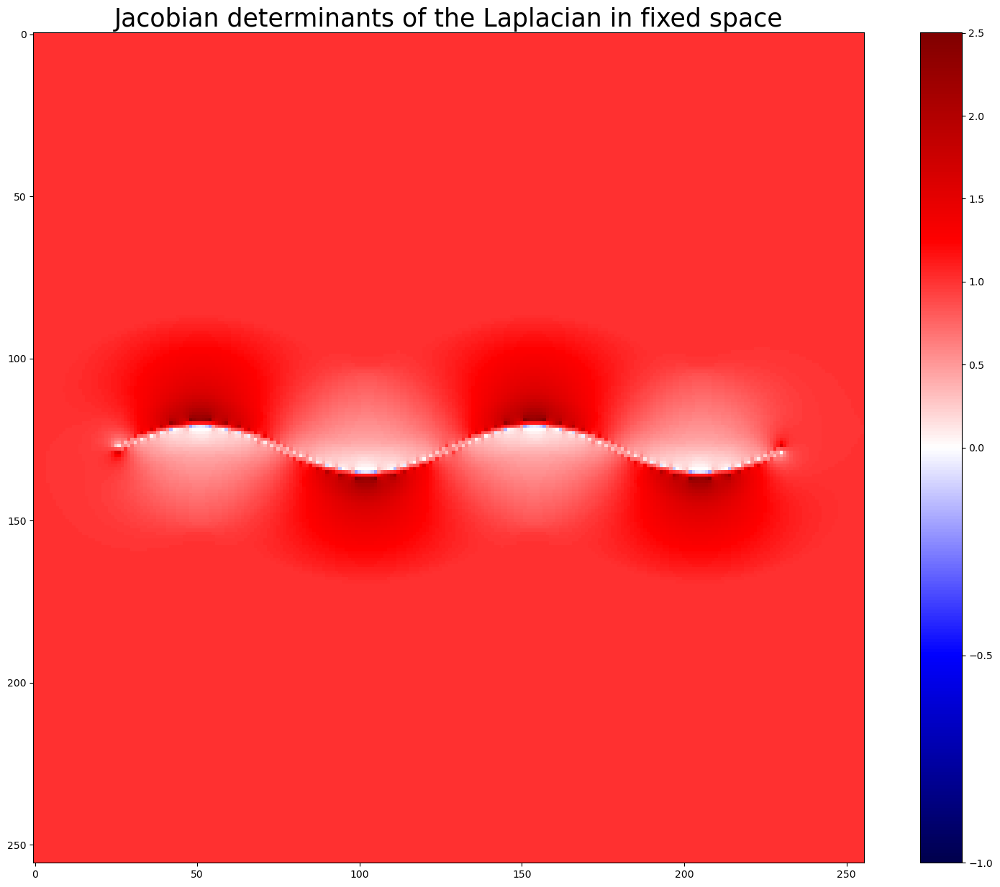

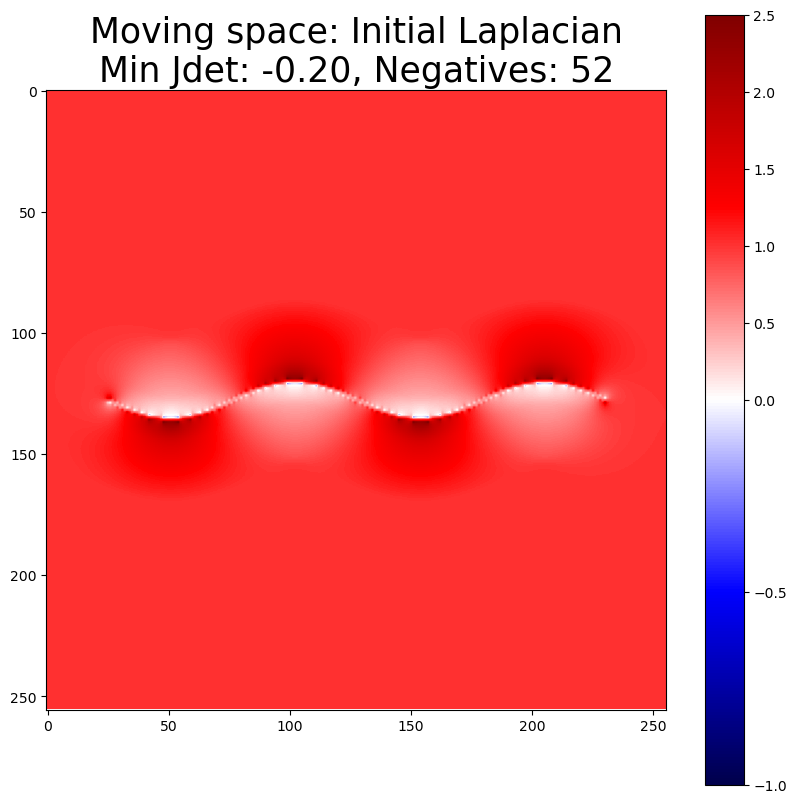

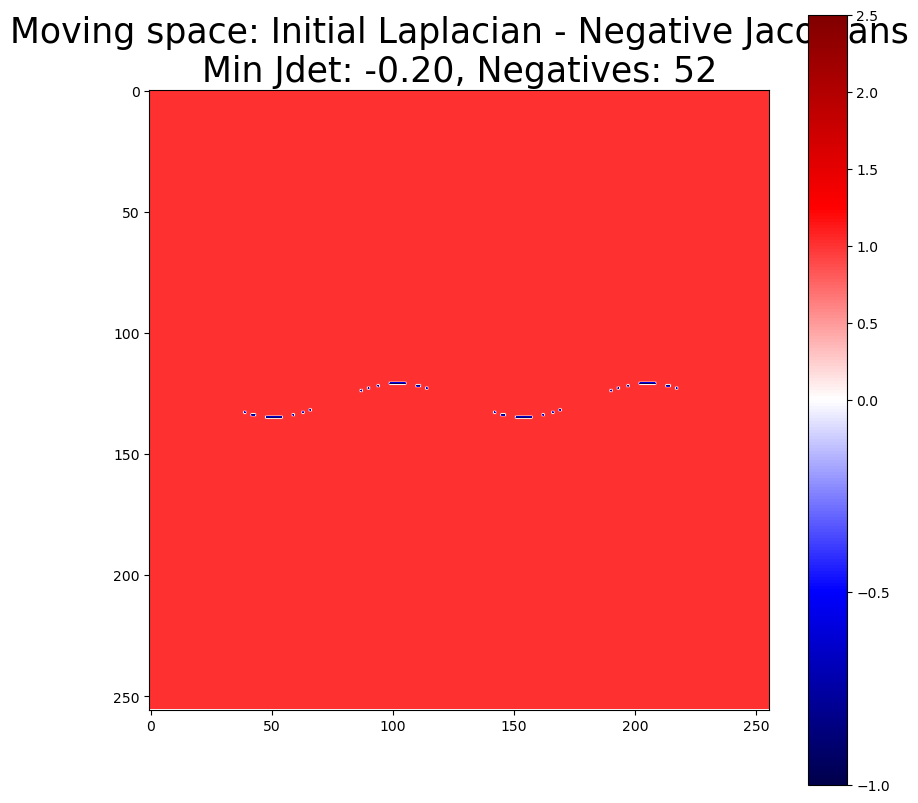

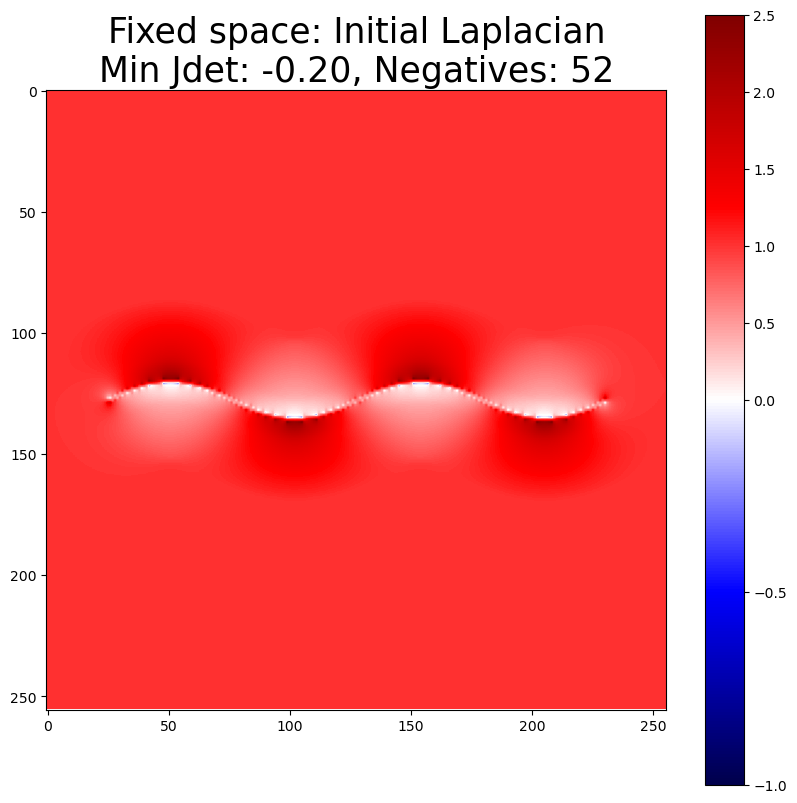

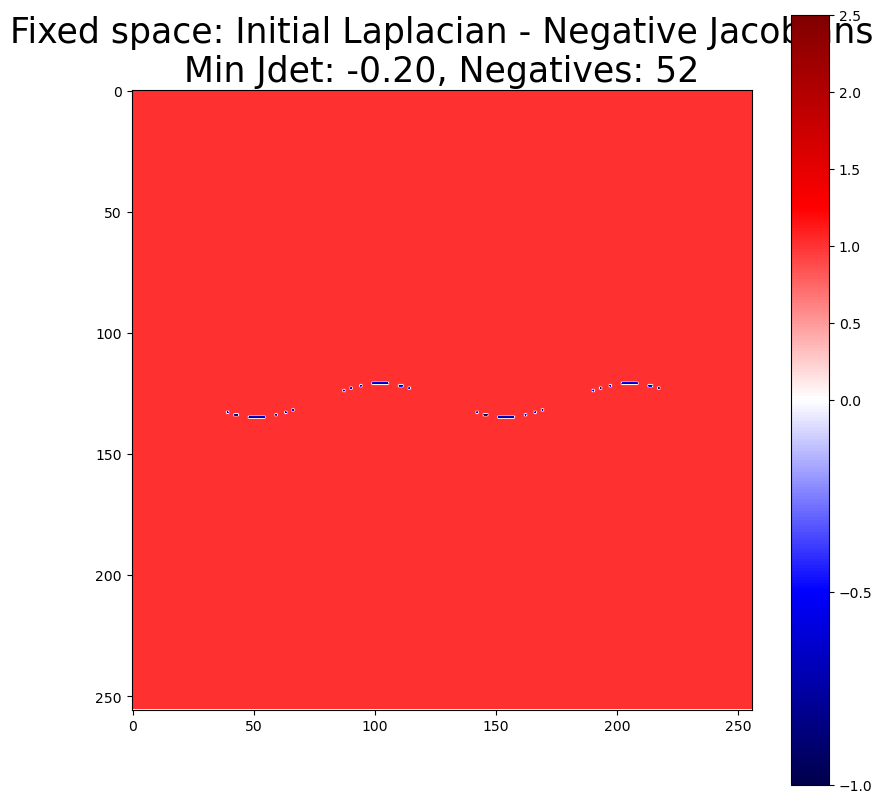

Found 96 expanding Jacobian determinants with threshold 2.0.

New fixed points shape: (96, 3)
New moving points shape: (96, 3)
Cleaned new fixed points shape: (96, 3)
Cleaned new moving points shape: (96, 3)


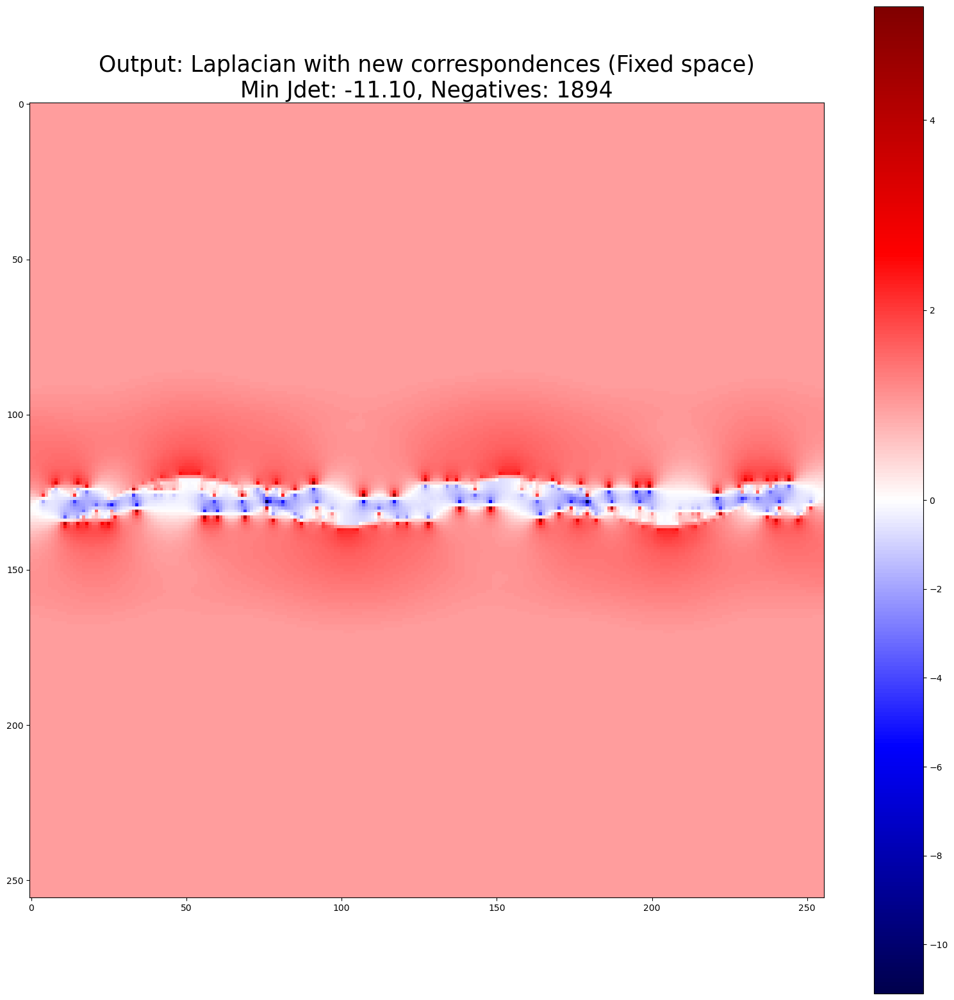

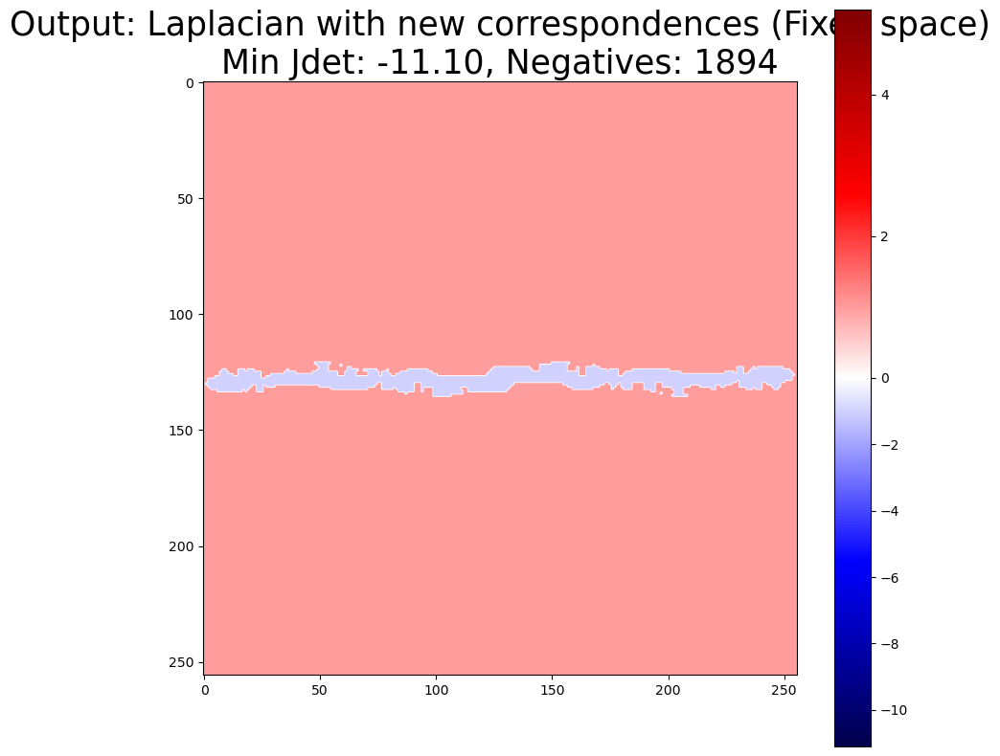

Old displacement at (117, 99): (-3.3693268272163555, 0.0)
New displacement at (117, 99): (11.912665193388165, 0.0)
Old displacement at (117, 100): (-3.409449114148283, 0.0)
New displacement at (117, 100): (12.149447128479864, 0.0)
Old displacement at (117, 101): (-3.4349095536702263, 0.0)
New displacement at (117, 101): (12.287299016202581, 0.0)
Old displacement at (117, 102): (-3.445638297916785, 0.0)
New displacement at (117, 102): (12.334840437159016, 0.0)
Old displacement at (117, 103): (-3.441345879855852, 0.0)
New displacement at (117, 103): (12.29831179060298, 0.0)
Old displacement at (117, 104): (-3.4218348148784714, 0.0)
New displacement at (117, 104): (12.173732898572297, 0.0)
Old displacement at (117, 105): (-3.3880655050699566, 0.0)
New displacement at (117, 105): (11.952406829362502, 0.0)
Old displacement at (117, 202): (-3.37017301686882, 0.0)
New displacement at (117, 202): (11.912674077653804, 0.0)
Old displacement at (117, 203): (-3.411451487400671, 0.0)
New displaceme

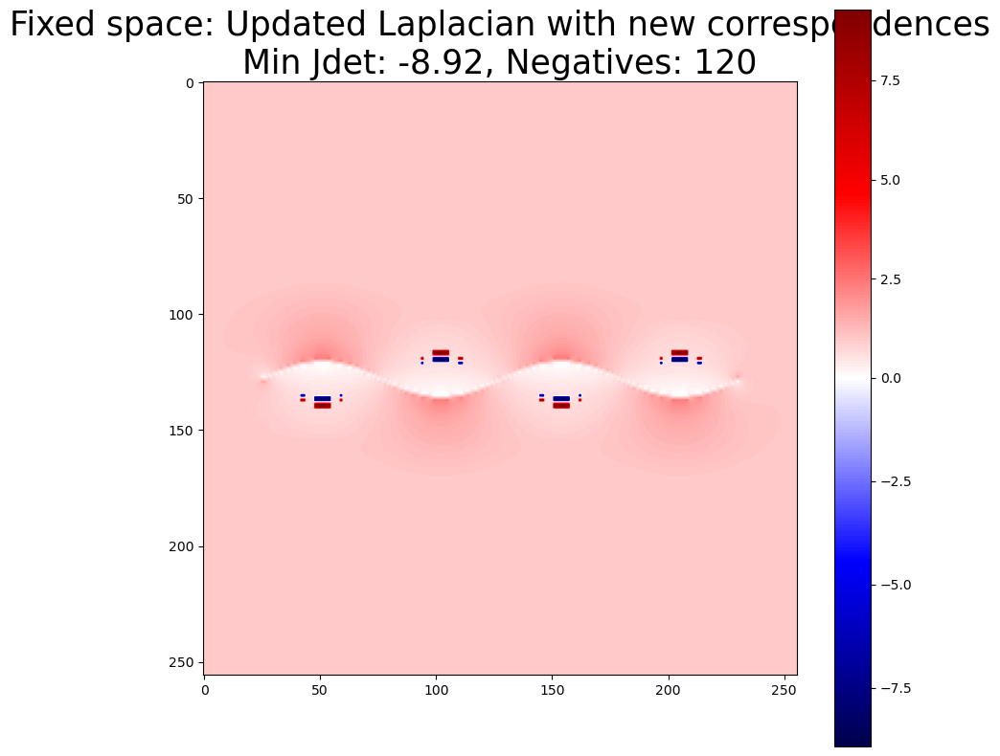

In [20]:
scale = 3
jdet_threshold = 2.0
verbose = False
resolution = (256, 256)
# Remove point pairs where the distance between new_mpoints and new_fpoints is above a threshold
magnitude_thresh = 9999  # 100 elsewhere
plot_points = True


# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
mpoints, fpoints, _ = data_utils.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False, horizontal=False,  # Set horizontal to False for vertical helix
)

mpoints = mpoints[:, [1, 0]]  # Swap to (y, x) format
fpoints = fpoints[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
mpoints = np.pad(mpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)
fpoints = np.pad(fpoints, ((0, 0), (1, 0)), mode='constant', constant_values=0)

#mpoints = mdata
#fpoints = fdata

d_fixed = Data(mpoints, fpoints, resolution)
#d_moving = np.load("d_moving.npy", allow_pickle=True).item()
#d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 15),
#       title=f"Jacobian determinants of the Laplacian in moving space")
d_moving = Data_Moving(mpoints, fpoints, resolution)

upscaled_fixed = upscale_dvf_preserve(d_fixed.deformation, scale=scale)
upscaled_moving = upscale_dvf_preserve(d_moving.deformation, scale=scale)

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 15), binarize_negatives=False,
       title=f"Jacobian determinants of the Laplacian in fixed space")


d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Moving space: Initial Laplacian\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
       title=f"Moving space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_moving.min():.2f}, Negatives: {d_moving.count_negatives()}")

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Fixed space: Initial Laplacian\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")

d_moving.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
       title=f"Fixed space: Initial Laplacian - Negative Jacobians\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")


########### EDIT:  DO IT IN MOVING SPACE ###########
#d_fixed = d_moving


expanding_coord = get_expanding_coordinates(d_moving.jdet_field, threshold=jdet_threshold, verbose=False)
# Remove points that occur in the fixed points set
expanding_coord = np.array([coord for coord in expanding_coord if tuple(coord) not in set(map(tuple, d_moving.fpoints[:, 1:]))])

# For each expanding coordinate, get the adjacent coordinates in the upscaled deformation field
print()

new_mpoints = []
new_fpoints = []
for y, x in expanding_coord:
    # Get the corresponding coordinates in the upscaled deformation field
    y_curr = y * scale
    x_curr = x * scale
    displacement_curr = upscaled_fixed[:, 0, y_curr, x_curr]
    mapped_point_curr = np.array((y + displacement_curr[1], x + displacement_curr[2]))
    
    # Left and right coordinates in the upscaled deformation field
    x_left = x_curr - 1
    x_right = x_curr + 1
    y_up = y_curr - 1
    y_down = y_curr + 1
    
    displacement_left = upscaled_fixed[:, 0, y_curr, x_left]
    displacement_left_1 = upscaled_fixed[:, 0, y_curr, x_left - 1]
    displacement_right = upscaled_fixed[:, 0, y_curr, x_right]
    displacement_right_1 = upscaled_fixed[:, 0, y_curr, x_right + 1]
    displacement_up = upscaled_fixed[:, 0, y_up, x_curr]
    displacement_up_1 = upscaled_fixed[:, 0, y_up - 1, x_curr]
    displacement_down = upscaled_fixed[:, 0, y_down, x_curr]
    displacement_down_1 = upscaled_fixed[:, 0, y_down + 1, x_curr]
    
    mapped_point_left = np.array((y + displacement_left[1], x + displacement_left[2]))
    mapped_point_left_1 = np.array((y + displacement_left_1[1], x + displacement_left_1[2]))
    mapped_point_right = np.array((y + displacement_right[1], x + displacement_right[2]))
    mapped_point_right_1 = np.array((y + displacement_right_1[1], x + displacement_right_1[2]))
    mapped_point_up = np.array((y + displacement_up[1], x + displacement_up[2]))
    mapped_point_up_1 = np.array((y + displacement_up_1[1], x + displacement_up_1[2]))
    mapped_point_up_neighbor = np.array((y - 1 + upscaled_fixed[:, 0, y_curr - 3], x + upscaled_fixed[:, 0, y_curr - 3]))
    mapped_point_down = np.array((y + displacement_down[1], x + displacement_down[2]))
    mapped_point_down_1 = np.array((y + displacement_down_1[1], x + displacement_down_1[2]))
    
    # Print the information
    if verbose:
        print(f"Expanding coordinate ({y}, {x}) in original field corresponds to ({y_curr}, {x_curr}) in upscaled field.")
        print(f"Deformation vector at this point: {displacement_curr}")
        #print(f"Mapped point in moving space: {mapped_point_curr} = {np.round(mapped_point_curr)}")
        
        #print(f"Left point - 2 ({y_curr//scale}, {(x_left-1)/scale:.2f}) -> Mapped: {mapped_point_left_1} = {np.round(mapped_point_left_1)}")
        print(f"Left point - 1 \t({y_curr//scale}, {x_left/scale:.2f}) \t-> Mapped: {mapped_point_left} = {np.round(mapped_point_left)}")
        
        #print(f"Right point + 2 ({y_curr//scale}, {(x_right + 1)/scale:.2f}) -> Mapped: {mapped_point_right_1} = {np.round(mapped_point_right_1)}")
        #print(f"Up neighbor \t({(y_up - 2)//scale}, {x_curr//scale}) \t-> Mapped: {mapped_point_up_neighbor} = {np.round(mapped_point_up_neighbor)}")
        #print(f"Up point - 2 \t({(y_up - 1)/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_up_1} = {np.round(mapped_point_up_1)}")
        print(f"Up point - 1 \t({y_up/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_up} = {np.round(mapped_point_up)}")
        print(f"Current point \t({y_curr//scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_curr} = {np.round(mapped_point_curr)}")
        print(f"Down point + 1\t({y_down/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_down} = {np.round(mapped_point_down)}")
        print(f"Right point + 1\t({y_curr//scale}, {x_right/scale:.2f}) \t-> Mapped: {mapped_point_right} = {np.round(mapped_point_right)}")
        #print(f"Down point + 2 \t({(y_down + 1)/scale:.2f}, {x_curr//scale}) \t-> Mapped: {mapped_point_down_1} = {np.round(mapped_point_down_1)}")
    
    # Of all of the mapped points, find the mapped point that is closest to an integer coordinate
    mapped_points = [mapped_point_left, mapped_point_right, mapped_point_up, mapped_point_down, mapped_point_curr]
    closest_point = min(mapped_points, key=lambda p: np.linalg.norm(p - np.round(p)))
    if verbose:
        print(f"Closest mapped point to integer coordinate: {closest_point} = {np.round(closest_point)}")
        print()
        print()
        
    #closest_point = np.round(closest_point).astype(int)

    #new_fpoints.append([0, y, x])
    #new_mpoints.append([0, closest_point[0], closest_point[1]])
    
    # Now, moving point is [0, y, x], fixed point is [0, closest_point[0], closest_point[1]]
    new_mpoints.append([0, y, x])
    #new_fpoints.append([0, closest_point[0], closest_point[1]])
    #new_fpoints = [np.round(get_mapped_point(f[1:], d_moving.deformation)).astype(int) for f in new_mpoints]
    # Add zero to the first axis for Data class compatibility
    #new_fpoints = [np.concatenate([[0], np.round(get_mapped_point(f[1:], d_moving.deformation)).astype(int)]) 
    #               for f in new_mpoints]
    
    new_fpoints = [np.concatenate([[0], get_mapped_point(f[1:], d_moving.deformation)]) 
                   for f in new_mpoints]
    
    
    
# Convert to numpy arrays for consistency
new_fpoints = np.array(new_fpoints)
new_mpoints = np.array(new_mpoints)
    
print("New fixed points shape:", new_fpoints.shape)
print("New moving points shape:", new_mpoints.shape)


# Remove duplicates as before
new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])

new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])


# Compute distances for each pair
distances = np.linalg.norm(new_mpoints[:, 1:] - new_fpoints[:, 1:], axis=1)

# Create a mask for pairs within the threshold
mask = distances < magnitude_thresh

# Filter both arrays using the mask
new_mpoints = new_mpoints[mask]
new_fpoints = new_fpoints[mask]


# If a new moving point is already in the original mpoints, remove it and its corresponding fixed point
#new_mpoints = np.array([mp for mp in new_mpoints if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])
#new_fpoints = np.array([fp for fp, mp in zip(new_fpoints, new_mpoints) if tuple(mp[1:]) not in set(map(tuple, mpoints[:, 1:]))])

# If a new fixed point is already in the original fpoints, remove it and its corresponding moving point
#new_fpoints = np.array([fp for fp in new_fpoints if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])
#new_mpoints = np.array([mp for mp, fp in zip(new_mpoints, new_fpoints) if tuple(fp[1:]) not in set(map(tuple, fpoints[:, 1:]))])  

print("Cleaned new fixed points shape:", new_fpoints.shape)
print("Cleaned new moving points shape:", new_mpoints.shape)

# Add to original set of correspondences
mpoints = np.vstack((mpoints, new_mpoints))
fpoints = np.vstack((fpoints, new_fpoints))

# Create a new Data object with the updated points
d_expanded = Data(mpoints, fpoints, resolution)
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(20, 20), binarize_negatives=False,
       title=f"Output: Laplacian with new correspondences (Fixed space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")
d_expanded.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=True,
       title=f"Output: Laplacian with new correspondences (Fixed space)\nMin Jdet: {d_expanded.min():.2f}, Negatives: {d_expanded.count_negatives()}")

# Compute displacements for new correspondences
for mpoint, fpoint in zip(new_mpoints, new_fpoints):
    # mpoint and fpoint are [0, y, x]
    y, x = mpoint[1:]
    fy, fx = fpoint[1:]
    disp_y = fy - y
    disp_x = fx - x
    # Update the deformation field at (y, x)
    # Assuming d_expanded.deformation has shape (3, 1, H, W)
    print(f"Old displacement at ({y}, {x}): ({d_fixed.deformation[1, 0, y, x]}, {d_fixed.deformation[2, 0, y, x]})")
    d_fixed.deformation[1, 0, y, x] = disp_y
    d_fixed.deformation[2, 0, y, x] = disp_x
    print(f"New displacement at ({y}, {x}): ({d_fixed.deformation[1, 0, y, x]}, {d_fixed.deformation[2, 0, y, x]})")
    
    

d_fixed.jdet_field = jacobian.sitk_jacobian_determinant(d_fixed.deformation)[0]

d_fixed.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False, figsize=(10, 10), binarize_negatives=False,
       title=f"Fixed space: Updated Laplacian with new correspondences\nMin Jdet: {d_fixed.min():.2f}, Negatives: {d_fixed.count_negatives()}")


# Save to raw image
#moving_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave1.png")
#fixed_img = data_utils.create_raw_image(d_fixed.mpoints, resolution, save_path="wave2.png")

#original_transformation = reg_utils.apply_transformation_fixed(d_fixed, brain_img, title="Mouse brain section 1 - original transformation")
#transformed_img = reg_utils.apply_transformation_fixed(d_expanded, brain_img, title="Mouse brain section 1 - augmented correspondences")


# Generate paper header image

In [21]:
b0039_path = "data/b0039_brain_25.nii.gz"
elastixRefined_path = "data/corrected_correspondences_count_touching/registered_output/elastixRefined.nii.gz"
annotation_path = "data/CCF_DATA/annotation_25.nii.gz"
average_path = "data/CCF_DATA/average_template_25.nii.gz"
moving_path = "data/corrected_correspondences_count_touching/mpoints.npy"
fixed_path = "data/corrected_correspondences_count_touching/fpoints.npy"

CURR_IDX = 500
font_size = 20

#################################################################################################

# Load the moving and fixed points
mpoints = np.load(moving_path, allow_pickle=True)
fpoints = np.load(fixed_path, allow_pickle=True)

# Get only coordinates at the current z index
mpoints = mpoints[mpoints[:, 0] == CURR_IDX]
fpoints = fpoints[fpoints[:, 0] == CURR_IDX]

# Zero out the first axis values to match a 2D image format
mpoints[:, 0] = 0
fpoints[:, 0] = 0

# Load the data volume image
import nibabel as nib
b0039 = nib.load(b0039_path).get_fdata()  # Get the specific z slice
refined_img = nib.load(elastixRefined_path).get_fdata()[CURR_IDX, :, :]  # Get the specific z slice

# Load the annotation and average images
annotation_img = nib.load(annotation_path).get_fdata()[CURR_IDX, :, :]  # Get the specific z slice
average_img = nib.load(average_path).get_fdata()[CURR_IDX, :, :]  # Get the specific z slice

# Create a Data object with the loaded points
d_loaded = Data(mpoints, fpoints, resolution=(refined_img.shape[0], refined_img.shape[1]))

In [22]:
import cv2

def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img

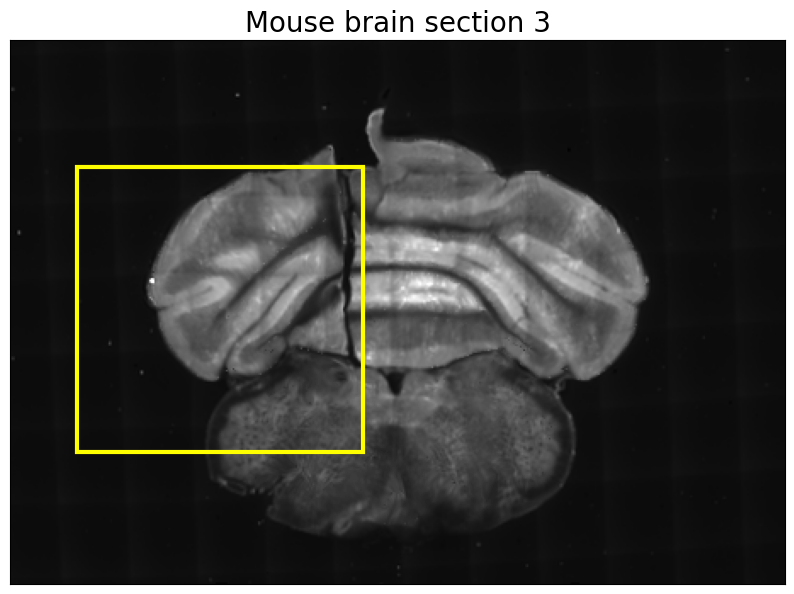

In [23]:
# slice 200, skip 2 window offset 40 offset -15 for y
# ylim = (79, 88)
# xlim = (275, 284)

# For 350: skip 3, window offset 100, max dist 10
# (235 - 23, 242 - 23)
# (197, 204)
# For 350: skip 3, window offset 100 (new 50), max dist 10
# (212, 219)
# (197, 204)

# For 500: skip 3, max dist 50, window offset 80, offset 80 (new 70)
# 84 92
# 119 127

#jylim = (235 - 23 - 100, 242 - 23 + 100)
#jxlim = (197 - 100, 204 + 100)

jylim = (84 - 80 + 70, 92 + 80 + 70)
jxlim = (119 - 80, 127 + 80)

box_coords = [
    (jylim[0], jxlim[0]),  # top-left
    (jylim[0], jxlim[1]),  # top-right
    (jylim[1], jxlim[1]),  # bottom-right
    (jylim[1], jxlim[0])   # bottom-left
]

# Compute bounding box
ys, xs = zip(*box_coords)
min_x, max_x = min(xs), max(xs)
min_y, max_y = min(ys), max(ys)
width = max_x - min_x
height = max_y - min_y

# Moving image - elastixRefined
plt.figure(figsize=(10, 10))
plt.imshow(auto_contrast(refined_img, alpha=0.45), cmap='gray')
ax = plt.gca()
rect = patches.Rectangle((min_x, min_y), width, height, linewidth=3, edgecolor='yellow', facecolor='none')
ax.add_patch(rect)

plt.title(f"Mouse brain section 3", fontsize=font_size)
plt.xticks([])
plt.yticks([])
plt.show()

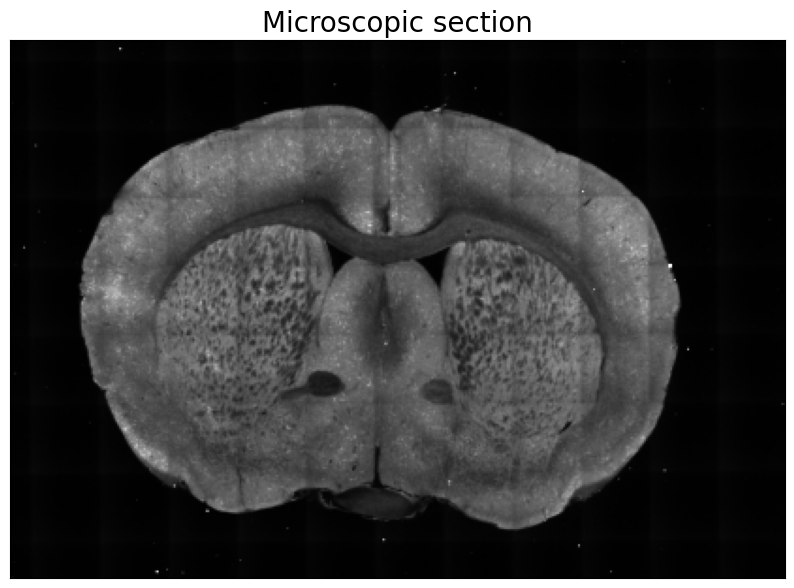

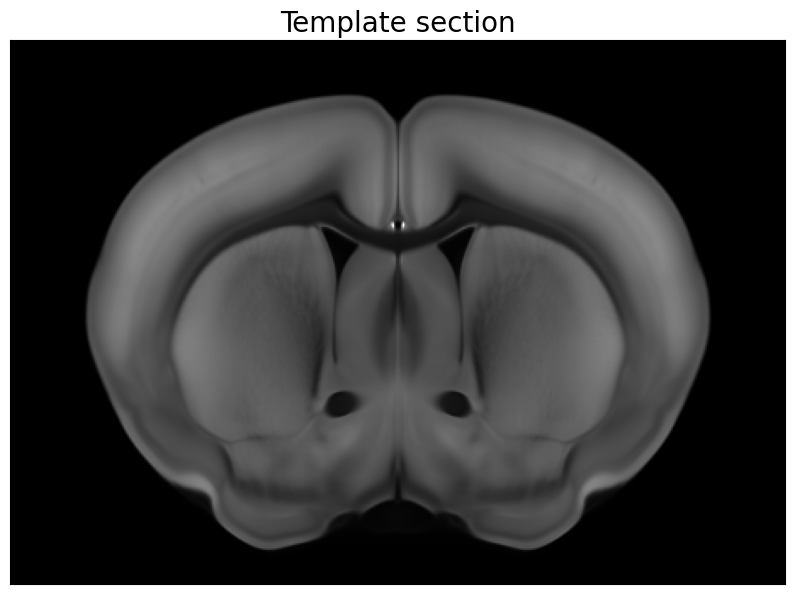

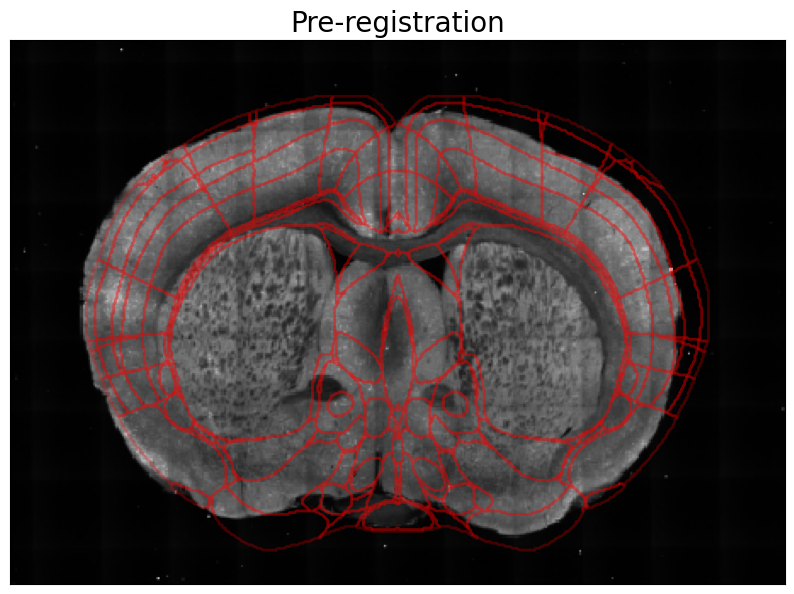

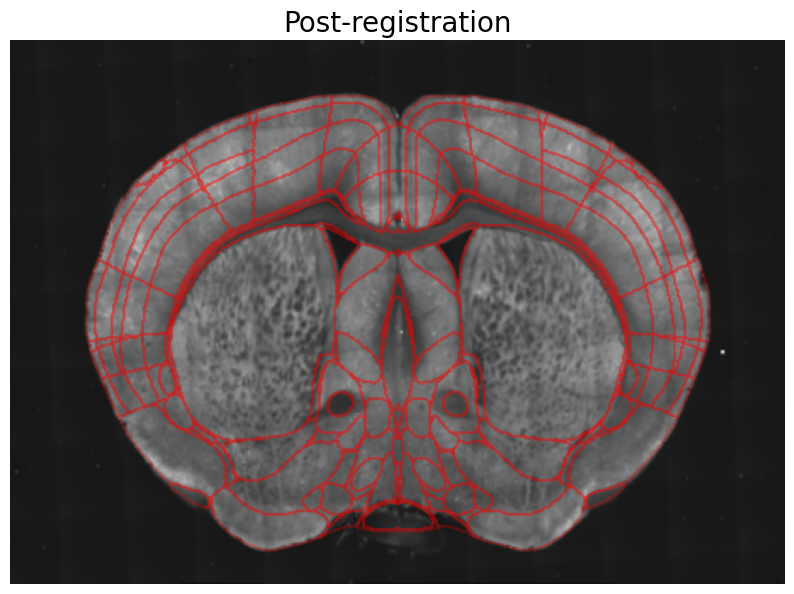

In [28]:
from skimage import measure
from functools import partial

before_reg = auto_contrast(b0039[92], alpha=0.45)[50:-100, 100:-50]  # Crop the image to match the annotation size

# Moving image 
plt.figure(figsize=(10, 10))
plt.imshow(before_reg, cmap='gray')
plt.title("Microscopic section", fontsize=font_size)
plt.xticks([])
plt.yticks([])
plt.show()

# Fixed image - average annotation
plt.figure(figsize=(10, 10))
plt.imshow(average_img, cmap='gray')
plt.title("Template section", fontsize=font_size)
plt.xticks([])
plt.yticks([])
plt.show()

# Before registration (show outline of annotation regions on the moving image)
# Resize the annotation image to match the moving image size
before_reg = cv2.resize(before_reg, (456, 320), interpolation=cv2.INTER_NEAREST)

plt.figure(figsize=(10, 10))
plt.imshow(before_reg, cmap='gray')
plt.title("Pre-registration", fontsize=font_size)
# For each label (skip background 0)
for label in range(1, int(annotation_img.max()) + 1):
    contours = measure.find_contours(annotation_img == label, 0.5)
    for contour in contours:
        plt.plot(contour[:, 1], contour[:, 0], linewidth=2, color='red', alpha=0.25)
plt.xticks([])
plt.yticks([])
plt.show()

# Apply registration
plt.figure(figsize=(10, 10))
deformation_field = d_loaded.deformation  # Get the deformation field (dx, dy, dz)
transformedData = reg_utils.geometric_transform(refined_img, 
                                        partial(reg_utils.shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]), order=1, prefilter=False)
#transformedData = transformedData[0, :, :]  # Get the first channel only
plt.imshow(refined_img, cmap='gray')
# For each label (skip background 0)
for label in range(1, int(annotation_img.max()) + 1):
    contours = measure.find_contours(annotation_img == label, 0.5)
    for contour in contours:
        plt.plot(contour[:, 1], contour[:, 0], linewidth=2, color='red', alpha=0.25)
plt.title("Post-registration", fontsize=font_size)
plt.axis('off')  # Hide axes
plt.show()